In [ ]:
!pip install statsmodels --upgrade

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 9.8 MB 34.7 MB/s 
  Attempting uninstall: statsmodels
    Found existing installation: statsmodels 0.12.2
    Uninstalling statsmodels-0.12.2:
      Successfully uninstalled statsmodels-0.12.2


In [ ]:
pip install python_papi

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 849.3/849.3 kB 6.1 MB/s eta 0:00:00


In [ ]:
import tensorflow as tf
print(tf. __version__)

2.12.0


In [ ]:
# Necessary imports
import pandas as pd
import numpy as np
import pickle
from tqdm.notebook import tqdm
from matplotlib import pyplot as plt

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# **Data Processing**

In [ ]:
# Path to the dataset (assuming it is in the same directory as the notebook)
path = '/content/drive/MyDrive/FYP/dataset/dataset_OSAS.pickle'

# Loading the dataset
with open(path, 'rb') as file:
    dataset = pickle.load(file)

display(dataset.head())

display(dataset.dtypes)

,patient,timestamp_datetime,HR(bpm),SpO2(%),PI(%),RR(rpm),PVCs(/min),event,anomaly,signal_pleth,signal_ecg_i,signal_ecg_ii,signal_ecg_iii,PSG_Abdomen,PSG_Flow,PSG_Position,PSG_Snore,PSG_Thorax
0,1,2019-07-29 21:00:36,63.0,NaN,NaN,12.0,0.0,NONE,False,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[122, 121, 121, 120, 121, 123, 124, 125, 125, ...","[122, 121, 121, 120, 120, 122, 123, 124, 125, ...","[128, 128, 129, 128, 127, 127, 127, 128, 128, ...","[-0.8741500623767957, -0.9144675352463544, -0....","[-2.96563402995406, -2.9595796764374294, -2.95...","[-0.47401902530550133, -0.4739045513646679, -0...","[0.07924500093530636, 0.03509163903208667, 0.1...","[-0.3731332842321416, -0.3840816526328088, -0...."
1,1,2019-07-29 21:00:37,63.0,NaN,NaN,12.0,0.0,NONE,False,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[124, 125, 125, 124, 124, 124, 124, 124, 124, ...","[123, 124, 123, 123, 123, 122, 123, 123, 123, ...","[127, 127, 127, 127, 127, 126, 127, 128, 127, ...","[-0.9881929400632088, -0.9477638031010281, -0....","[-1.361721983810798, -0.5937676928280333, 0.10...","[-0.47401917910760316, -0.4739043984870266, -0...","[0.1730628474409785, 0.05274774088651335, 0.07...","[-0.3271092235750278, -0.34422787330023297, -0..."
2,1,2019-07-29 21:00:38,64.0,NaN,NaN,12.0,0.0,NONE,False,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[124, 124, 124, 124, 123, 124, 124, 124, 124, ...","[123, 124, 124, 124, 124, 124, 124, 124, 124, ...","[127, 128, 128, 128, 129, 128, 128, 128, 128, ...","[0.08614440036034249, 0.2516121296765992, 0.42...","[1.106683267015266, 1.0603761242579164, 1.0141...","[-0.4740193239619996, -0.47390425449218476, -0...","[0.17804040728101125, 0.11939900653197982, 0.1...","[-0.12950805941595078, -0.11899340882221601, -..."
3,1,2019-07-29 21:00:39,64.0,NaN,NaN,12.0,0.0,NONE,False,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[124, 124, 124, 124, 123, 124, 123, 123, 124, ...","[126, 126, 126, 126, 126, 125, 126, 126, 126, ...","[130, 130, 130, 130, 131, 129, 131, 131, 131, ...","[1.1531959630520392, 1.1005866213221034, 1.014...","[-0.9214725025271104, -0.9771933825390473, -1....","[-0.4740194604923075, -0.4739041187620709, -0....","[0.04909074879934492, 0.1211243456818879, 0.20...","[0.014197466691675964, 0.05145753481049522, 0...."
4,1,2019-07-29 21:00:40,64.0,NaN,NaN,12.0,0.0,NONE,False,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[123, 124, 125, 124, 124, 124, 124, 124, 124, ...","[128, 127, 126, 125, 126, 127, 126, 125, 125, ...","[133, 131, 129, 129, 130, 131, 130, 130, 129, ...","[-0.42549812754662325, -0.5447443993201948, -0...","[-1.035218708573095, -1.0000002320633845, -0.9...","[-0.47401958926922777, -0.47390399073098, -0.4...","[0.020529048615559067, 0.5111613725192, 0.0863...","[-0.004534125269965855, -0.04243555140344553, ..."


patient                       object
timestamp_datetime    datetime64[ns]
HR(bpm)                      float64
SpO2(%)                      float64
PI(%)                        float64
RR(rpm)                      float64
PVCs(/min)                   float64
event                         object
anomaly                      boolean
signal_pleth                  object
signal_ecg_i                  object
signal_ecg_ii                 object
signal_ecg_iii                object
PSG_Abdomen                   object
PSG_Flow                      object
PSG_Position                  object
PSG_Snore                     object
PSG_Thorax                    object
dtype: object

In [ ]:
pleth = []
ecgi = []
ecgii = []
ecgiii = []
event = []
anomaly = []
event_corrected = []

for pat in np.unique(dataset['patient'])[np.argsort(np.unique(dataset['patient']).astype(np.int8))]:
  if pat == '3':
    # retrieve PPG signals for patient 3 to an array
    temp = dataset[dataset['patient'] == pat]
    temp_pleth = temp['signal_pleth']
    for x in temp_pleth:
      pleth.append(x)

    # retrieve ECG lead i signals for patient 3 to an array
    temp = dataset[dataset['patient'] == pat]
    temp_ecgi = temp['signal_ecg_i']
    for x in temp_ecgi:
      ecgi.append(x)

    # retrieve ECG lead ii signals for patient 3 to an array
    temp = dataset[dataset['patient'] == pat]
    temp_ecgii = temp['signal_ecg_ii']
    for x in temp_ecgii:
      ecgii.append(x)

    # retrieve ECG lead iii signals for patient 3 to an array
    temp = dataset[dataset['patient'] == pat]
    temp_ecgiii = temp['signal_ecg_iii']
    for x in temp_ecgiii:
      ecgiii.append(x)

    # retrieve PSG abdomen signals for patient 3 to an array
    temp = dataset[dataset['patient'] == pat]
    temp_psgAbdomen = temp['PSG_Abdomen']
    psgAbdomen = []
    for x in temp_psgAbdomen:
      psgAbdomen.append(x)

    # retrieve event labels for patient 3 to an array
    temp = dataset[dataset['patient'] == pat]
    temp_event = temp['event']
    for x in temp_event:
      event.append(x)

    # retrieve event labels for patient 3 to an array
    temp = dataset[dataset['patient'] == pat]
    temp_anomaly = temp['anomaly']
    for x in temp_anomaly:
      anomaly.append(x)

    # retrieve event labels for patient 3 to an array and extend it
    temp = dataset[dataset['patient'] == pat]
    temp_event = temp['event']
    for x in temp_event:
      x = [x] * 40
      event_corrected.append(x)

combine = np.dstack([np.array(pleth), np.array(ecgi)])
print(combine.shape)

pleth = np.array(pleth).flatten()
print('length of PPG', len(pleth))
ecgi = np.array(ecgi).flatten()
print('length of ECG lead i',len(ecgi))
ecgii = np.array(ecgii).flatten()
print('length of ECG lead ii', len(ecgii))
ecgiii = np.array(ecgiii).flatten()
print('length of ECG lead iii', len(ecgii))
psgAbdomen = np.array(psgAbdomen).flatten()
print('length of PSG Abdomen', len(psgAbdomen))
event = np.array(event).flatten()
print('length of event labels', len(event))
anomaly = np.array(anomaly).flatten()
print('length of anomaly', len(anomaly))
event_corrected = np.array(event_corrected).flatten()
print('length of event corrected labels', len(event_corrected))

(25682, 80, 2)
length of PPG 2054560
length of ECG lead i 2054560
length of ECG lead ii 2054560
length of ECG lead iii 2054560
length of PSG Abdomen 256820
length of event labels 25682
length of anomaly 25682
length of event corrected labels 1027280


In [ ]:
# np.savetxt('/content/drive/MyDrive/FYP/dataset/data.csv', combine.reshape(combine.shape[0], -1), delimiter=',')
combine = np.loadtxt('/content/drive/MyDrive/FYP/dataset/data.csv', delimiter=',')
combine = combine.reshape(combine.shape[0], 80, 2)
print(combine.shape)

# np.savetxt('/content/drive/MyDrive/FYP/dataset/event.csv', event_corrected, fmt="%s", delimiter=',')
event_corrected = np.loadtxt('/content/drive/MyDrive/FYP/dataset/event.csv', dtype="str", delimiter=',')
print(event_corrected.shape)

(25682, 80, 2)
(25682,)


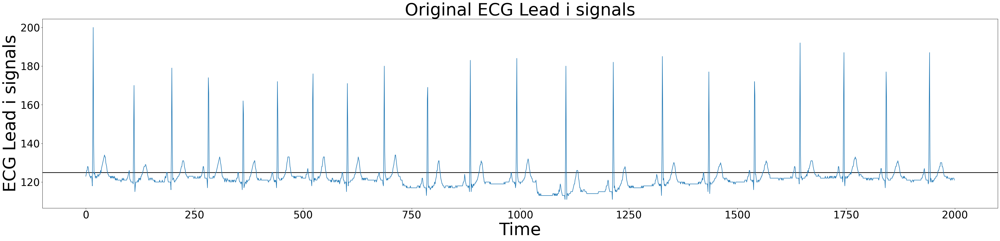

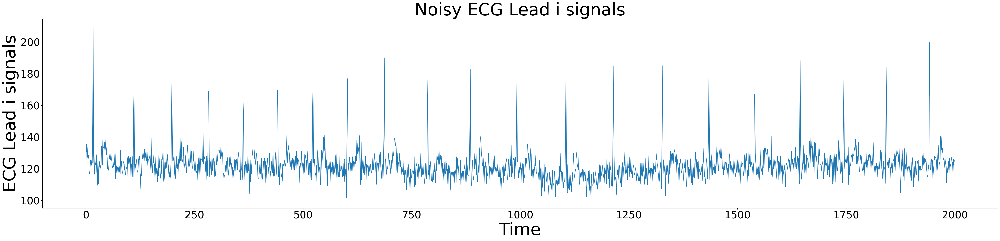

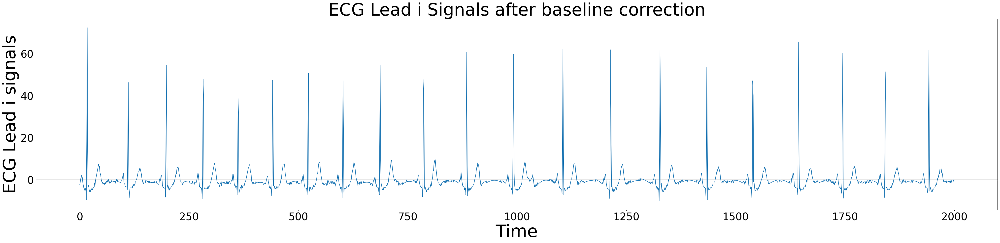

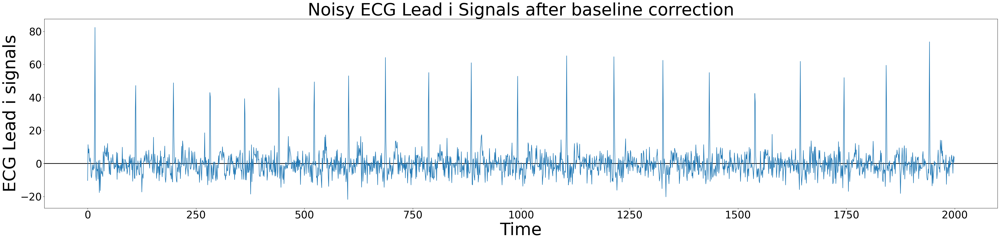

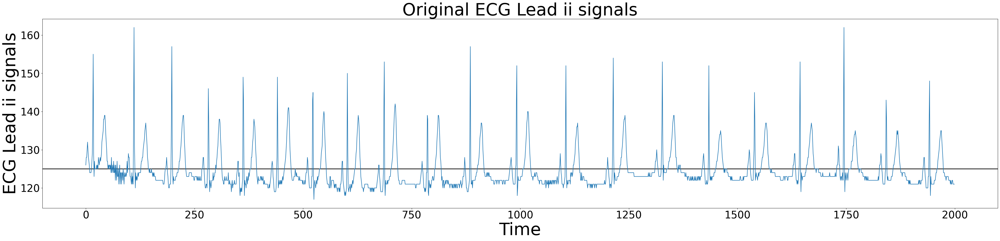

...

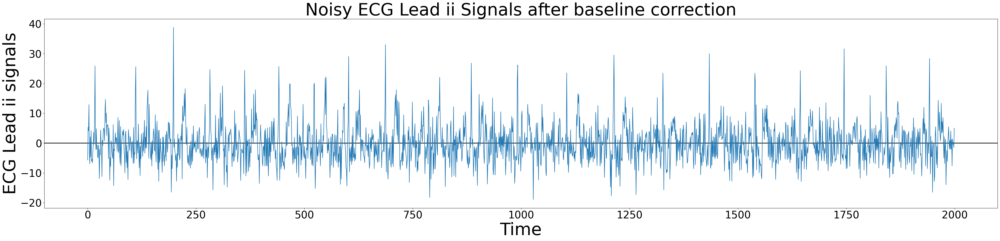

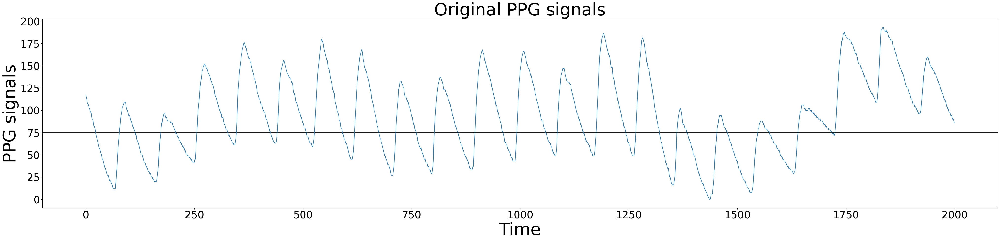

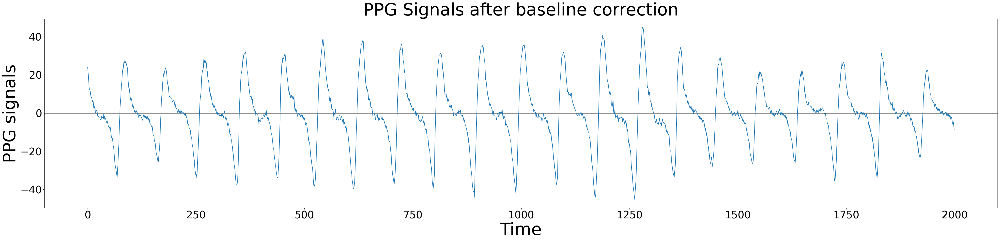

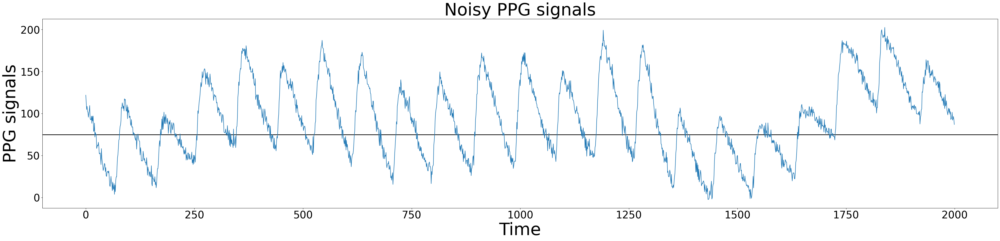

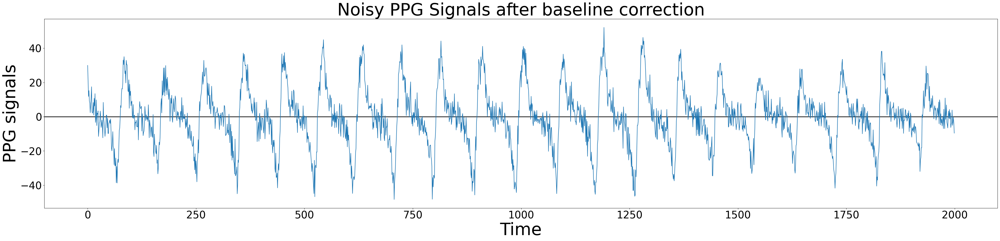

In [ ]:
import numpy as np
from scipy import signal

fs = 50 # fontsize
fs1 = 30

# second order butterworth highpass filter for ECG and PPG baseline wandering removal
def butter_highpass(cutoff, fs, order=2):
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    b, a = signal.butter(order, normal_cutoff, btype='high', analog=False)
    return b, a

def butter_highpass_filter(data, cutoff, fs, order=2):
    b, a = butter_highpass(cutoff, fs, order=order)
    y = signal.filtfilt(b, a, data)
    return y

cutoff_high = 1
ecgi_corrected = butter_highpass_filter(ecgi, cutoff_high, 80, 2)
ecgii_corrected = butter_highpass_filter(ecgii, cutoff_high, 80, 2)
ecgiii_corrected = butter_highpass_filter(ecgiii, cutoff_high, 80, 2)
pleth_corrected = butter_highpass_filter(pleth, cutoff_high, 80, 2)

ecgi_noisy = ecgi + np.random.normal(0,1,len(ecgi)) * 5
ecgi_noisy_corrected = butter_highpass_filter(ecgi_noisy, cutoff_high, 80, 2)
ecgii_noisy = ecgii + np.random.normal(0,1,len(ecgii)) * 5
ecgii_noisy_corrected = butter_highpass_filter(ecgii_noisy, cutoff_high, 80, 2)
ecgiii_noisy = ecgiii + np.random.normal(0,1,len(ecgiii)) * 5
ecgiii_noisy_corrected = butter_highpass_filter(ecgiii_noisy, cutoff_high, 80, 2)
pleth_noisy = pleth + np.random.normal(0,1,len(pleth)) * 5
pleth_noisy_corrected = butter_highpass_filter(pleth_noisy, cutoff_high, 80, 2)

plt.figure(figsize=(50,10))
plt.xlabel('Time', fontsize=fs)
plt.ylabel('ECG Lead i signals', fontsize=fs)
plt.title('Original ECG Lead i signals', fontsize=fs)
plt.axhline(y=125, color = 'black', lw = 2)
plt.xticks(fontsize=fs1)
plt.yticks(fontsize=fs1)
plt.plot(ecgi[57000:59000])
plt.savefig('/content/drive/MyDrive/FYP/ecgi.pdf')
plt.show()

plt.figure(figsize=(50,10))
plt.xlabel('Time', fontsize=fs)
plt.ylabel('ECG Lead i signals', fontsize=fs)
plt.title('Noisy ECG Lead i signals', fontsize=fs)
plt.axhline(y=125, color = 'black', lw = 2)
plt.xticks(fontsize=fs1)
plt.yticks(fontsize=fs1)
plt.plot(ecgi_noisy[57000:59000])
plt.savefig('/content/drive/MyDrive/FYP/ecgi_noisy.pdf')
plt.show()

plt.figure(figsize=(50,10))
plt.xlabel('Time', fontsize=fs)
plt.ylabel('ECG Lead i signals', fontsize=fs)
plt.title('ECG Lead i Signals after baseline correction', fontsize=fs)
plt.axhline(y=0, color = 'black', lw = 2)
plt.xticks(fontsize=fs1)
plt.yticks(fontsize=fs1)
plt.plot(ecgi_corrected[57000:59000])
plt.savefig('/content/drive/MyDrive/FYP/ecgi_corrected.pdf')
plt.show()

plt.figure(figsize=(50,10))
plt.xlabel('Time', fontsize=fs)
plt.ylabel('ECG Lead i signals', fontsize=fs)
plt.title('Noisy ECG Lead i Signals after baseline correction', fontsize=fs)
plt.axhline(y=0, color = 'black', lw = 2)
plt.xticks(fontsize=fs1)
plt.yticks(fontsize=fs1)
plt.plot(ecgi_noisy_corrected[57000:59000])
plt.savefig('/content/drive/MyDrive/FYP/ecgi_noisy_corrected.pdf')
plt.show()

plt.figure(figsize=(50,10))
plt.xlabel('Time', fontsize=fs)
plt.ylabel('ECG Lead ii signals', fontsize=fs)
plt.title('Original ECG Lead ii signals', fontsize=fs)
plt.axhline(y=125, color = 'black', lw = 2)
plt.xticks(fontsize=fs1)
plt.yticks(fontsize=fs1)
plt.plot(ecgii[57000:59000])
plt.savefig('/content/drive/MyDrive/FYP/ecgii.pdf')
plt.show()

plt.figure(figsize=(50,10))
plt.xlabel('Time', fontsize=fs)
plt.ylabel('ECG Lead ii signals', fontsize=fs)
plt.title('Noisy ECG Lead ii signals', fontsize=fs)
plt.axhline(y=125, color = 'black', lw = 2)
plt.xticks(fontsize=fs1)
plt.yticks(fontsize=fs1)
plt.plot(ecgii_noisy[57000:59000])
plt.savefig('/content/drive/MyDrive/FYP/ecgii_noisy.pdf')
plt.show()

plt.figure(figsize=(50,10))
plt.xlabel('Time', fontsize=fs)
plt.ylabel('ECG Lead ii signals', fontsize=fs)
plt.title('ECG Lead ii Signals after baseline correction', fontsize=fs)
plt.axhline(y=0, color = 'black', lw = 2)
plt.xticks(fontsize=fs1)
plt.yticks(fontsize=fs1)
plt.plot(ecgii_corrected[57000:59000])
plt.savefig('/content/drive/MyDrive/FYP/ecgii_corrected.pdf')
plt.show()

plt.figure(figsize=(50,10))
plt.xlabel('Time', fontsize=fs)
plt.ylabel('ECG Lead ii signals', fontsize=fs)
plt.title('Noisy ECG Lead ii Signals after baseline correction', fontsize=fs)
plt.axhline(y=0, color = 'black', lw = 2)
plt.xticks(fontsize=fs1)
plt.yticks(fontsize=fs1)
plt.plot(ecgii_noisy_corrected[57000:59000])
plt.savefig('/content/drive/MyDrive/FYP/ecgii_noisy_corrected.pdf')
plt.show()

plt.figure(figsize=(50,10))
plt.xlabel('Time', fontsize=fs)
plt.ylabel('PPG signals', fontsize=fs)
plt.title('Original PPG signals', fontsize=fs)
plt.axhline(y=75, color = 'black', lw = 2)
plt.xticks(fontsize=fs1)
plt.yticks(fontsize=fs1)
plt.plot(pleth[1000:3000])
plt.savefig('/content/drive/MyDrive/FYP/ppg.pdf')
plt.show()

plt.figure(figsize=(50,10))
plt.xlabel('Time', fontsize=fs)
plt.ylabel('PPG signals', fontsize=fs)
plt.title('PPG Signals after baseline correction', fontsize=fs)
plt.axhline(y=0, color = 'black', lw = 2)
plt.xticks(fontsize=fs1)
plt.yticks(fontsize=fs1)
plt.plot(pleth_corrected[1000:3000])
plt.savefig('/content/drive/MyDrive/FYP/ppg_corrected.pdf')
plt.show()

plt.figure(figsize=(50,10))
plt.xlabel('Time', fontsize=fs)
plt.ylabel('PPG signals', fontsize=fs)
plt.title('Noisy PPG signals', fontsize=fs)
plt.axhline(y=75, color = 'black', lw = 2)
plt.xticks(fontsize=fs1)
plt.yticks(fontsize=fs1)
plt.plot(pleth_noisy[1000:3000])
plt.savefig('/content/drive/MyDrive/FYP/ppg_noisy.pdf')
plt.show()

plt.figure(figsize=(50,10))
plt.xlabel('Time', fontsize=fs)
plt.ylabel('PPG signals', fontsize=fs)
plt.title('Noisy PPG Signals after baseline correction', fontsize=fs)
plt.axhline(y=0, color = 'black', lw = 2)
plt.xticks(fontsize=fs1)
plt.yticks(fontsize=fs1)
plt.plot(pleth_noisy_corrected[1000:3000])
plt.savefig('/content/drive/MyDrive/FYP/ppg_noisy_corrected.pdf')
plt.show()

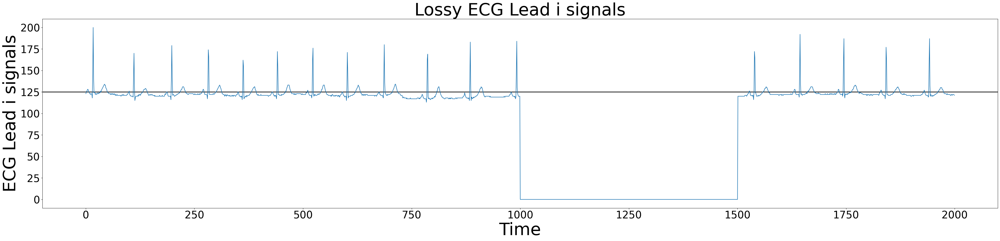

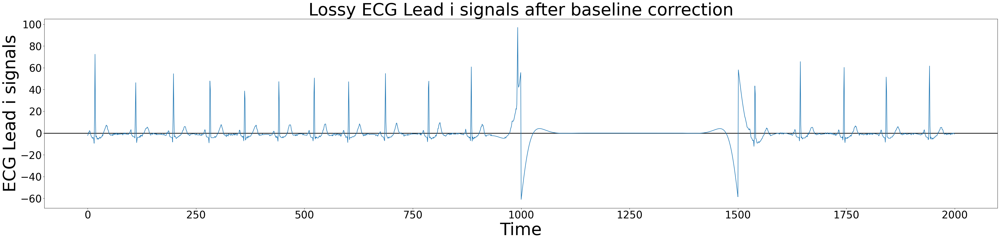

In [ ]:
import copy
ecgi_lossy = [0] * len(ecgi)
for i in range(len(ecgi)):
  ecgi_lossy[i] = ecgi[i]
  if i >= 58000 and i<=58500:
    ecgi_lossy[i] = 0

ecgi_lossy_corrected = butter_highpass_filter(ecgi_lossy, cutoff_high, 80, 2)

plt.figure(figsize=(50,10))
plt.xlabel('Time', fontsize=fs)
plt.ylabel('ECG Lead i signals', fontsize=fs)
plt.title('Lossy ECG Lead i signals', fontsize=fs)
plt.axhline(y=125, color = 'black', lw = 2)
plt.xticks(fontsize=fs1)
plt.yticks(fontsize=fs1)
plt.plot(ecgi_lossy[57000:59000])
plt.savefig('/content/drive/MyDrive/FYP/ecgi_lossy.pdf')
plt.show()

plt.figure(figsize=(50,10))
plt.xlabel('Time', fontsize=fs)
plt.ylabel('ECG Lead i signals', fontsize=fs)
plt.title('Lossy ECG Lead i signals after baseline correction', fontsize=fs)
plt.axhline(y=0, color = 'black', lw = 2)
plt.xticks(fontsize=fs1)
plt.yticks(fontsize=fs1)
plt.plot(ecgi_lossy_corrected[57000:59000])
plt.savefig('/content/drive/MyDrive/FYP/ecgi_lossy_corrected.pdf')
plt.show()

[  17  111  198  282  362  441  523  602  687  787  885  992 1539 1644
 1745 1842 1942]
[72.41526539 46.30066621 54.53999876 47.84518855 38.67591284 47.28050422
 50.60256711 47.1772439  54.72880272 47.68894817 60.79617718 97.05752943
 43.29325125 65.64556598 60.3350741  51.44856146 61.6349844 ]


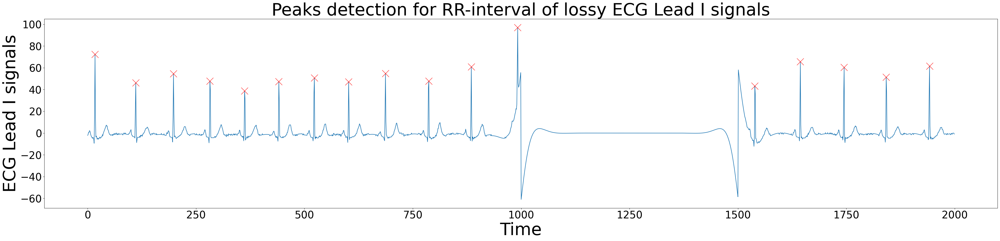

[  17  111  198  282  362  441  523  602  687  787  885  992 1105 1214
 1327 1434 1539 1644 1745 1842 1942]
[72.41526539 46.30066621 54.53999876 47.84518855 38.67591284 47.28050422
 50.60256711 47.17724391 54.72880255 47.6886102  60.68938559 59.72649577
 62.13802504 61.88129901 61.64968413 53.71942192 47.16262238 65.64831326
 60.33503527 51.44856111 61.6349844 ]


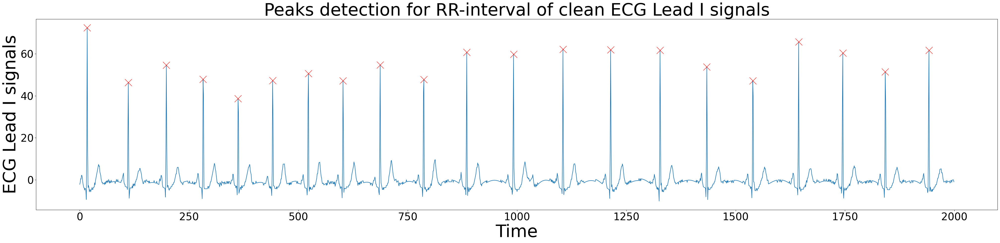

[  17  111  198  282  363  441  523  602  687  758  812  885  992 1105
 1157 1214 1268 1327 1434 1539 1644 1695 1745 1842 1942 1995]
[72.18441914 50.28248477 50.49770276 48.25282427 39.10343077 50.59380642
 48.49904296 49.22073909 61.14063267  7.80560582 17.4029518  62.63334334
 57.29958626 65.89801004  4.93740074 74.6994958   3.64456371 52.80540488
 59.3439381  50.41515057 64.89067214  1.9781245  65.48948553 52.19423783
 55.97182161  4.24003159]


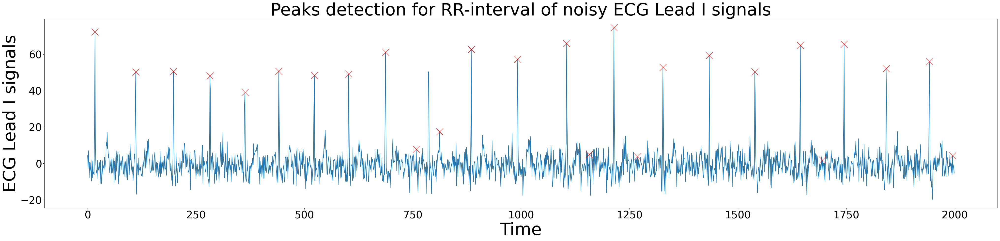

In [ ]:
from scipy.signal import find_peaks

ecgi_peak = ecgi_lossy_corrected[57000:59000]
peaks_ecg_i, _ = find_peaks(ecgi_peak, distance=50, threshold=5)
print(peaks_ecg_i)
print(ecgi_peak[peaks_ecg_i])

plt.figure(figsize=(50,10))
plt.xlabel('Time', fontsize=fs)
plt.ylabel('ECG Lead I signals', fontsize=fs)
plt.title('Peaks detection for RR-interval of lossy ECG Lead I signals', fontsize=fs)
plt.xticks(fontsize=fs1)
plt.yticks(fontsize=fs1)
plt.plot(ecgi_peak)
plt.plot(peaks_ecg_i, ecgi_peak[peaks_ecg_i], "x", color = 'r', markersize=20)
plt.savefig('/content/drive/MyDrive/FYP/ecgi_lossy_peaks.pdf')
plt.show()

ecgi_peak = ecgi_corrected[57000:59000]
peaks_ecg_i, _ = find_peaks(ecgi_peak, distance=50, threshold=5)
print(peaks_ecg_i)
print(ecgi_peak[peaks_ecg_i])

plt.figure(figsize=(50,10))
plt.xlabel('Time', fontsize=fs)
plt.ylabel('ECG Lead I signals', fontsize=fs)
plt.title('Peaks detection for RR-interval of clean ECG Lead I signals', fontsize=fs)
plt.xticks(fontsize=fs1)
plt.yticks(fontsize=fs1)
plt.plot(ecgi_peak)
plt.plot(peaks_ecg_i, ecgi_peak[peaks_ecg_i], "x", color = 'r', markersize=20)
plt.savefig('/content/drive/MyDrive/FYP/ecgi_clean_peaks.pdf')
plt.show()

ecgi_peak = ecgi_noisy_corrected[57000:59000]
peaks_ecg_i, _ = find_peaks(ecgi_peak, distance=50, threshold=5)
print(peaks_ecg_i)
print(ecgi_peak[peaks_ecg_i])

plt.figure(figsize=(50,10))
plt.xlabel('Time', fontsize=fs)
plt.ylabel('ECG Lead I signals', fontsize=fs)
plt.title('Peaks detection for RR-interval of noisy ECG Lead I signals', fontsize=fs)
plt.xticks(fontsize=fs1)
plt.yticks(fontsize=fs1)
plt.plot(ecgi_peak)
plt.plot(peaks_ecg_i, ecgi_peak[peaks_ecg_i], "x", color = 'r', markersize=20)
plt.savefig('/content/drive/MyDrive/FYP/ecgi_noisy_peaks.pdf')
plt.show()

In [ ]:
def isECGiClean(data):
  isClean = True
  threshold_lossy = 200
  threshold_noisy = 2.2
  peaks_ecg_i, _ = find_peaks(data, distance=50, threshold=5)
  for idx in range(len(peaks_ecg_i)-1):
    # check lossy
    if peaks_ecg_i[idx+1] - peaks_ecg_i[idx] > threshold_lossy:
      isClean = False
      return isClean
    # check noisy
    if data[peaks_ecg_i[idx+1]] / data[peaks_ecg_i[idx]] > threshold_noisy:
      isClean = False
      return isClean
  return isClean

print(isECGiClean(ecgi_corrected[57000:59000]))
print(isECGiClean(ecgi_lossy_corrected[57000:59000]))
print(isECGiClean(ecgi_noisy_corrected[57000:59000]))

True
False
False


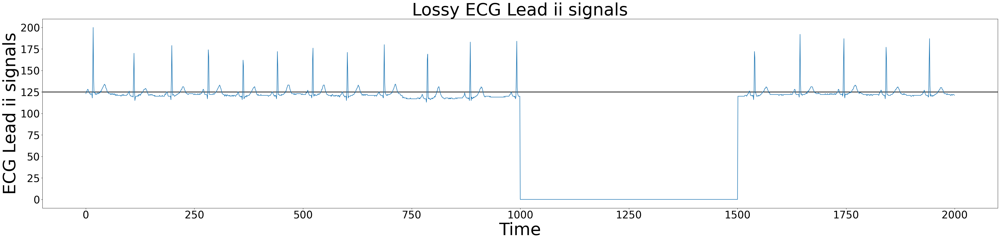

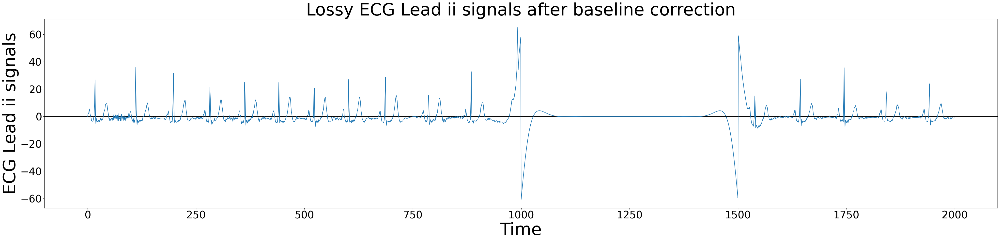

In [ ]:
import copy
ecgii_lossy = [0] * len(ecgii)
for i in range(len(ecgii)):
  ecgii_lossy[i] = ecgii[i]
  if i >= 58000 and i<=58500:
    ecgii_lossy[i] = 0

ecgii_lossy_corrected = butter_highpass_filter(ecgii_lossy, cutoff_high, 80, 2)

plt.figure(figsize=(50,10))
plt.xlabel('Time', fontsize=fs)
plt.ylabel('ECG Lead ii signals', fontsize=fs)
plt.title('Lossy ECG Lead ii signals', fontsize=fs)
plt.axhline(y=125, color = 'black', lw = 2)
plt.xticks(fontsize=fs1)
plt.yticks(fontsize=fs1)
plt.plot(ecgi_lossy[57000:59000])
plt.savefig('/content/drive/MyDrive/FYP/ecgii_lossy.pdf')
plt.show()

plt.figure(figsize=(50,10))
plt.xlabel('Time', fontsize=fs)
plt.ylabel('ECG Lead ii signals', fontsize=fs)
plt.title('Lossy ECG Lead ii signals after baseline correction', fontsize=fs)
plt.axhline(y=0, color = 'black', lw = 2)
plt.xticks(fontsize=fs1)
plt.yticks(fontsize=fs1)
plt.plot(ecgii_lossy_corrected[57000:59000])
plt.savefig('/content/drive/MyDrive/FYP/ecgii_lossy_corrected.pdf')
plt.show()

[  17  111  198  282  362  441  602  687  885  992 1539 1644 1745 1842
 1942]
[22.73690834 36.49794208 27.99762838 16.48350106 28.1602466  15.70688888
 24.05394687 25.76669591 30.48474267 28.96173822 22.37457513 32.17525666
 36.70485336 17.72417737 25.78801359]


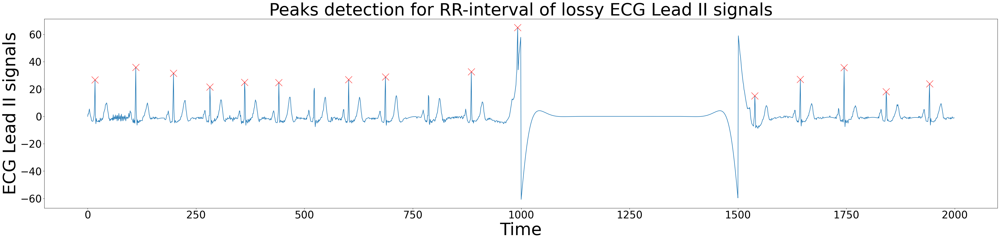

[  17  111  198  282  362  441  602  687  885  992 1105 1214 1327 1434
 1539 1644 1745 1842 1942]
[26.79048872 35.84165803 31.55274429 21.43111459 24.83772076 24.7723398
 26.9349898  28.78369276 32.54563073 26.50577474 27.22186009 28.53901255
 25.75370039 26.7599132  18.94801692 27.13141226 35.61613101 18.10289049
 23.80956939]


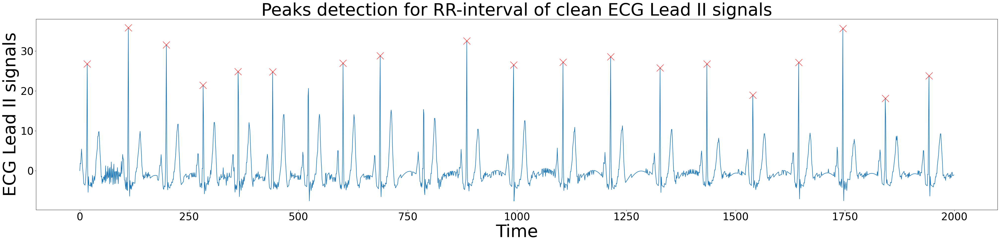

[  17  111  198  282  362  441  497  550  602  687  749  812  885  938
 1048 1105 1162 1214 1272 1327 1434 1485 1542 1594 1644 1695 1745 1842
 1942]
[ 22.73690834  36.49794208  27.99762838  16.48350106  28.1602466
  15.70688888  -2.7305895    0.74875001  24.05394687  25.76669591
  -4.00083711  16.25669385  30.48474267   7.18144527 -12.2507011
  22.75340842   4.22608213  28.4647121    2.71748105  20.64667099
  26.46918407  -2.83408953  -8.37984576  -1.77044339  32.17525666
  -2.99490671  36.70485336  17.72417737  25.78801359]


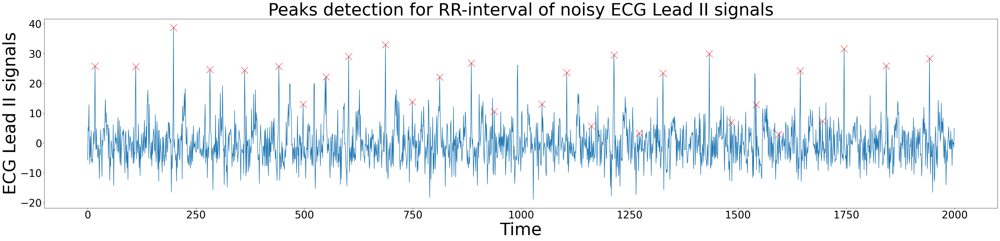

In [ ]:
from scipy.signal import find_peaks

ecgii_peak = ecgii_lossy_corrected[57000:59000]
peaks_ecg_ii, _ = find_peaks(ecgii_peak, distance=50, threshold=5)
print(peaks_ecg_ii)
print(ecgi_peak[peaks_ecg_ii])

plt.figure(figsize=(50,10))
plt.xlabel('Time', fontsize=fs)
plt.ylabel('ECG Lead II signals', fontsize=fs)
plt.title('Peaks detection for RR-interval of lossy ECG Lead II signals', fontsize=fs)
plt.xticks(fontsize=fs1)
plt.yticks(fontsize=fs1)
plt.plot(ecgii_peak)
plt.plot(peaks_ecg_ii, ecgii_peak[peaks_ecg_ii], "x", color = 'r', markersize=20)
plt.savefig('/content/drive/MyDrive/FYP/ecgii_lossy_peaks.pdf')
plt.show()

ecgii_peak = ecgii_corrected[57000:59000]
peaks_ecg_ii, _ = find_peaks(ecgii_peak, distance=50, threshold=5)
print(peaks_ecg_ii)
print(ecgii_peak[peaks_ecg_ii])

plt.figure(figsize=(50,10))
plt.xlabel('Time', fontsize=fs)
plt.ylabel('ECG Lead II signals', fontsize=fs)
plt.title('Peaks detection for RR-interval of clean ECG Lead II signals', fontsize=fs)
plt.xticks(fontsize=fs1)
plt.yticks(fontsize=fs1)
plt.plot(ecgii_peak)
plt.plot(peaks_ecg_ii, ecgii_peak[peaks_ecg_ii], "x", color = 'r', markersize=20)
plt.savefig('/content/drive/MyDrive/FYP/ecgii_clean_peaks.pdf')
plt.show()

ecgii_peak = ecgii_noisy_corrected[57000:59000]
peaks_ecg_ii, _ = find_peaks(ecgii_peak, distance=50, threshold=5)
print(peaks_ecg_ii)
print(ecgi_peak[peaks_ecg_ii])

plt.figure(figsize=(50,10))
plt.xlabel('Time', fontsize=fs)
plt.ylabel('ECG Lead II signals', fontsize=fs)
plt.title('Peaks detection for RR-interval of noisy ECG Lead II signals', fontsize=fs)
plt.xticks(fontsize=fs1)
plt.yticks(fontsize=fs1)
plt.plot(ecgii_peak)
plt.plot(peaks_ecg_ii, ecgii_peak[peaks_ecg_ii], "x", color = 'r', markersize=20)
plt.savefig('/content/drive/MyDrive/FYP/ecgii_noisy_peaks.pdf')
plt.show()

In [ ]:
def isECGiiClean(data):
  isClean = True
  threshold_lossy = 200
  threshold_noisy = 2.2
  peaks_ecg_ii, _ = find_peaks(data, distance=50, threshold=5)
  for idx in range(len(peaks_ecg_ii)-1):
    # check lossy
    if peaks_ecg_ii[idx+1] - peaks_ecg_ii[idx] > threshold_lossy:
      isClean = False
      return isClean
    # check noisy
    if data[peaks_ecg_ii[idx+1]] / data[peaks_ecg_ii[idx]] > threshold_noisy:
      isClean = False
      return isClean
  return isClean

print(isECGiiClean(ecgii_corrected[57000:59000]))
print(isECGiiClean(ecgii_lossy_corrected[57000:59000]))
print(isECGiiClean(ecgii_noisy_corrected[57000:59000]))

True
False
False


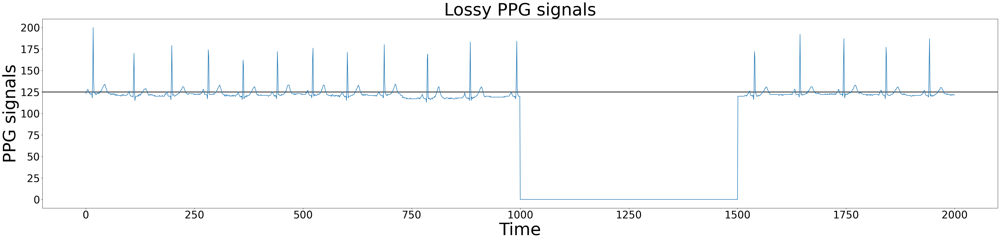

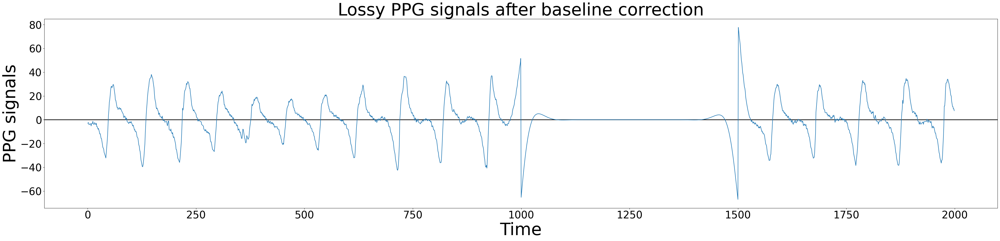

In [ ]:
import copy
pleth_lossy = [0] * len(pleth)
for i in range(len(pleth)):
  pleth_lossy[i] = pleth[i]
  if i >= 58000 and i<=58500:
    pleth_lossy[i] = 0

pleth_lossy_corrected = butter_highpass_filter(pleth_lossy, cutoff_high, 80, 2)

plt.figure(figsize=(50,10))
plt.xlabel('Time', fontsize=fs)
plt.ylabel('PPG signals', fontsize=fs)
plt.title('Lossy PPG signals', fontsize=fs)
plt.axhline(y=125, color = 'black', lw = 2)
plt.xticks(fontsize=fs1)
plt.yticks(fontsize=fs1)
plt.plot(ecgi_lossy[57000:59000])
plt.savefig('/content/drive/MyDrive/FYP/ppg_lossy.pdf')
plt.show()

plt.figure(figsize=(50,10))
plt.xlabel('Time', fontsize=fs)
plt.ylabel('PPG signals', fontsize=fs)
plt.title('Lossy PPG signals after baseline correction', fontsize=fs)
plt.axhline(y=0, color = 'black', lw = 2)
plt.xticks(fontsize=fs1)
plt.yticks(fontsize=fs1)
plt.plot(pleth_lossy_corrected[57000:59000])
plt.savefig('/content/drive/MyDrive/FYP/ppg_lossy_corrected.pdf')
plt.show()

[  55  147  310  470  635  730  828  999 1501 1591 1688 1788 1888 1984]
[28.24393063 38.10540134 24.20925873 17.61971968 29.3012356  36.56405869
 32.6623587  51.59919341 77.6422338  29.83515387 29.57358759 33.07720997
 34.71003824 34.17252585]


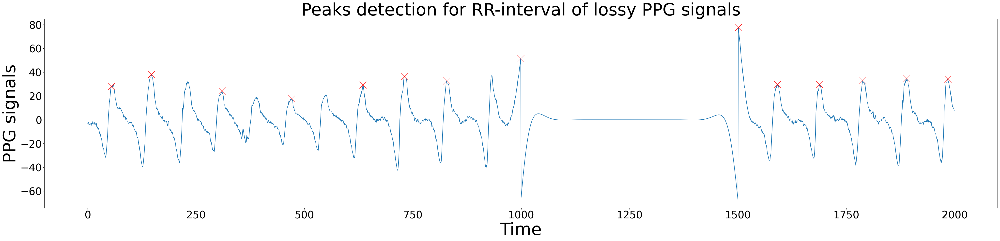

[  55  147  310  470  635  730  828  932 1051 1163 1275 1379 1488 1591
 1688 1788 1888 1984]
[28.24393063 38.10540134 24.20925873 17.61971968 29.30123559 36.56407074
 32.66608287 38.08323833 26.02818817 27.09379706 29.32121063 23.26196707
 30.98741337 29.77042573 29.57510654 33.0772185  34.71003826 34.17252585]


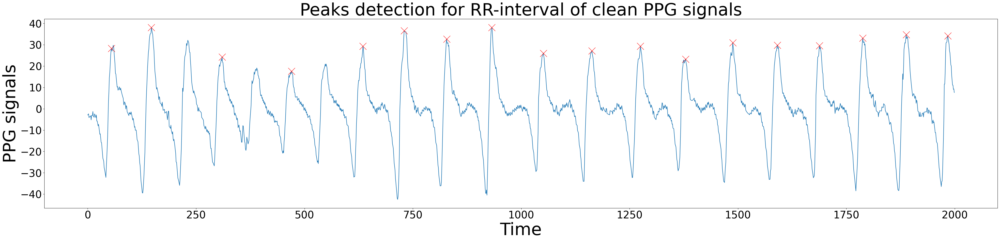

[  54  147  230  302  384  473  557  623  675  729  788  847  930  980
 1049 1104 1159 1209 1270 1337 1389 1485 1590 1685 1737 1788 1888 1987]
[28.55015896 51.54455458 35.14576638 35.62116339 22.34913291 21.53237584
 16.83126301 18.9173854  10.28607755 44.28740722 12.50463494 16.01441368
 40.08811778  4.36264283 31.24652353  8.42188112 30.68521737  5.39678682
 37.50723509 10.6268152  15.31227522 31.41856224 35.20799691 33.14105683
 11.26590027 38.69711822 41.60252668 36.50151625]


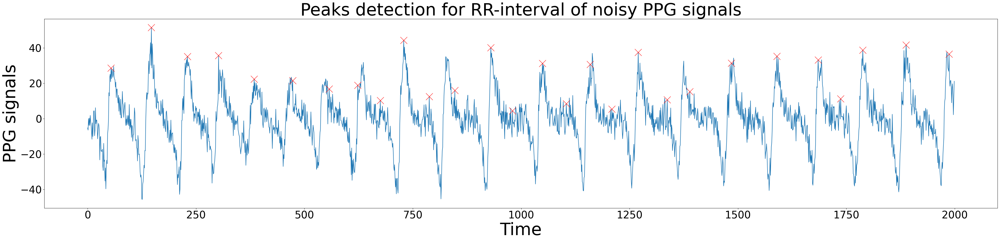

In [ ]:
from scipy.signal import find_peaks

ppg_peak = pleth_lossy_corrected[57000:59000]
peaks_ppg, _ = find_peaks(ppg_peak, distance=90, threshold=0.3)
print(peaks_ppg)
print(ppg_peak[peaks_ppg])

plt.figure(figsize=(50,10))
plt.xlabel('Time', fontsize=fs)
plt.ylabel('PPG signals', fontsize=fs)
plt.title('Peaks detection for RR-interval of lossy PPG signals', fontsize=fs)
plt.xticks(fontsize=fs1)
plt.yticks(fontsize=fs1)
plt.plot(ppg_peak)
plt.plot(peaks_ppg, ppg_peak[peaks_ppg], "x", color = 'r', markersize=20)
plt.savefig('/content/drive/MyDrive/FYP/ppg_lossy_peaks.pdf')
plt.show()

ppg_peak = pleth_corrected[57000:59000]
peaks_ppg, _ = find_peaks(ppg_peak, distance=90, threshold=0.3)
print(peaks_ppg)
print(ppg_peak[peaks_ppg])

plt.figure(figsize=(50,10))
plt.xlabel('Time', fontsize=fs)
plt.ylabel('PPG signals', fontsize=fs)
plt.title('Peaks detection for RR-interval of clean PPG signals', fontsize=fs)
plt.xticks(fontsize=fs1)
plt.yticks(fontsize=fs1)
plt.plot(ppg_peak)
plt.plot(peaks_ppg, ppg_peak[peaks_ppg], "x", color = 'r', markersize=20)
plt.savefig('/content/drive/MyDrive/FYP/ppg_clean_peaks.pdf')
plt.show()

ppg_peak = pleth_noisy_corrected[57000:59000]
peaks_ppg, _ = find_peaks(ppg_peak, distance=50, threshold=5)
print(peaks_ppg)
print(ppg_peak[peaks_ppg])

plt.figure(figsize=(50,10))
plt.xlabel('Time', fontsize=fs)
plt.ylabel('PPG signals', fontsize=fs)
plt.title('Peaks detection for RR-interval of noisy PPG signals', fontsize=fs)
plt.xticks(fontsize=fs1)
plt.yticks(fontsize=fs1)
plt.plot(ppg_peak)
plt.plot(peaks_ppg, ppg_peak[peaks_ppg], "x", color = 'r', markersize=20)
plt.savefig('/content/drive/MyDrive/FYP/ppg_noisy_peaks.pdf')
plt.show()

In [ ]:
def isPPGClean(data):
  isClean = True
  threshold_lossy = 200
  threshold_noisy = 2.2
  # check noisy
  peaks_ppg, _ = find_peaks(data, distance=50, threshold=5)
  for idx in range(len(peaks_ppg)-1):
    if data[peaks_ppg[idx+1]] / data[peaks_ppg[idx]] > threshold_noisy:
      isClean = False
      return isClean
  # check lossy
  peaks_ppg, _ = find_peaks(data, distance=90, threshold=0.3)
  for idx in range(len(peaks_ppg)-1):
    if peaks_ppg[idx+1] - peaks_ppg[idx] > threshold_lossy:
      isClean = False
      return isClean
  return isClean

print(isPPGClean(pleth_corrected[57000:59000]))
print(isPPGClean(pleth_lossy_corrected[57000:59000]))
print(isPPGClean(pleth_noisy_corrected[57000:59000]))

True
False
False


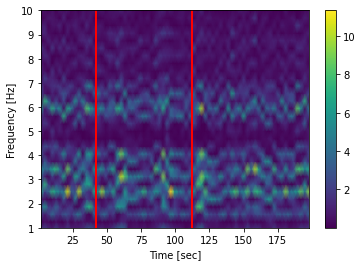

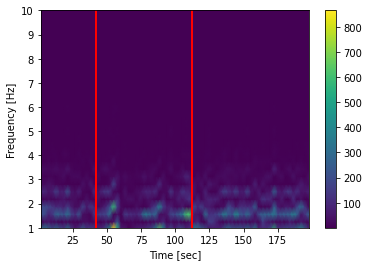

In [ ]:
def spectrogram_plot(data):
  from scipy import signal
  from scipy.fft import fftshift
  import matplotlib.pyplot as plt
  fs = 80
  x = data
  f, t, Sxx = signal.spectrogram(x, fs)
  plt.pcolormesh(t, f, Sxx, shading='gouraud')
  plt.ylabel('Frequency [Hz]')
  plt.xlabel('Time [sec]')
  plt.axvline(x=42, color = 'red', lw = 2)
  plt.axvline(x=112, color = 'red', lw = 2)
  plt.ylim([1, 10])
  plt.colorbar()
  plt.show()

spectrogram_plot(ecgii_corrected[600*80:800*80])
spectrogram_plot(pleth_corrected[600*80:800*80])

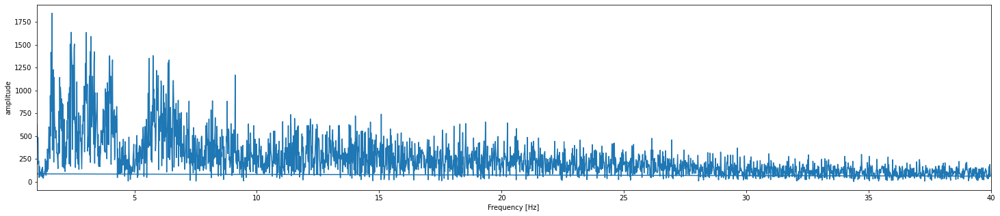

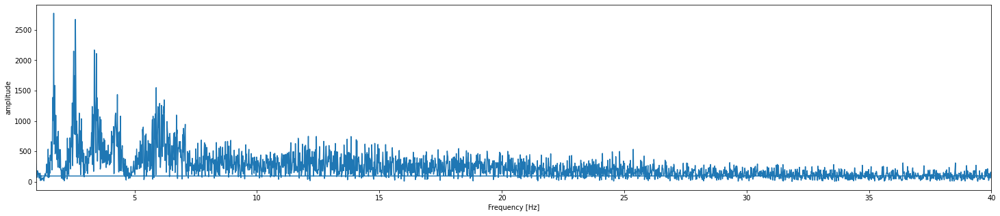

In [ ]:
def fft_plot(data):
  from scipy.fft import fft, fftfreq
  fs = 80
  x = data
  amplitude = np.abs(fft(x))
  frequency = fftfreq(len(x), 1/fs)
  plt.figure(figsize=(25,5))
  plt.plot(frequency, amplitude)
  plt.xlim([1, 40])
  plt.xlabel('Frequency [Hz]')
  plt.ylabel('amplitude')
  plt.show()

fft_plot(ecgii_corrected[642*80:712*80])
fft_plot(ecgii_corrected[450*80:520*80])

In [ ]:
# verify event label in a time interval
# print(event[717:750])
# print(anomaly[700:800])
countHypopnea = 0
countObstructive = 0
countCentral = 0
countMixed = 0
countNone = 0
for x in event_corrected:
  if x == 'NONE':
    countNone = countNone + 1
  elif x == 'APNEA-OBSTRUCTIVE':
    countObstructive = countObstructive + 1
  elif x == 'HYPOPNEA':
    countHypopnea = countHypopnea + 1
  elif x == 'APNEA-CENTRAL':
    countCentral = countCentral + 1
  elif x == 'APNEA':
    countMixed = countMixed + 1
print('Number of None', countNone)
print('Number of Hypopnea', countHypopnea)
print('Number of Cental', countCentral)
print('Number of Obstructive', countObstructive)
print('Number of Mixed', countMixed)

Number of None 602680
Number of Hypopnea 209480
Number of Cental 11120
Number of Obstructive 193840
Number of Mixed 0


In [ ]:
import copy
event_corrected = copy.deepcopy(event)
for i in range(len(event)):
  if event_corrected[i] == 'APNEA-OBSTRUCTIVE' or event_corrected[i] == 'APNEA-CENTRAL' or event_corrected[i] == 'APNEA-MIXED':
    event_corrected[i] = 'APNEA'
  if event_corrected[i] == 'HYPOPNEA':
    event_corrected[i] = 'APNEA'

APNEA-OBSTRUCTIVE starting at 642 seconds


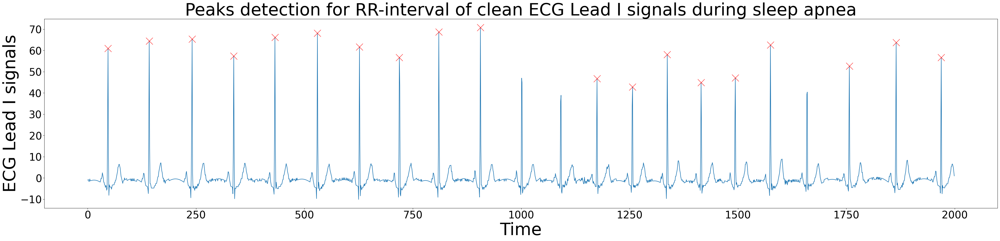

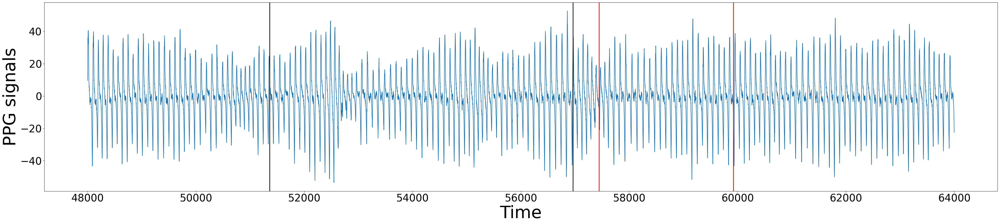

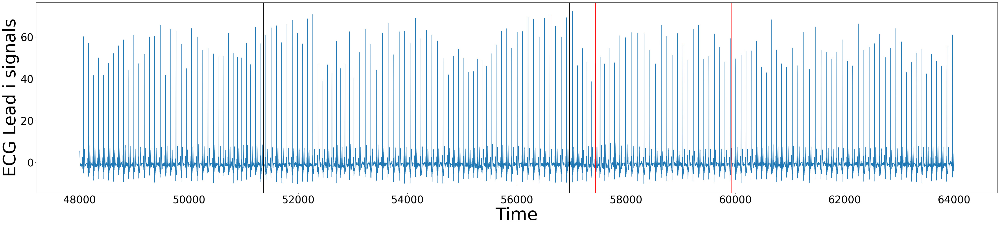

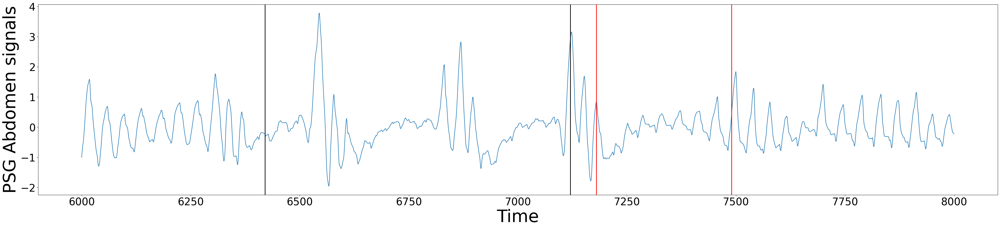

In [ ]:
count = 0
for x in event:
  count = count + 1
  if x == 'APNEA-OBSTRUCTIVE':
    print('APNEA-OBSTRUCTIVE starting at', count, 'seconds')
    break

# example: obstructive apnea occurs from 642 to 712 seconds
sampling_rate = 80
start = 600 * sampling_rate
end = 800 * sampling_rate
n = 200 * sampling_rate
x = np.linspace(start, end, n)

sampling_rate1 = 10
start1 = 600 * sampling_rate1
end1 = 800 * sampling_rate1
n1 = 200 * sampling_rate1
x1 = np.linspace(start1, end1, n1)

ecgi_peak = ecgi_corrected[642*80:642*80+2000]
peaks_ecg_i, _ = find_peaks(ecgi_peak, distance=50, threshold=5)

plt.figure(figsize=(50,10))
plt.xlabel('Time', fontsize=fs)
plt.ylabel('ECG Lead I signals', fontsize=fs)
plt.title('Peaks detection for RR-interval of clean ECG Lead I signals during sleep apnea', fontsize=fs)
plt.xticks(fontsize=fs1)
plt.yticks(fontsize=fs1)
plt.plot(ecgi_peak)
plt.plot(peaks_ecg_i, ecgi_peak[peaks_ecg_i], "x", color = 'r', markersize=20)
plt.savefig('/content/drive/MyDrive/FYP/ecgi_apnea_peaks.pdf')
plt.show()

plt.figure(figsize=(50,10))
plt.xlabel('Time', fontsize=fs)
plt.ylabel('PPG signals', fontsize=fs)
plt.xticks(fontsize=fs1)
plt.yticks(fontsize=fs1)
plt.plot(x, pleth_corrected[start:end])
plt.axvline(x=642*80, color = 'black', lw = 2)
plt.axvline(x=712*80, color = 'black', lw = 2)
plt.axvline(x=718*80, color = 'red', lw = 2)
plt.axvline(x=749*80, color = 'red', lw = 2)
plt.savefig('/content/drive/MyDrive/FYP/ppg_line.pdf')
plt.show()

plt.figure(figsize=(50,10))
plt.xlabel('Time', fontsize=fs)
plt.ylabel('ECG Lead i signals', fontsize=fs)
plt.xticks(fontsize=fs1)
plt.yticks(fontsize=fs1)
plt.plot(x, ecgi_corrected[start:end])
plt.axvline(x=642*80, color = 'black', lw = 2)
plt.axvline(x=712*80, color = 'black', lw = 2)
plt.axvline(x=718*80, color = 'red', lw = 2)
plt.axvline(x=749*80, color = 'red', lw = 2)
plt.savefig('/content/drive/MyDrive/FYP/ecgi_line.pdf')
plt.show()

plt.figure(figsize=(50,10))
plt.xlabel('Time', fontsize=fs)
plt.ylabel('PSG Abdomen signals', fontsize=fs)
plt.xticks(fontsize=fs1)
plt.yticks(fontsize=fs1)
plt.plot(x1, psgAbdomen[start1:end1])
plt.axvline(x=642*10, color = 'black', lw = 2)
plt.axvline(x=712*10, color = 'black', lw = 2)
plt.axvline(x=718*10, color = 'red', lw = 2)
plt.axvline(x=749*10, color = 'red', lw = 2)
plt.savefig('/content/drive/MyDrive/FYP/psg_line.pdf')
plt.show()

In [ ]:
# calculate wavelet coefficients for discrete wavelet transform
def discrete_wavelet(data):
  import math
  import numpy as np
  import pywt
  length = len(data)
  sf = 80
  window = int(sf)
  length = int(length / window)
  averageA = [0] * length
  averageD = [0] * length
  i = 0
  for x in range(length):
    (cA, cD) = pywt.dwt(data[i:i+window], 'db1')
    averageA[x] = np.mean(abs(cA))
    averageD[x] = np.mean(abs(cD))
    i = i + window
  return averageA, averageD

cA_ecgi, cD_ecgi = discrete_wavelet(ecgi_corrected)
cA_ecgii, cD_ecgii = discrete_wavelet(ecgii_corrected)
cA_ecgiii, cD_ecgiii = discrete_wavelet(ecgiii_corrected)
# cA_pleth, cD_pleth = discrete_wavelet(pleth_corrected)

# cA_ecgi, cD_ecgi = discrete_wavelet(ecgi_noisy_corrected)
# cA_ecgii, cD_ecgii = discrete_wavelet(ecgii_noisy_corrected)
# cA_ecgiii, cD_ecgiii = discrete_wavelet(ecgiii_noisy_corrected)
cA_pleth, cD_pleth = discrete_wavelet(pleth_noisy_corrected)

In [ ]:
def autoregressive_coefficient(data):
  import math
  import numpy as np
  from statsmodels.tsa.ar_model import AutoReg
  length = len(data)
  sf = 80
  window = int(sf)
  length = int(length / window)
  coefficient = [0] * length
  i = 0
  for x in range(length):
    temp = data[i:i+window]
    model = AutoReg(temp, lags=0)
    model_fit = model.fit()
    parameters = model_fit.params
    coefficient[x] = np.mean(parameters)
    i = i + window
  return coefficient

ar_ecgi = autoregressive_coefficient(ecgi_corrected)
ar_ecgii = autoregressive_coefficient(ecgii_corrected)
ar_ecgiii = autoregressive_coefficient(ecgiii_corrected)
# ar_pleth = autoregressive_coefficient(pleth_corrected)

# ar_ecgi = autoregressive_coefficient(ecgi_noisy_corrected)
# ar_ecgii = autoregressive_coefficient(ecgii_noisy_corrected)
# ar_ecgiii = autoregressive_coefficient(ecgiii_noisy_corrected)
ar_pleth = autoregressive_coefficient(pleth_noisy_corrected)

In [ ]:
import pandas as pd
tempData_f = np.column_stack((cA_ecgi, cD_ecgi, ar_ecgi, cA_ecgii, cD_ecgii, ar_ecgii, cA_ecgiii, cD_ecgiii, ar_ecgiii, cA_pleth, cD_pleth, ar_pleth, event_corrected))
data_f = pd.DataFrame(tempData_f, columns = ['cA_ecgi', 'cD_ecgi', 'ar_ecgi', 'cA_ecgii', 'cD_ecgii', 'ar_ecgii', 'cA_ecgiii', 'cD_ecgiii', 'ar_ecgiii', 'cA_pleth', 'cD_pleth', 'ar_pleth', 'status'])
# pd.set_option('max_columns', None)
print(data_f)

# original data
# event_new = []
# for i in range(len(event_corrected)):
#  for j in range(80):
#    event_new.append(event_corrected[i])

# import pandas as pd
# tempData_f = np.column_stack((ecgi_corrected, ecgii_corrected, ecgiii_corrected, pleth_corrected, event_new))
# data_f = pd.DataFrame(tempData_f, columns = ['ecgi', 'ecgii', 'ecgiii', 'pleth', 'status'])
# pd.set_option('max_columns', None)
# print(data_f)

                  cA_ecgi             cD_ecgi              ar_ecgi  \
0      3.8199459326952634  1.7416433444044663  -0.3146066987381638   
1      4.0449978172852585  1.5430840831262984   0.4875994288331844   
2      2.4528545404034454  0.4161911276633575  -0.5754631239656154   
3       4.815046543113368  2.2124964355820462  0.06789033959975965   
4       4.363611377717588  1.4160251619512616  0.17305205731366122   
...                   ...                 ...                  ...   
25677   3.855631201436497  0.6034827043542291  0.08721802917736264   
25678   4.020350845072467   1.891838356314495  0.11962709840644112   
25679   4.329612087654547  0.9896805111183966  0.16283526578307672   
25680   3.519999725753466  1.8762257799340865  0.16264607183340862   
25681  4.3726483758380486   3.550312791513899   -0.289147232126127   

                 cA_ecgii            cD_ecgii                ar_ecgii  \
0      2.5401620339950903  0.8881211774472133     -0.4734969805747161   
1      3.5784

# **Load saved data**

In [ ]:
# data_f.to_pickle("/content/drive/MyDrive/FYP/dataset/dataframe.pkl")
# data_f = pd.read_pickle("/content/drive/MyDrive/FYP/dataset/dataframe.pkl")
# print(data_f)

# data_f.to_pickle("/content/drive/MyDrive/FYP/dataset/dataframe_original.pkl")
# data_f = pd.read_pickle("/content/drive/MyDrive/FYP/dataset/dataframe_original.pkl")
# print(data_f)

# data_f.to_pickle("/content/drive/MyDrive/FYP/dataset/dataframe_2class.pkl")
# data_f = pd.read_pickle("/content/drive/MyDrive/FYP/dataset/dataframe_2class.pkl")
# print(data_f)

# data_f.to_pickle("/content/drive/MyDrive/FYP/dataset/dataframe_3classes.pkl")
# data_f = pd.read_pickle("/content/drive/MyDrive/FYP/dataset/dataframe_3classes.pkl")
# print(data_f)

# data_f.to_pickle("/content/drive/MyDrive/FYP/dataset/dataframe_2class_allnoisy.pkl")
# data_f = pd.read_pickle("/content/drive/MyDrive/FYP/dataset/dataframe_2class_allnoisy.pkl")
# print(data_f)

# data_f.to_pickle("/content/drive/MyDrive/FYP/dataset/dataframe_2class_ecginoisy.pkl")
# data_f = pd.read_pickle("/content/drive/MyDrive/FYP/dataset/dataframe_2class_ecginoisy.pkl")
# print(data_f)

# data_f.to_pickle("/content/drive/MyDrive/FYP/dataset/dataframe_2class_ppgnoisy.pkl")
data_f = pd.read_pickle("/content/drive/MyDrive/FYP/dataset/dataframe_2class_ppgnoisy.pkl")
# print(data_f)

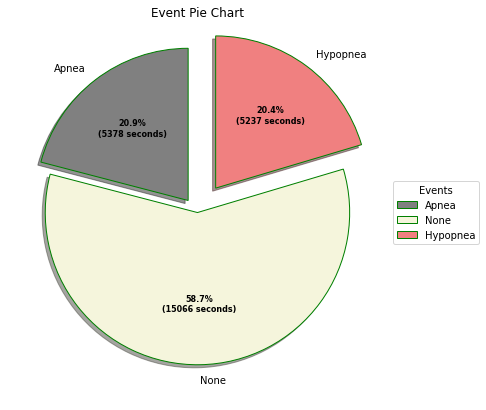

In [ ]:
# Creating dataset
events = ['Apnea', 'None', 'Hypopnea']

data = [5378, 15067, 5237]

# Creating explode data
explode = (0.1, 0.0, 0.2)

# Creating color parameters
colors = ('grey', 'beige', 'lightcoral')

# Wedge properties
wp = { 'linewidth' : 1, 'edgecolor' : "green" }

# Creating autocpt arguments
def func(pct, allvalues):
    absolute = int(pct / 100.*np.sum(allvalues))
    return "{:.1f}%\n({:d} seconds)".format(pct, absolute)

# Creating plot
fig, ax = plt.subplots(figsize =(10, 7))
wedges, texts, autotexts = ax.pie(data,
                                  autopct = lambda pct: func(pct, data),
                                  explode = explode,
                                  labels = events,
                                  shadow = True,
                                  colors = colors,
                                  startangle = 90,
                                  wedgeprops = wp,
                                  textprops = dict(color ="black"))

# Adding legend
ax.legend(wedges, events,
          title ="Events",
          loc ="center left",
          bbox_to_anchor =(1, 0, 0.5, 1))

plt.setp(autotexts, size = 8, weight ="bold")
ax.set_title("Event Pie Chart")

# show plot
plt.show()

In [ ]:
print(data_f['status'].unique())

['NONE' 'APNEA']


In [ ]:
# upsampling for apnea class
none = data_f[data_f['status'] == 'NONE']
apnea = data_f[data_f['status'] == 'APNEA']
hypopnea = data_f[data_f['status'] == 'HYPOPNEA']
print(none.shape)
print(apnea.shape)
print(hypopnea.shape)

# from sklearn.utils import resample
# apnea = resample(apnea,
#              replace=True,
#              n_samples=len(none),
#              random_state=42)
# print(apnea.shape)

# hypopnea = resample(hypopnea,
#              replace=True,
#              n_samples=len(none),
#              random_state=42)
# print(hypopnea.shape)

# # combine and reshuffle the new dataset
# # data_f = pd.concat([apnea, none, hypopnea])
# data_f = pd.concat([apnea, none])
# from sklearn.utils import shuffle
# data_f = shuffle(data_f)
# pd.set_option('max_columns', None)
# print(data_f)

(15067, 13)
(10615, 13)
(0, 13)


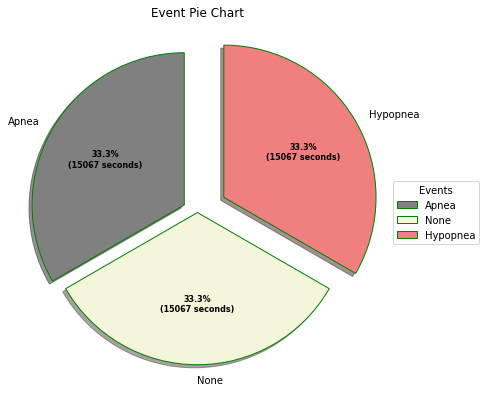

In [ ]:
# Creating dataset
events = ['Apnea', 'None', 'Hypopnea']

data = [15067, 15067, 15067]

# Creating explode data
explode = (0.1, 0.0, 0.2)

# Creating color parameters
colors = ('grey', 'beige', 'lightcoral')

# Wedge properties
wp = { 'linewidth' : 1, 'edgecolor' : "green" }

# Creating autocpt arguments
def func(pct, allvalues):
    absolute = int(pct / 100.*np.sum(allvalues))
    return "{:.1f}%\n({:d} seconds)".format(pct, absolute)

# Creating plot
fig, ax = plt.subplots(figsize =(10, 7))
wedges, texts, autotexts = ax.pie(data,
                                  autopct = lambda pct: func(pct, data),
                                  explode = explode,
                                  labels = events,
                                  shadow = True,
                                  colors = colors,
                                  startangle = 90,
                                  wedgeprops = wp,
                                  textprops = dict(color ="black"))

# Adding legend
ax.legend(wedges, events,
          title ="Events",
          loc ="center left",
          bbox_to_anchor =(1, 0, 0.5, 1))

plt.setp(autotexts, size = 8, weight ="bold")
ax.set_title("Event Pie Chart")

# show plot
plt.show()

In [ ]:
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.neural_network import MLPClassifier
from sklearn import svm
from sklearn import metrics
from sklearn.metrics import f1_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay

# **Sklearn and Pytorch**

In [ ]:
recall = np.zeros(5)
for i in range(5):
  # mlutilayer perceptron using time and frequency domain features
  Label = preprocessing.LabelEncoder()
  status = Label.fit_transform(data_f['status'])

  train, test = train_test_split(data_f)
  X_train = train[train.columns[9:12]]
  y_train = train['status']
  X_test = test[test.columns[9:12]]
  y_test= test['status']

  scaler = StandardScaler()
  scaler.fit(X_train)
  X_train = scaler.transform(X_train)
  X_test = scaler.transform(X_test)

  MLP = MLPClassifier(hidden_layer_sizes = (50, 50, 10, 20), max_iter = 1000, activation = 'relu', learning_rate_init = 0.01)
  MLP.fit(X_train, y_train.values.ravel())

  predictions = MLP.predict(X_test)
  report = classification_report(y_test, predictions)
  print(report)
  report_data = []
  lines = report.split('\n')
  for line in lines[2:3]:
    row = {}
    row_data = line.split()
    row_data = list(filter(None, row_data))
  recall[i] = recall_score(y_test, predictions, average='weighted')

print(recall)
print("%0.3f recall with a standard deviation of %0.3f" % (recall.mean(), recall.std()))
print('\n')

# display confusion matrix
# import matplotlib.pyplot as plt
# cm = confusion_matrix(y_test, predictions, labels=MLP.classes_)
# disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=MLP.classes_)
# disp.plot()
# plt.title('ECG Lead I: MLP')
# plt.show()

              precision    recall  f1-score   support

       APNEA       0.45      0.47      0.46      3789
    HYPOPNEA       0.42      0.48      0.45      3784
        NONE       0.48      0.37      0.42      3728

    accuracy                           0.44     11301
   macro avg       0.45      0.44      0.44     11301
weighted avg       0.45      0.44      0.44     11301

              precision    recall  f1-score   support

       APNEA       0.49      0.35      0.41      3827
    HYPOPNEA       0.41      0.41      0.41      3836
        NONE       0.41      0.53      0.46      3638

    accuracy                           0.43     11301
   macro avg       0.44      0.43      0.43     11301
weighted avg       0.44      0.43      0.43     11301

              precision    recall  f1-score   support

       APNEA       0.46      0.45      0.46      3795
    HYPOPNEA       0.41      0.35      0.38      3808
        NONE       0.44      0.52      0.48      3698

    accuracy        

In [ ]:
recall = np.zeros(5)
for i in range(5):
  # SVM using time and frequency domain features
  Label = preprocessing.LabelEncoder()
  status = Label.fit_transform(data_f['status'])

  train, test = train_test_split(data_f)
  X_train = train[train.columns[9:12]]
  y_train = train['status']
  X_test = test[test.columns[9:12]]
  y_test= test['status']

  scaler = StandardScaler()
  scaler.fit(X_train)
  X_train = scaler.transform(X_train)
  X_test = scaler.transform(X_test)

  clfSVM = svm.SVC(kernel = 'rbf')
  clfSVM.fit(X_train, y_train.values.ravel())

  predictions = clfSVM.predict(X_test)
  report = classification_report(y_test, predictions)
  print(report)
  report_data = []
  lines = report.split('\n')
  for line in lines[2:3]:
    row = {}
    row_data = line.split()
    row_data = list(filter(None, row_data))
  recall[i] = recall_score(y_test, predictions, average='weighted')

print(recall)
print("%0.3f recall with a standard deviation of %0.3f" % (recall.mean(), recall.std()))
print('\n')

# display confusion matrix
# import matplotlib.pyplot as plt
# cm = confusion_matrix(y_test, predictions, labels=MLP.classes_)
# disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=MLP.classes_)
# disp.plot()
# plt.title('ECG Lead I: MLP')
# plt.show()

              precision    recall  f1-score   support

       APNEA       0.45      0.43      0.44      3821
    HYPOPNEA       0.41      0.32      0.36      3755
        NONE       0.44      0.55      0.49      3725

    accuracy                           0.43     11301
   macro avg       0.43      0.43      0.43     11301
weighted avg       0.43      0.43      0.43     11301

              precision    recall  f1-score   support

       APNEA       0.44      0.41      0.43      3741
    HYPOPNEA       0.40      0.32      0.36      3814
        NONE       0.44      0.56      0.49      3746

    accuracy                           0.43     11301
   macro avg       0.43      0.43      0.43     11301
weighted avg       0.43      0.43      0.43     11301

              precision    recall  f1-score   support

       APNEA       0.44      0.44      0.44      3700
    HYPOPNEA       0.40      0.33      0.36      3815
        NONE       0.45      0.53      0.49      3786

    accuracy        

In [ ]:
# 10-fold cross using recall
Label = preprocessing.LabelEncoder()

X = data_f[data_f.columns[0:12]]
y = data_f['status']
y = Label.fit_transform(y)

scaler = StandardScaler()
scaler.fit(X)
X = scaler.transform(X)

MLP_10folds = MLPClassifier(hidden_layer_sizes = (100, 50, 70, 20), max_iter = 1000, activation = 'relu', learning_rate_init = 0.01)
scores = cross_val_score(MLP_10folds, X, y, cv=10, scoring = 'recall_micro')
print(scores)
print("%0.3f recall with a standard deviation of %0.3f" % (scores.mean(), scores.std()))
print('\n')

clfRBF = svm.SVC(kernel = 'rbf')
scores = cross_val_score(clfRBF, X, y, cv=10, scoring= 'recall_micro')
print(scores)
print("%0.3f recall with a standard deviation of %0.3f" % (scores.mean(), scores.std()))
print('\n')

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report

from numpy import vstack
from numpy import argmax
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score
from torch import Tensor
from torch.utils.data import random_split
from torch.nn import Linear
from torch.nn import ReLU
from torch.nn import Softmax
from torch.nn import Module
from torch.optim import Adam
from torch.optim import SGD
from torch.nn import CrossEntropyLoss
from torch.nn.init import kaiming_uniform_
from torch.nn.init import xavier_uniform_

# Hyper-parameters
sequence_length = 1
input_size = 12
hidden_size = 128
num_layers = 3
num_classes = 2
batch_size = 64
num_epochs = 50
learning_rate = 0.01

# dataset definition
class CSVDataset(Dataset):
    # load the dataset
    def __init__(self):
        # load the csv file as a dataframe
        df = data_f
        # store the inputs and outputs
        self.X = df.values[:, :-1]
        self.y = df.values[:, -1]
        # ensure input data is floats
        self.X = self.X.astype('float32')
        # label encode target and ensure the values are floats
        self.y = LabelEncoder().fit_transform(self.y)

    # number of rows in the dataset
    def __len__(self):
        return len(self.X)

    # get a row at an index
    def __getitem__(self, idx):
        return [self.X[idx], self.y[idx]]

    # get indexes for train and test rows
    def get_splits(self, n_test=0.2):
        # determine sizes
        test_size = round(n_test * len(self.X))
        train_size = len(self.X) - test_size
        # calculate the split
        return random_split(self, [train_size, test_size])

# prepare the dataset
def prepare_data():
    # load the dataset
    dataset = CSVDataset()
    # calculate split
    train, test = dataset.get_splits()
    # prepare data loaders
    train_dl = DataLoader(train, batch_size=batch_size, shuffle=False)
    test_dl = DataLoader(test, batch_size=batch_size, shuffle=False)
    return train_dl, test_dl


# train the model
def train_model(train_dl, model):
    # define the optimization
    criterion = CrossEntropyLoss()
    optimizer = Adam(model.parameters(), lr=0.01)
    # enumerate epochs
    for epoch in range(25):
        print(epoch)
        # enumerate mini batches
        for i, (inputs, targets) in enumerate(train_dl):
            inputs = inputs.reshape(-1, sequence_length, input_size)
            # inputs = np.array(inputs)
            # clear the gradients
            optimizer.zero_grad()
            # compute the model output
            yhat = model(inputs)
            # calculate loss
            loss = criterion(yhat, targets)
            # credit assignment
            loss.backward()
            # update model weights
            optimizer.step()

# evaluate the model
def evaluate_model(test_dl, model):
    predictions, actuals = list(), list()
    for i, (inputs, targets) in enumerate(test_dl):
        inputs = inputs.reshape(-1, sequence_length, input_size)
        # evaluate the model on the test set
        yhat = model(inputs)
        # retrieve numpy array
        yhat = yhat.detach().numpy()
        actual = targets.numpy()
        # convert to class labels
        yhat = argmax(yhat, axis=1)
        # reshape for stacking
        actual = actual.reshape((len(actual), 1))
        yhat = yhat.reshape((len(yhat), 1))
        # store
        predictions.append(yhat)
        actuals.append(actual)
    predictions, actuals = vstack(predictions), vstack(actuals)
    # calculate accuracy
    acc = recall_score(actuals, predictions)
    report = classification_report(actuals, predictions)
    print(report)
    print(confusion_matrix(actuals, predictions))
    lines = report.split('\n')
    for line in lines[2:3]:
      row = {}
      row_data = line.split()
      row_data = list(filter(None, row_data))
    return acc, row_data[2]

# Recurrent neural network (many-to-one)
class RNN(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, num_classes):
        super(RNN, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, num_classes)

    def forward(self, x):
        # Set initial hidden and cell states
        h0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size)
        c0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size)

        # Forward propagate LSTM
        out, _ = self.lstm(x, (h0, c0))  # out: tensor of shape (batch_size, seq_length, hidden_size)

        # Decode the hidden state of the last time step
        out = self.fc(out[:, -1, :])
        return out

In [ ]:
recall = np.zeros(10)
for i in range(10):
  train_loader, test_loader = prepare_data()
  # define the network
  model = RNN(input_size, hidden_size, num_layers, num_classes)
  # train the model
  train_model(train_loader, model)
  # evaluate the model
  acc, recall[i] = evaluate_model(test_loader, model)
  print('Recall: %.3f' % recall[i])

print(recall)
print("%0.3f recall with a standard deviation of %0.3f" % (recall.mean(), recall.std()))
print('\n')

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
              precision    recall  f1-score   support

           0       0.72      0.75      0.73      4021
           1       0.74      0.71      0.73      4101

    accuracy                           0.73      8122
   macro avg       0.73      0.73      0.73      8122
weighted avg       0.73      0.73      0.73      8122

[[3006 1015]
 [1173 2928]]
Recall: 0.750
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
              precision    recall  f1-score   support

           0       0.75      0.66      0.70      3983
           1       0.71      0.79      0.75      4139

    accuracy                           0.73      8122
   macro avg       0.73      0.73      0.72      8122
weighted avg       0.73      0.73      0.72      8122

[[2628 1355]
 [ 868 3271]]
Recall: 0.660
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
              precision    recall  f1-score   support

           0  

KeyboardInterrupt: ignored

# **Tensorflow**

In [ ]:
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Flatten
from keras.layers import Dropout
from keras.layers import LSTM
from keras.layers import Bidirectional
from keras.layers import Conv1D
from keras.layers import MaxPooling1D
from keras.layers import Conv2D
from keras.layers import MaxPooling2D
from keras.layers import AveragePooling1D
from keras.layers import BatchNormalization
from keras.layers import Input
from keras.layers import LayerNormalization
from sklearn.preprocessing import LabelEncoder
import statistics
from keras.utils import to_categorical

# summarize scores
def summarize_results(scores):
  print(scores)
  m, s = np.mean(scores), np.std(scores)
  print('Accuracy: %.3f%% (+/-%.3f)' % (m, s))

# reshape data
def reshape_data():
  train, test = train_test_split(data_f, shuffle = False)

  X_train = train[train.columns[0:12]]
  y_train = train['status']
  X_test = test[test.columns[0:12]]
  y_test= test['status']
  y_train = LabelEncoder().fit_transform(y_train)
  y_test = LabelEncoder().fit_transform(y_test)

  scaler = StandardScaler()
  scaler.fit(X_train)
  X_train = scaler.transform(X_train)
  X_test = scaler.transform(X_test)

  X_train = np.array(X_train)
  y_train = np.array(y_train)
  X_test = np.array(X_test)
  y_test = np.array(y_test)
  print(X_train.shape)
  print(X_test.shape)

  window_size = 1

  X_train_new = []
  y_train_new = []
  i = 0
  while i < len(X_train)-window_size:
    X_train_new.append(X_train[i:i+window_size,:])
    y_train_new.append(statistics.mode(y_train[i:i+window_size]))
    i = i + window_size
  X_train_new = np.array(X_train_new)
  y_train_new = np.array(y_train_new)

  X_test_new = []
  y_test_new = []
  i = 0
  while i < len(X_test)-window_size:
    X_test_new.append(X_test[i:i+window_size,:])
    y_test_new.append(statistics.mode(y_test[i:i+window_size]))
    i = i + window_size
  X_test_new = np.array(X_test_new)
  y_test_new = np.array(y_test_new)

  # X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
  # y_train = y_train.reshape((y_train.shape[0], 1))
  # X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))
  # y_test = y_test.reshape((y_test.shape[0], 1))

  # sequence_length = 10
  # print(X_train.shape)
  # print(X_test.shape)
  # X_train = X_train[:X_train.shape[0]-6]
  # y_train = y_train[:y_train.shape[0]-6]
  # X_test = X_test[:X_test.shape[0]-2]
  # y_test = y_test[:y_test.shape[0]-2]

  # X_train = X_train.reshape(-1, sequence_length, X_train.shape[2])
  # X_test = X_test.reshape(-1, sequence_length, X_test.shape[2])
  # y_train = y_train.reshape(-1, sequence_length)
  # y_test = y_test.reshape(-1, sequence_length)

  print(X_train_new.shape)
  print(X_test_new.shape)
  print(y_train_new.shape)
  print(y_test_new.shape)

  y_train_new = to_categorical(y_train_new)
  y_test_new = to_categorical(y_test_new)

  # y_train_new = np.zeros(int(len(y_train) / sequence_length))
  # y_test_new = np.zeros(int(len(y_test) / sequence_length))
  # for i in range(len(y_train_new)):
  #   num = i * sequence_length
  #   y_train_new[i] = statistics.mode(y_train[num:num+sequence_length])
  # for i in range(len(y_test_new)):
  #   num = i * sequence_length
  #   y_test_new[i] = statistics.mode(y_test[num:num+sequence_length])

  # y_train_new = to_categorical(y_train_new)
  # y_test_new = to_categorical(y_test_new)

  return X_train_new, y_train_new, X_test_new, y_test_new

In [ ]:
# feature-level fusion
def evaluate_model(trainX, trainy, testX, testy):
  verbose, epochs, batch_size = 1, 150, 32
  n_timesteps, n_features, n_outputs= trainX.shape[1], trainX.shape[2], trainy.shape[1]
  print(n_timesteps)
  print(n_features)
  input1 = Input(shape=(n_timesteps, 3))
  x1 = LSTM(50, return_sequences = True, activation = 'relu')(input1)
  # x1 = LayerNormalization(axis=1)(x1)
  x1 = LSTM(50, return_sequences = True, activation = 'relu')(x1)
  # x1 = LayerNormalization(axis=1)(x1)
  x1 = LSTM(50, return_sequences = True, activation = 'relu', recurrent_dropout=0)(x1)
  # x1 = LayerNormalization(axis=1)(x1)
  # x1 = Conv1D(filters=56, kernel_size=3, padding='same', activation='relu')(input1)
  # x1 = Conv1D(filters=56, kernel_size=3, padding='same', activation='relu')(x1)
  # x1 = MaxPooling1D(pool_size=2,strides=2)(x1)
  # x1 = BatchNormalization()(x1)
  # x1 = Conv1D(filters=28, kernel_size=3, padding='same', activation='relu')(x1)
  # x1 = Conv1D(filters=28, kernel_size=3, padding='same', activation='relu')(x1)
  # x1 = MaxPooling1D(pool_size=2,strides=2)(x1)
  # x1 = BatchNormalization()(x1)
  # x1 = Bidirectional(LSTM(50, return_sequences = True, activation = 'relu'))(input1)
  # x1 = Bidirectional(LSTM(50, return_sequences = True, activation = 'relu'))(x1)
  # x1 = Bidirectional(LSTM(50, return_sequences = True, activation = 'relu', recurrent_dropout=0))(x1)

  input2 = Input(shape=(n_timesteps, 3))
  x2 = LSTM(50, return_sequences = True, activation = 'relu')(input2)
  # # x2 = LayerNormalization(axis=1)(x2)
  x2 = LSTM(50, return_sequences = True, activation = 'relu')(x2)
  # # x2 = LayerNormalization(axis=1)(x2)
  x2 = LSTM(50, return_sequences = True, activation = 'relu', recurrent_dropout=0)(x2)
  # x2 = LayerNormalization(axis=1)(x2)
  # x2 = Conv1D(filters=56, kernel_size=3, padding='same', activation='relu')(input2)
  # x2 = Conv1D(filters=56, kernel_size=3, padding='same', activation='relu')(x2)
  # x2 = MaxPooling1D(pool_size=2,strides=2)(x2)
  # x2 = BatchNormalization()(x2)
  # x2 = Conv1D(filters=28, kernel_size=3, padding='same', activation='relu')(x2)
  # x2 = Conv1D(filters=28, kernel_size=3, padding='same', activation='relu')(x2)
  # x2 = MaxPooling1D(pool_size=2,strides=2)(x2)
  # x2 = BatchNormalization()(x2)
  # x2 = Bidirectional(LSTM(50, return_sequences = True, activation = 'relu'))(input2)
  # x2 = Bidirectional(LSTM(50, return_sequences = True, activation = 'relu'))(x2)
  # x2 = Bidirectional(LSTM(50, return_sequences = True, activation = 'relu', recurrent_dropout=0))(x2)

  input3 = Input(shape=(n_timesteps, 3))
  x3 = LSTM(50, return_sequences = True, activation = 'relu')(input3)
  # # x3 = LayerNormalization(axis=1)(x3)
  x3 = LSTM(50, return_sequences = True, activation = 'relu')(x3)
  # # x3 = LayerNormalization(axis=1)(x3)
  x3 = LSTM(50, return_sequences = True, activation = 'relu', recurrent_dropout=0)(x3)
  # x3 = LayerNormalization(axis=1)(x3)
  # x3 = Conv1D(filters=56, kernel_size=3, padding='same', activation='relu')(input3)
  # x3 = Conv1D(filters=56, kernel_size=3, padding='same', activation='relu')(x3)
  # x3 = MaxPooling1D(pool_size=2,strides=2)(x3)
  # x3 = BatchNormalization()(x3)
  # x3 = Conv1D(filters=28, kernel_size=3, padding='same', activation='relu')(x3)
  # x3 = Conv1D(filters=28, kernel_size=3, padding='same', activation='relu')(x3)
  # x3 = MaxPooling1D(pool_size=2,strides=2)(x3)
  # x3 = BatchNormalization()(x3)
  # x3 = Bidirectional(LSTM(50, return_sequences = True, activation = 'relu'))(input3)
  # x3 = Bidirectional(LSTM(50, return_sequences = True, activation = 'relu'))(x3)
  # x3 = Bidirectional(LSTM(50, return_sequences = True, activation = 'relu', recurrent_dropout=0))(x3)

#  input4 = Input(shape=(n_timesteps, 3))
#  x4 = Bidirectional(LSTM(50, return_sequences = True, activation = 'relu'))(input4)
#  x4 = Bidirectional(LSTM(50, return_sequences = True, activation = 'relu'))(x4)
#  x4 = Bidirectional(LSTM(50, return_sequences = True, activation = 'relu', recurrent_dropout=0))(x4)

  x = tf.keras.layers.concatenate([x1, x2, x3])
  x = LSTM(50, return_sequences = False, activation = 'relu', recurrent_dropout=0)(x)
  # x = Bidirectional(LSTM(50, return_sequences = False, activation = 'relu', recurrent_dropout=0))(x)
  # x = Conv1D(filters=14, kernel_size=3, padding='same', activation='relu')(x)
  # x = Conv1D(filters=14, kernel_size=3, padding='same', activation='relu')(x)
  # x = MaxPooling1D(pool_size=2,strides=2)(x)
  # x = BatchNormalization()(x)
  # x = Flatten()(x)
  x = Dense(10, activation='relu')(x)
  x = Dense(n_outputs, activation='softmax')(x)

  model = tf.keras.Model(inputs = [input1, input2, input3], outputs = x)
  model.compile(loss='categorical_crossentropy', optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), metrics=[tf.keras.metrics.Recall()])

  # fit network
  # train-validation-test split: 0.6-0.15-0.25
  history = model.fit([trainX[:,:,0:3], trainX[:,:,3:6], trainX[:,:,9:12]], trainy, validation_split=0.2, epochs=epochs, batch_size=batch_size, verbose=verbose)
  # evaluate model
  _, accuracy = model.evaluate([testX[:,:,0:3], testX[:,:,3:6], testX[:,:,9:12]], testy, batch_size=batch_size, verbose=verbose)
  print(model.summary())
  y_prob = model.predict([testX[:,:,0:3], testX[:,:,3:6], testX[:,:,9:12]])
  predictions = y_prob.argmax(axis=-1)

  return accuracy, history, model

# run an experiment
# load data
X_train, y_train, X_test, y_test = reshape_data()

# repeat experiment
scores = list()
for r in range(1):
  score, history, model = evaluate_model(X_train, y_train, X_test, y_test)
  score = score * 100.0
  print('>#%d: %.3f' % (r+1, score))
  scores.append(score)

# summarize results
summarize_results(scores)
print(history.history.keys())

(19261, 12)
(6421, 12)
(19260, 1, 12)
(6420, 1, 12)
(19260,)
(6420,)
1
12
Epoch 1/150
482/482 [==============================] - 16s 14ms/step - loss: 0.6851 - recall_4: 0.5897 - val_loss: 0.6629 - val_recall_4: 0.6506
Epoch 2/150
482/482 [==============================] - 4s 8ms/step - loss: 0.6665 - recall_4: 0.5897 - val_loss: 0.6492 - val_recall_4: 0.6506
Epoch 3/150
482/482 [==============================] - 4s 8ms/step - loss: 0.6592 - recall_4: 0.5910 - val_loss: 0.6475 - val_recall_4: 0.6511
Epoch 4/150
482/482 [==============================] - 5s 11ms/step - loss: 0.6564 - recall_4: 0.6195 - val_loss: 0.6493 - val_recall_4: 0.6501
Epoch 5/150
482/482 [==============================] - 5s 10ms/step - loss: 0.6545 - recall_4: 0.6239 - val_loss: 0.6480 - val_recall_4: 0.6485
Epoch 6/150
482/482 [==============================] - 4s 9ms/step - loss: 0.6529 - recall_4: 0.6264 - val_loss: 0.6471 - val_recall_4: 0.6459
Epoch 7/150
482/482 [==============================] - 6s 11ms/s

In [ ]:
import tensorflow as tf
from tensorflow.python.framework.convert_to_constants import  convert_variables_to_constants_v2_as_graph

def get_flops(model):
    concrete = tf.function(lambda inputs: model(inputs))
    concrete_func = concrete.get_concrete_function(
        [tf.TensorSpec([1, *inputs.shape[1:]]) for inputs in model.inputs])
    frozen_func, graph_def = convert_variables_to_constants_v2_as_graph(concrete_func, lower_control_flow=False)
    with tf.Graph().as_default() as graph:
        tf.graph_util.import_graph_def(graph_def, name='')
        run_meta = tf.compat.v1.RunMetadata()
        opts = tf.compat.v1.profiler.ProfileOptionBuilder.float_operation()
        flops = tf.compat.v1.profiler.profile(graph=graph, run_meta=run_meta, cmd="op", options=opts)
        return flops.total_float_ops

print("The FLOPs is:{}".format(get_flops(model)) ,flush=True )

The FLOPs is:143662


In [ ]:
print(history.history['recall_11'])
print(history.history['val_recall_11'])

[0.5892393589019775, 0.6103323101997375, 0.6590732336044312, 0.6853582262992859, 0.6934060454368591, 0.6971054077148438, 0.6985981464385986, 0.7002855539321899, 0.7002855539321899, 0.702102780342102, 0.7047637701034546, 0.7045690417289734, 0.7053478956222534, 0.7070353031158447, 0.7064511775970459, 0.7085280418395996, 0.7078790068626404, 0.7095664739608765, 0.7082035541534424, 0.7102154493331909, 0.7095015645027161, 0.711124062538147, 0.711448609828949, 0.7138499617576599, 0.7135903239250183, 0.7146287560462952, 0.7153427004814148, 0.7139797210693359, 0.7138499617576599, 0.7165108919143677, 0.7148883938789368, 0.7186526656150818, 0.7168354392051697, 0.7172897458076477, 0.7170950174331665, 0.7196910977363586, 0.718068540096283, 0.7188473343849182, 0.7196261882781982, 0.7186526656150818, 0.7200155854225159, 0.7203400731086731, 0.721832811832428, 0.7224818468093872, 0.722741425037384, 0.7219626307487488, 0.7231308221817017, 0.7229361534118652, 0.7231308221817017, 0.7248831987380981, 0.723

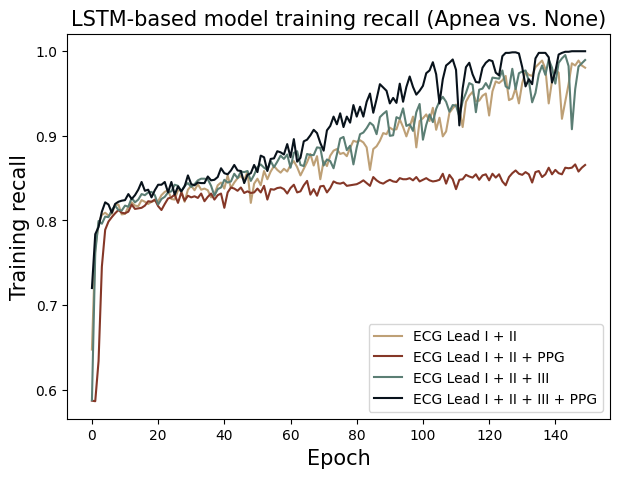

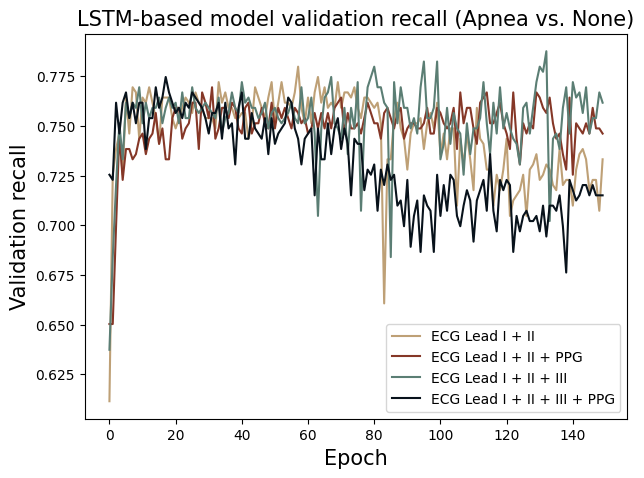

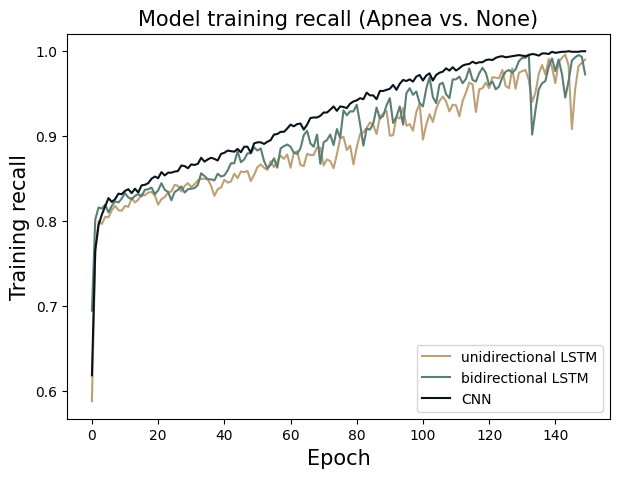

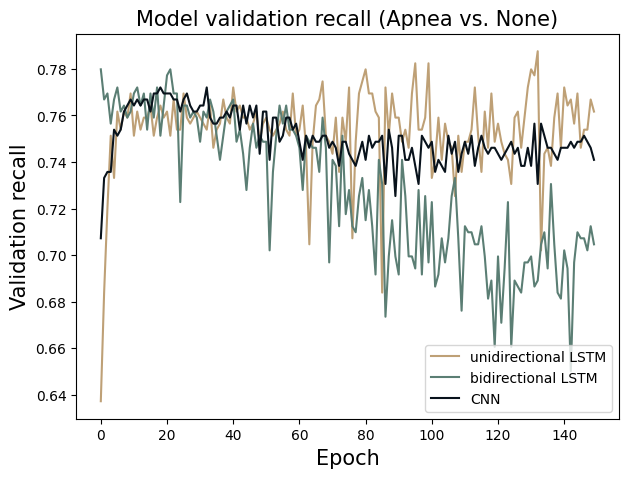

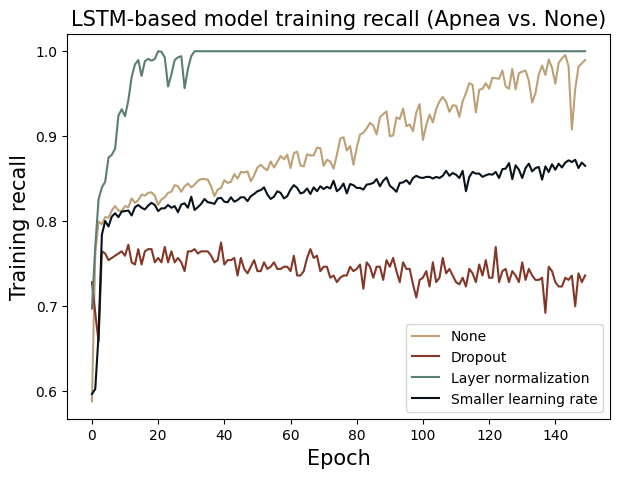

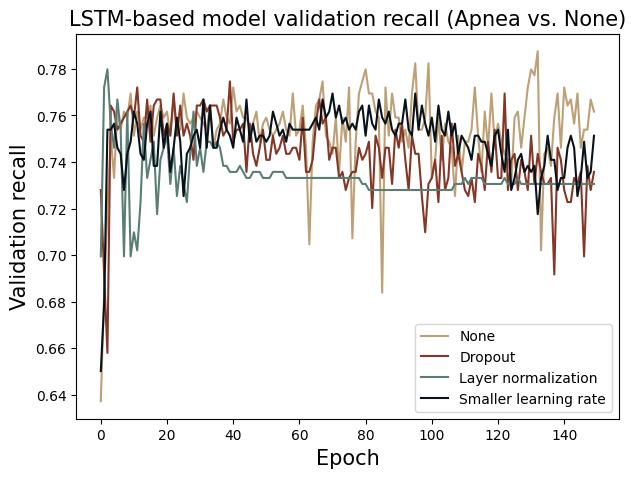

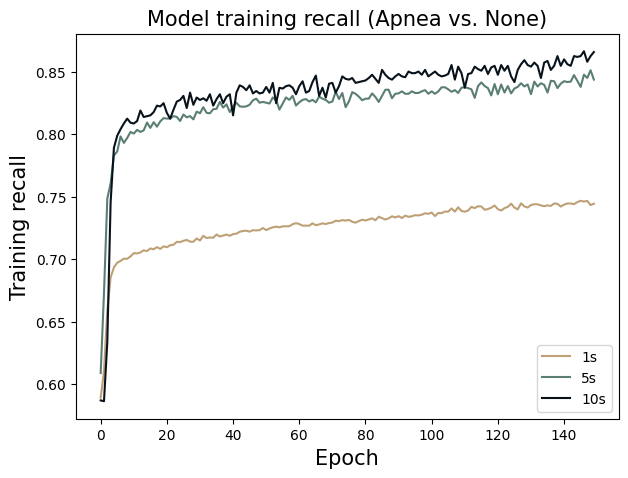

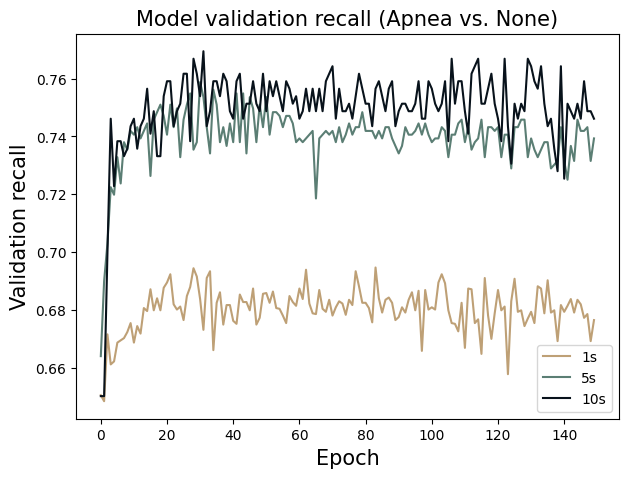

In [ ]:
recall_ecgi_ecgii = [0.6474025845527649, 0.766883134841919, 0.7967532277107239, 0.8064935207366943, 0.8090909123420715, 0.8058441281318665, 0.8077921867370605, 0.8181818127632141, 0.8188311457633972, 0.8071428537368774, 0.8077921867370605, 0.81623375415802, 0.8214285969734192, 0.817532479763031, 0.8168830871582031, 0.8240259885787964, 0.8220779299736023, 0.8194805383682251, 0.8220779299736023, 0.8233765959739685, 0.8227272629737854, 0.8298701047897339, 0.8337662220001221, 0.8357142806053162, 0.8253246545791626, 0.8246753215789795, 0.8357142806053162, 0.8350649476051331, 0.8220779299736023, 0.8363636136054993, 0.8409090638160706, 0.8357142806053162, 0.8428571224212646, 0.8363636136054993, 0.8376623392105103, 0.8357142806053162, 0.8272727131843567, 0.8311688303947449, 0.8415584564208984, 0.8448051810264587, 0.8376623392105103, 0.8532467484474182, 0.8383116722106934, 0.8448051810264587, 0.8500000238418579, 0.8525974154472351, 0.8474025726318359, 0.8577921986579895, 0.8207792043685913, 0.8435065150260925, 0.84935063123703, 0.8415584564208984, 0.8584415316581726, 0.8487012982368469, 0.8577921986579895, 0.8642857074737549, 0.8597402572631836, 0.8564935326576233, 0.8610389828681946, 0.8577921986579895, 0.8655844330787659, 0.8701298832893372, 0.8629870414733887, 0.8532467484474182, 0.8610389828681946, 0.8688311576843262, 0.8785714507102966, 0.864935040473938, 0.8759739995002747, 0.8487012982368469, 0.8701298832893372, 0.8642857074737549, 0.8766233921051025, 0.88246750831604, 0.8844155669212341, 0.8785714507102966, 0.8798701167106628, 0.8759739995002747, 0.8857142925262451, 0.8941558599472046, 0.8928571343421936, 0.8948051929473877, 0.8922078013420105, 0.8863636255264282, 0.8597402572631836, 0.8844155669212341, 0.8876623511314392, 0.8941558599472046, 0.9032467603683472, 0.9019480347633362, 0.9097402691841125, 0.9071428775787354, 0.9077922105789185, 0.9194805026054382, 0.9103896021842957, 0.899350643157959, 0.9110389351844788, 0.9227272868156433, 0.8863636255264282, 0.9175324440002441, 0.9207792282104492, 0.9253246784210205, 0.9175324440002441, 0.9331169128417969, 0.9071428775787354, 0.9214285612106323, 0.899350643157959, 0.9051948189735413, 0.9272727370262146, 0.932467520236969, 0.9370129704475403, 0.9318181872367859, 0.9103896021842957, 0.9402597546577454, 0.9474025964736938, 0.9519480466842651, 0.9409090876579285, 0.9415584206581116, 0.9474025964736938, 0.949999988079071, 0.9240259528160095, 0.9525973796844482, 0.9642857313156128, 0.9623376727104187, 0.965584397315979, 0.9707792401313782, 0.9422078132629395, 0.9441558718681335, 0.9564934968948364, 0.9383116960525513, 0.9623376727104187, 0.9759740233421326, 0.9720779061317444, 0.9707792401313782, 0.981168806552887, 0.9850649237632751, 0.9889610409736633, 0.9792208075523376, 0.9383116960525513, 0.9649350643157959, 0.9779220819473267, 0.9746752977371216, 0.9201298952102661, 0.9409090876579285, 0.9610389471054077, 0.9857142567634583, 0.983116865158081, 0.9889610409736633, 0.983116865158081, 0.9805194735527039]
recall_val_ecgi_ecgii = [0.6113989353179932, 0.7253885865211487, 0.7383419871330261, 0.7461140155792236, 0.7253885865211487, 0.7642487287521362, 0.7461140155792236, 0.7694300413131714, 0.7668393850326538, 0.7435232996940613, 0.7642487287521362, 0.7616580128669739, 0.7694300413131714, 0.7616580128669739, 0.7538859844207764, 0.7409326434135437, 0.7642487287521362, 0.7642487287521362, 0.7642487287521362, 0.7538859844207764, 0.7487046718597412, 0.7538859844207764, 0.7590673565864563, 0.7642487287521362, 0.7616580128669739, 0.7564767003059387, 0.7668393850326538, 0.7616580128669739, 0.7590673565864563, 0.7538859844207764, 0.7538859844207764, 0.7538859844207764, 0.7487046718597412, 0.772020697593689, 0.7616580128669739, 0.7668393850326538, 0.7590673565864563, 0.7590673565864563, 0.7538859844207764, 0.7538859844207764, 0.7564767003059387, 0.7564767003059387, 0.7435232996940613, 0.7512953281402588, 0.7694300413131714, 0.7642487287521362, 0.7590673565864563, 0.7538859844207764, 0.7642487287521362, 0.772020697593689, 0.7512953281402588, 0.7616580128669739, 0.772020697593689, 0.7616580128669739, 0.7616580128669739, 0.7590673565864563, 0.7668393850326538, 0.7797927260398865, 0.7590673565864563, 0.7512953281402588, 0.7642487287521362, 0.7512953281402588, 0.7668393850326538, 0.7746114134788513, 0.7616580128669739, 0.7694300413131714, 0.7590673565864563, 0.7616580128669739, 0.7590673565864563, 0.772020697593689, 0.7590673565864563, 0.7668393850326538, 0.7668393850326538, 0.7642487287521362, 0.7694300413131714, 0.7590673565864563, 0.7538859844207764, 0.7642487287521362, 0.7642487287521362, 0.7616580128669739, 0.7590673565864563, 0.7616580128669739, 0.7512953281402588, 0.6606217622756958, 0.7331606149673462, 0.7331606149673462, 0.7538859844207764, 0.7616580128669739, 0.7487046718597412, 0.7435232996940613, 0.727979302406311, 0.7461140155792236, 0.7512953281402588, 0.7512953281402588, 0.7538859844207764, 0.7383419871330261, 0.7512953281402588, 0.7564767003059387, 0.7487046718597412, 0.7616580128669739, 0.7357512712478638, 0.7461140155792236, 0.7331606149673462, 0.7487046718597412, 0.7487046718597412, 0.7098445892333984, 0.7435232996940613, 0.7305699586868286, 0.7461140155792236, 0.7331606149673462, 0.7176165580749512, 0.7590673565864563, 0.7435232996940613, 0.7409326434135437, 0.727979302406311, 0.727979302406311, 0.7098445892333984, 0.7253885865211487, 0.7176165580749512, 0.727979302406311, 0.7435232996940613, 0.7046632170677185, 0.712435245513916, 0.7150259017944336, 0.7176165580749512, 0.7253885865211487, 0.7046632170677185, 0.727979302406311, 0.7305699586868286, 0.7357512712478638, 0.7227979302406311, 0.7253885865211487, 0.7305699586868286, 0.727979302406311, 0.7202072739601135, 0.7176165580749512, 0.7383419871330261, 0.7202072739601135, 0.7227979302406311, 0.7227979302406311, 0.7098445892333984, 0.727979302406311, 0.7357512712478638, 0.7383419871330261, 0.7331606149673462, 0.7176165580749512, 0.7227979302406311, 0.7227979302406311, 0.7072538733482361, 0.7331606149673462]
recall_ecgi_ecgii_ecgiii = [0.5876623392105103, 0.7616882920265198, 0.7993506789207458, 0.7961038947105408, 0.8045454621315002, 0.8038961291313171, 0.8123376369476318, 0.817532479763031, 0.8123376369476318, 0.8116883039474487, 0.817532479763031, 0.81623375415802, 0.8266233801841736, 0.8214285969734192, 0.8246753215789795, 0.8311688303947449, 0.8298701047897339, 0.833116888999939, 0.8337662220001221, 0.8298701047897339, 0.8188311457633972, 0.8253246545791626, 0.8279221057891846, 0.833116888999939, 0.8344155550003052, 0.8422077894210815, 0.8409090638160706, 0.8344155550003052, 0.8409090638160706, 0.8441558480262756, 0.8396103978157043, 0.8428571224212646, 0.8474025726318359, 0.84935063123703, 0.84935063123703, 0.8487012982368469, 0.8409090638160706, 0.8292207717895508, 0.8370130062103271, 0.8389610648155212, 0.8480519652366638, 0.8448051810264587, 0.8461039066314697, 0.8551948070526123, 0.8500000238418579, 0.8577921986579895, 0.8571428656578064, 0.8584415316581726, 0.8467532396316528, 0.8538960814476013, 0.8629870414733887, 0.866233766078949, 0.8623376488685608, 0.8597402572631836, 0.8701298832893372, 0.8629870414733887, 0.8694804906845093, 0.8766233921051025, 0.8727272748947144, 0.8779220581054688, 0.8623376488685608, 0.8798701167106628, 0.8818181753158569, 0.8655844330787659, 0.8642857074737549, 0.8785714507102966, 0.8772727251052856, 0.8772727251052856, 0.8863636255264282, 0.8857142925262451, 0.864935040473938, 0.8720779418945312, 0.8701298832893372, 0.8616883158683777, 0.8779220581054688, 0.8967532515525818, 0.8987013101577759, 0.8831169009208679, 0.8883116841316223, 0.866233766078949, 0.8863636255264282, 0.9019480347633362, 0.9038960933685303, 0.9090909361839294, 0.9155844449996948, 0.9123376607894897, 0.9019480347633362, 0.9220778942108154, 0.9259740114212036, 0.9292207956314087, 0.8999999761581421, 0.90064936876297, 0.9220778942108154, 0.9201298952102661, 0.932467520236969, 0.9116883277893066, 0.9136363863945007, 0.9058441519737244, 0.9279220700263977, 0.9376623630523682, 0.8954545259475708, 0.9129869937896729, 0.9253246784210205, 0.9162337779998779, 0.9318181872367859, 0.9409090876579285, 0.9461038708686829, 0.9402597546577454, 0.9285714030265808, 0.9363636374473572, 0.9357143044471741, 0.9227272868156433, 0.9409090876579285, 0.9506493210792542, 0.9623376727104187, 0.9603896141052246, 0.9279220700263977, 0.9545454382896423, 0.9558441638946533, 0.9623376727104187, 0.9558441638946533, 0.9688311815261841, 0.9681817889213562, 0.9675324559211731, 0.9772727489471436, 0.9584415555000305, 0.9558441638946533, 0.9792208075523376, 0.9551948308944702, 0.9740259647369385, 0.9759740233421326, 0.9772727489471436, 0.9649350643157959, 0.9396103620529175, 0.9506493210792542, 0.9727272987365723, 0.983116865158081, 0.9720779061317444, 0.9902597665786743, 0.9805194735527039, 0.9616883397102356, 0.9863636493682861, 0.9915584325790405, 0.9954545497894287, 0.982467532157898, 0.9077922105789185, 0.9551948308944702, 0.9818181991577148, 0.9857142567634583, 0.9896103739738464]
recall_val_ecgi_ecgii_ecgiii = [0.6373056769371033, 0.6839378476142883, 0.7202072739601135, 0.7512953281402588, 0.7331606149673462, 0.7616580128669739, 0.7538859844207764, 0.7616580128669739, 0.7590673565864563, 0.7694300413131714, 0.7512953281402588, 0.7616580128669739, 0.7538859844207764, 0.7590673565864563, 0.7590673565864563, 0.7642487287521362, 0.7512953281402588, 0.7590673565864563, 0.7642487287521362, 0.7590673565864563, 0.7616580128669739, 0.7512953281402588, 0.7668393850326538, 0.7538859844207764, 0.7538859844207764, 0.7694300413131714, 0.7590673565864563, 0.7564767003059387, 0.7590673565864563, 0.7616580128669739, 0.7590673565864563, 0.7564767003059387, 0.7538859844207764, 0.7642487287521362, 0.7461140155792236, 0.7538859844207764, 0.7564767003059387, 0.7668393850326538, 0.7590673565864563, 0.7564767003059387, 0.772020697593689, 0.7616580128669739, 0.7642487287521362, 0.7590673565864563, 0.7590673565864563, 0.7538859844207764, 0.7564767003059387, 0.7616580128669739, 0.7487046718597412, 0.7564767003059387, 0.7590673565864563, 0.7538859844207764, 0.7512953281402588, 0.7538859844207764, 0.7564767003059387, 0.7616580128669739, 0.7538859844207764, 0.7512953281402588, 0.7694300413131714, 0.7512953281402588, 0.7538859844207764, 0.7642487287521362, 0.7461140155792236, 0.7046632170677185, 0.7487046718597412, 0.7642487287521362, 0.7668393850326538, 0.7746114134788513, 0.7512953281402588, 0.7487046718597412, 0.7435232996940613, 0.7590673565864563, 0.7357512712478638, 0.7590673565864563, 0.7487046718597412, 0.772020697593689, 0.7072538733482361, 0.7487046718597412, 0.7694300413131714, 0.7746114134788513, 0.7797927260398865, 0.7694300413131714, 0.7694300413131714, 0.7616580128669739, 0.7590673565864563, 0.6839378476142883, 0.772020697593689, 0.7512953281402588, 0.7694300413131714, 0.7590673565864563, 0.7590673565864563, 0.7487046718597412, 0.7538859844207764, 0.7461140155792236, 0.7694300413131714, 0.7823834419250488, 0.7538859844207764, 0.7538859844207764, 0.7590673565864563, 0.7823834419250488, 0.7331606149673462, 0.7409326434135437, 0.7590673565864563, 0.7409326434135437, 0.7564767003059387, 0.7487046718597412, 0.7461140155792236, 0.7253885865211487, 0.7512953281402588, 0.7357512712478638, 0.7487046718597412, 0.7487046718597412, 0.7538859844207764, 0.772020697593689, 0.7512953281402588, 0.7357512712478638, 0.7616580128669739, 0.7461140155792236, 0.7694300413131714, 0.7487046718597412, 0.7564767003059387, 0.7487046718597412, 0.7435232996940613, 0.7409326434135437, 0.7305699586868286, 0.7590673565864563, 0.7616580128669739, 0.7461140155792236, 0.7590673565864563, 0.772020697593689, 0.7797927260398865, 0.7772020697593689, 0.787564754486084, 0.7020725607872009, 0.7435232996940613, 0.7461140155792236, 0.7383419871330261, 0.7590673565864563, 0.7694300413131714, 0.7461140155792236, 0.772020697593689, 0.7642487287521362, 0.7668393850326538, 0.7564767003059387, 0.7694300413131714, 0.7461140155792236, 0.7538859844207764, 0.7538859844207764, 0.7668393850326538, 0.7616580128669739]
recall_ecgi_ecgii_ecgiii_ppg = [0.7201298475265503, 0.7837662100791931, 0.7922077775001526, 0.8103896379470825, 0.8214285969734192, 0.8188311457633972, 0.8090909123420715, 0.8194805383682251, 0.8220779299736023, 0.8233765959739685, 0.8240259885787964, 0.8311688303947449, 0.8253246545791626, 0.8298701047897339, 0.8363636136054993, 0.8454545736312866, 0.8350649476051331, 0.8363636136054993, 0.8272727131843567, 0.8357142806053162, 0.8422077894210815, 0.8422077894210815, 0.8454545736312866, 0.833116888999939, 0.8454545736312866, 0.8305194973945618, 0.8402597308158875, 0.8344155550003052, 0.8402597308158875, 0.8532467484474182, 0.8428571224212646, 0.8415584564208984, 0.8448051810264587, 0.8441558480262756, 0.8441558480262756, 0.8519480228424072, 0.8474025726318359, 0.8480519652366638, 0.8512986898422241, 0.8616883158683777, 0.8558441400527954, 0.8545454740524292, 0.8590909242630005, 0.8655844330787659, 0.8590909242630005, 0.8584415316581726, 0.8441558480262756, 0.8538960814476013, 0.8558441400527954, 0.8655844330787659, 0.8571428656578064, 0.8766233921051025, 0.8746753334999084, 0.8584415316581726, 0.8727272748947144, 0.8733766078948975, 0.8818181753158569, 0.8805195093154907, 0.8779220581054688, 0.8902597427368164, 0.8746753334999084, 0.8961039185523987, 0.8694804906845093, 0.8740260004997253, 0.8935064673423767, 0.8954545259475708, 0.90064936876297, 0.9071428775787354, 0.9032467603683472, 0.8915584683418274, 0.88246750831604, 0.9064934849739075, 0.9116883277893066, 0.9227272868156433, 0.9136363863945007, 0.9266234040260315, 0.9103896021842957, 0.9227272868156433, 0.9155844449996948, 0.9363636374473572, 0.9227272868156433, 0.9344155788421631, 0.9227272868156433, 0.9402597546577454, 0.949999988079071, 0.9272727370262146, 0.9435064792633057, 0.9610389471054077, 0.9571428298950195, 0.9532467722892761, 0.9383116960525513, 0.9448052048683167, 0.9389610290527344, 0.9616883397102356, 0.9402597546577454, 0.9577922224998474, 0.9701298475265503, 0.9577922224998474, 0.9487013220787048, 0.9532467722892761, 0.9590908885002136, 0.9740259647369385, 0.9772727489471436, 0.9870129823684692, 0.9727272987365723, 0.9383116960525513, 0.96688312292099, 0.983116865158081, 0.9863636493682861, 0.9902597665786743, 0.9779220819473267, 0.9123376607894897, 0.9558441638946533, 0.981168806552887, 0.9863636493682861, 0.9727272987365723, 0.9636363387107849, 0.9629870057106018, 0.9805194735527039, 0.9863636493682861, 0.9896103739738464, 0.9883117079734802, 0.9746752977371216, 0.9714285731315613, 0.9941558241844177, 0.9980519413948059, 0.9980519413948059, 0.998701274394989, 0.998701274394989, 0.9974026083946228, 0.981168806552887, 0.9584415555000305, 0.96688312292099, 0.9610389471054077, 0.9915584325790405, 0.9980519413948059, 0.9980519413948059, 0.9980519413948059, 0.9928571581840515, 0.9629870057106018, 0.9759740233421326, 0.9961038827896118, 0.9980519413948059, 0.9993506669998169, 0.9993506669998169, 1.0, 1.0, 1.0, 1.0, 1.0]
recall_val_ecgi_ecgii_ecgiii_ppg = [0.7253885865211487, 0.7227979302406311, 0.7616580128669739, 0.7461140155792236, 0.7616580128669739, 0.7668393850326538, 0.7538859844207764, 0.7616580128669739, 0.7512953281402588, 0.7616580128669739, 0.7616580128669739, 0.7383419871330261, 0.7538859844207764, 0.7538859844207764, 0.7694300413131714, 0.7590673565864563, 0.7642487287521362, 0.7746114134788513, 0.7668393850326538, 0.7616580128669739, 0.7564767003059387, 0.7590673565864563, 0.7538859844207764, 0.7616580128669739, 0.7590673565864563, 0.7668393850326538, 0.7642487287521362, 0.7616580128669739, 0.7590673565864563, 0.7538859844207764, 0.7461140155792236, 0.7564767003059387, 0.7564767003059387, 0.7616580128669739, 0.7435232996940613, 0.7616580128669739, 0.7487046718597412, 0.7512953281402588, 0.7305699586868286, 0.7590673565864563, 0.7668393850326538, 0.7435232996940613, 0.7435232996940613, 0.7564767003059387, 0.7487046718597412, 0.7461140155792236, 0.7435232996940613, 0.7538859844207764, 0.7357512712478638, 0.7538859844207764, 0.7409326434135437, 0.7461140155792236, 0.7487046718597412, 0.7512953281402588, 0.7642487287521362, 0.7616580128669739, 0.7487046718597412, 0.7435232996940613, 0.7305699586868286, 0.7435232996940613, 0.7461140155792236, 0.7487046718597412, 0.7150259017944336, 0.7487046718597412, 0.7331606149673462, 0.7331606149673462, 0.7512953281402588, 0.7357512712478638, 0.7487046718597412, 0.7538859844207764, 0.7383419871330261, 0.7487046718597412, 0.7409326434135437, 0.7150259017944336, 0.7435232996940613, 0.7409326434135437, 0.7409326434135437, 0.7176165580749512, 0.727979302406311, 0.7253885865211487, 0.7305699586868286, 0.7072538733482361, 0.727979302406311, 0.7202072739601135, 0.7305699586868286, 0.7227979302406311, 0.7253885865211487, 0.7098445892333984, 0.712435245513916, 0.6994818449020386, 0.7227979302406311, 0.6891191601753235, 0.7046632170677185, 0.712435245513916, 0.6865285038948059, 0.7150259017944336, 0.7098445892333984, 0.7072538733482361, 0.6865285038948059, 0.7253885865211487, 0.7046632170677185, 0.7202072739601135, 0.7072538733482361, 0.7253885865211487, 0.7227979302406311, 0.7046632170677185, 0.6994818449020386, 0.7098445892333984, 0.7176165580749512, 0.712435245513916, 0.6917098164558411, 0.712435245513916, 0.7176165580749512, 0.7227979302406311, 0.7072538733482361, 0.7357512712478638, 0.7072538733482361, 0.696891188621521, 0.7227979302406311, 0.7176165580749512, 0.7227979302406311, 0.7202072739601135, 0.6865285038948059, 0.7046632170677185, 0.696891188621521, 0.7046632170677185, 0.7072538733482361, 0.7020725607872009, 0.7020725607872009, 0.7046632170677185, 0.696891188621521, 0.7098445892333984, 0.6943005323410034, 0.7098445892333984, 0.7098445892333984, 0.7072538733482361, 0.7150259017944336, 0.6994818449020386, 0.6761658191680908, 0.7227979302406311, 0.7176165580749512, 0.712435245513916, 0.7150259017944336, 0.7202072739601135, 0.7202072739601135, 0.7150259017944336, 0.7202072739601135, 0.7150259017944336, 0.7150259017944336, 0.7150259017944336]
recall_ecgi_ecgii_ppg = [0.5870130062103271, 0.5863636136054993, 0.633766233921051, 0.7454545497894287, 0.7889610528945923, 0.798701286315918, 0.8038961291313171, 0.8084415793418884, 0.8123376369476318, 0.8090909123420715, 0.8084415793418884, 0.8103896379470825, 0.8188311457633972, 0.8136363625526428, 0.8142856955528259, 0.8149350881576538, 0.817532479763031, 0.8227272629737854, 0.8220779299736023, 0.8246753215789795, 0.8168830871582031, 0.8123376369476318, 0.8194805383682251, 0.8259740471839905, 0.8272727131843567, 0.8305194973945618, 0.8207792043685913, 0.833116888999939, 0.8233765959739685, 0.8292207717895508, 0.8272727131843567, 0.8285714387893677, 0.8266233801841736, 0.831818163394928, 0.8227272629737854, 0.8279221057891846, 0.831818163394928, 0.8246753215789795, 0.8298701047897339, 0.831818163394928, 0.8149350881576538, 0.833116888999939, 0.8389610648155212, 0.8376623392105103, 0.8350649476051331, 0.8389610648155212, 0.8324675559997559, 0.8344155550003052, 0.8324675559997559, 0.833116888999939, 0.8376623392105103, 0.833116888999939, 0.8409090638160706, 0.8246753215789795, 0.8370130062103271, 0.8363636136054993, 0.8383116722106934, 0.8389610648155212, 0.8370130062103271, 0.831818163394928, 0.8383116722106934, 0.8422077894210815, 0.833116888999939, 0.8344155550003052, 0.8415584564208984, 0.8467532396316528, 0.8305194973945618, 0.8370130062103271, 0.8292207717895508, 0.8402597308158875, 0.8409090638160706, 0.833116888999939, 0.8383116722106934, 0.8461039066314697, 0.8441558480262756, 0.8435065150260925, 0.8448051810264587, 0.8409090638160706, 0.8415584564208984, 0.8422077894210815, 0.8428571224212646, 0.8448051810264587, 0.8474025726318359, 0.8441558480262756, 0.8409090638160706, 0.8512986898422241, 0.8474025726318359, 0.8448051810264587, 0.8435065150260925, 0.8461039066314697, 0.8480519652366638, 0.8461039066314697, 0.8454545736312866, 0.8500000238418579, 0.8487012982368469, 0.8487012982368469, 0.8500000238418579, 0.8474025726318359, 0.8512986898422241, 0.8461039066314697, 0.8480519652366638, 0.8500000238418579, 0.8474025726318359, 0.8461039066314697, 0.8467532396316528, 0.8480519652366638, 0.8551948070526123, 0.8435065150260925, 0.8538960814476013, 0.8487012982368469, 0.8370130062103271, 0.8480519652366638, 0.8487012982368469, 0.8538960814476013, 0.8519480228424072, 0.850649356842041, 0.8545454740524292, 0.8480519652366638, 0.8532467484474182, 0.8545454740524292, 0.8474025726318359, 0.8551948070526123, 0.850649356842041, 0.8545454740524292, 0.8461039066314697, 0.8415584564208984, 0.8512986898422241, 0.8558441400527954, 0.8590909242630005, 0.8551948070526123, 0.8538960814476013, 0.8571428656578064, 0.8545454740524292, 0.8448051810264587, 0.8571428656578064, 0.8584415316581726, 0.8512986898422241, 0.8545454740524292, 0.8623376488685608, 0.8545454740524292, 0.8597402572631836, 0.8558441400527954, 0.8545454740524292, 0.8623376488685608, 0.8616883158683777, 0.8623376488685608, 0.866233766078949, 0.8577921986579895, 0.8623376488685608, 0.8655844330787659]
recall_val_ecgi_ecgii_ppg = [0.6502590775489807, 0.6502590775489807, 0.6994818449020386, 0.7461140155792236, 0.7227979302406311, 0.7383419871330261, 0.7383419871330261, 0.7331606149673462, 0.7357512712478638, 0.7435232996940613, 0.7461140155792236, 0.7357512712478638, 0.7435232996940613, 0.7461140155792236, 0.7564767003059387, 0.7409326434135437, 0.7487046718597412, 0.7331606149673462, 0.7331606149673462, 0.7538859844207764, 0.7590673565864563, 0.7590673565864563, 0.7435232996940613, 0.7487046718597412, 0.7512953281402588, 0.7616580128669739, 0.7616580128669739, 0.7383419871330261, 0.7668393850326538, 0.7616580128669739, 0.7538859844207764, 0.7694300413131714, 0.7435232996940613, 0.7487046718597412, 0.7590673565864563, 0.7590673565864563, 0.7538859844207764, 0.7616580128669739, 0.7590673565864563, 0.7487046718597412, 0.7461140155792236, 0.7590673565864563, 0.7616580128669739, 0.7461140155792236, 0.7512953281402588, 0.7512953281402588, 0.7590673565864563, 0.7512953281402588, 0.7487046718597412, 0.7616580128669739, 0.7487046718597412, 0.7590673565864563, 0.7538859844207764, 0.7590673565864563, 0.7538859844207764, 0.7487046718597412, 0.7590673565864563, 0.7564767003059387, 0.7512953281402588, 0.7538859844207764, 0.7461140155792236, 0.7487046718597412, 0.7564767003059387, 0.7487046718597412, 0.7564767003059387, 0.7487046718597412, 0.7564767003059387, 0.7487046718597412, 0.7590673565864563, 0.7616580128669739, 0.7642487287521362, 0.7461140155792236, 0.7564767003059387, 0.7487046718597412, 0.7487046718597412, 0.7512953281402588, 0.7461140155792236, 0.7538859844207764, 0.7616580128669739, 0.7564767003059387, 0.7512953281402588, 0.7512953281402588, 0.7435232996940613, 0.7564767003059387, 0.7590673565864563, 0.7538859844207764, 0.7487046718597412, 0.7564767003059387, 0.7590673565864563, 0.7435232996940613, 0.7487046718597412, 0.7512953281402588, 0.7512953281402588, 0.7487046718597412, 0.7487046718597412, 0.7512953281402588, 0.7590673565864563, 0.7461140155792236, 0.7461140155792236, 0.7590673565864563, 0.7564767003059387, 0.7512953281402588, 0.7487046718597412, 0.7512953281402588, 0.7590673565864563, 0.7383419871330261, 0.7668393850326538, 0.7512953281402588, 0.7590673565864563, 0.7590673565864563, 0.7487046718597412, 0.7409326434135437, 0.7616580128669739, 0.7642487287521362, 0.7668393850326538, 0.7512953281402588, 0.7512953281402588, 0.7564767003059387, 0.7616580128669739, 0.7512953281402588, 0.7461140155792236, 0.7383419871330261, 0.7668393850326538, 0.7435232996940613, 0.7305699586868286, 0.7512953281402588, 0.7461140155792236, 0.7512953281402588, 0.7487046718597412, 0.7668393850326538, 0.7642487287521362, 0.7590673565864563, 0.7564767003059387, 0.7642487287521362, 0.7512953281402588, 0.7435232996940613, 0.7461140155792236, 0.7357512712478638, 0.727979302406311, 0.7642487287521362, 0.7253885865211487, 0.7512953281402588, 0.7487046718597412, 0.7461140155792236, 0.7512953281402588, 0.7461140155792236, 0.7590673565864563, 0.7487046718597412, 0.7487046718597412, 0.7461140155792236]

recall_ecgi_ecgii_ecgiii_dropout = [0.6558441519737244, 0.784415602684021, 0.7974026203155518, 0.8084415793418884, 0.8006493449211121, 0.8103896379470825, 0.8116883039474487, 0.81623375415802, 0.8181818127632141, 0.8149350881576538, 0.81623375415802, 0.8194805383682251, 0.8233765959739685, 0.8253246545791626, 0.8233765959739685, 0.8311688303947449, 0.8207792043685913, 0.8298701047897339, 0.8227272629737854, 0.8337662220001221, 0.8324675559997559, 0.8298701047897339, 0.8253246545791626, 0.8350649476051331, 0.8305194973945618, 0.833116888999939, 0.8324675559997559, 0.8279221057891846, 0.8149350881576538, 0.8441558480262756, 0.8428571224212646, 0.833116888999939, 0.8357142806053162, 0.8253246545791626, 0.8337662220001221, 0.8409090638160706, 0.8396103978157043, 0.8422077894210815, 0.8441558480262756, 0.8435065150260925, 0.8415584564208984, 0.8415584564208984, 0.8474025726318359, 0.8487012982368469, 0.8487012982368469, 0.8512986898422241, 0.8538960814476013, 0.8337662220001221, 0.8461039066314697, 0.8428571224212646, 0.8467532396316528, 0.850649356842041, 0.8512986898422241, 0.8487012982368469, 0.8422077894210815, 0.8532467484474182, 0.8551948070526123, 0.8525974154472351, 0.8577921986579895, 0.8603895902633667, 0.8558441400527954, 0.8512986898422241, 0.8577921986579895, 0.8590909242630005, 0.8487012982368469, 0.8584415316581726, 0.8525974154472351, 0.8584415316581726, 0.8642857074737549, 0.8584415316581726, 0.8629870414733887, 0.8642857074737549, 0.8688311576843262, 0.8694804906845093, 0.8746753334999084, 0.8733766078948975, 0.8714285492897034, 0.8551948070526123, 0.8720779418945312, 0.8597402572631836, 0.8610389828681946, 0.8753246665000916, 0.8811688423156738, 0.8740260004997253, 0.883766233921051, 0.8759739995002747, 0.8785714507102966, 0.8805195093154907, 0.8733766078948975, 0.8772727251052856, 0.8831169009208679, 0.8876623511314392, 0.8805195093154907, 0.8876623511314392, 0.8928571343421936, 0.8987013101577759, 0.8928571343421936, 0.8896104097366333, 0.8623376488685608, 0.8714285492897034, 0.8863636255264282, 0.8889610171318054, 0.8941558599472046, 0.8928571343421936, 0.899350643157959, 0.8954545259475708, 0.90064936876297, 0.9097402691841125, 0.9025974273681641, 0.9090909361839294, 0.9012987017631531, 0.9227272868156433, 0.9071428775787354, 0.9227272868156433, 0.918181836605072, 0.9155844449996948, 0.8909090757369995, 0.9084415435791016, 0.8987013101577759, 0.9246753454208374, 0.9142857193946838, 0.9344155788421631, 0.9103896021842957, 0.8688311576843262, 0.9149350523948669, 0.9240259528160095, 0.9318181872367859, 0.9363636374473572, 0.918181836605072, 0.9415584206581116, 0.9474025964736938, 0.949999988079071, 0.9558441638946533, 0.9318181872367859, 0.9409090876579285, 0.9461038708686829, 0.949999988079071, 0.9331169128417969, 0.9344155788421631, 0.9551948308944702, 0.9597402811050415, 0.9577922224998474, 0.9441558718681335, 0.9344155788421631, 0.9623376727104187, 0.9623376727104187, 0.9694805145263672, 0.965584397315979, 0.9733766317367554, 0.9194805026054382]
recall_val_ecgi_ecgii_ecgiii_dropout = [0.727979302406311, 0.6917098164558411, 0.6580311059951782, 0.7642487287521362, 0.7616580128669739, 0.7538859844207764, 0.7564767003059387, 0.7590673565864563, 0.7616580128669739, 0.7642487287521362, 0.7590673565864563, 0.772020697593689, 0.7512953281402588, 0.7487046718597412, 0.7668393850326538, 0.7487046718597412, 0.7642487287521362, 0.7668393850326538, 0.7668393850326538, 0.7512953281402588, 0.7564767003059387, 0.7512953281402588, 0.7694300413131714, 0.7512953281402588, 0.7642487287521362, 0.7512953281402588, 0.7564767003059387, 0.7512953281402588, 0.7409326434135437, 0.7642487287521362, 0.7642487287521362, 0.7668393850326538, 0.7616580128669739, 0.7642487287521362, 0.7642487287521362, 0.7642487287521362, 0.7590673565864563, 0.7512953281402588, 0.7538859844207764, 0.7746114134788513, 0.7487046718597412, 0.7538859844207764, 0.7538859844207764, 0.7564767003059387, 0.7357512712478638, 0.7564767003059387, 0.7435232996940613, 0.7383419871330261, 0.7461140155792236, 0.7538859844207764, 0.7409326434135437, 0.7409326434135437, 0.7512953281402588, 0.7435232996940613, 0.7461140155792236, 0.7512953281402588, 0.7435232996940613, 0.7435232996940613, 0.7461140155792236, 0.7461140155792236, 0.7409326434135437, 0.7590673565864563, 0.7357512712478638, 0.7357512712478638, 0.7409326434135437, 0.7564767003059387, 0.7668393850326538, 0.7564767003059387, 0.7590673565864563, 0.7409326434135437, 0.7461140155792236, 0.7461140155792236, 0.7331606149673462, 0.7357512712478638, 0.727979302406311, 0.7331606149673462, 0.7357512712478638, 0.7357512712478638, 0.7461140155792236, 0.7409326434135437, 0.7435232996940613, 0.7487046718597412, 0.7202072739601135, 0.7512953281402588, 0.7461140155792236, 0.7331606149673462, 0.7461140155792236, 0.7461140155792236, 0.7305699586868286, 0.7538859844207764, 0.7461140155792236, 0.7564767003059387, 0.7409326434135437, 0.727979302406311, 0.7512953281402588, 0.7435232996940613, 0.7435232996940613, 0.7253885865211487, 0.7098445892333984, 0.7305699586868286, 0.7331606149673462, 0.7409326434135437, 0.7227979302406311, 0.7512953281402588, 0.727979302406311, 0.7331606149673462, 0.7564767003059387, 0.7383419871330261, 0.7435232996940613, 0.7357512712478638, 0.727979302406311, 0.7253885865211487, 0.7331606149673462, 0.7227979302406311, 0.7435232996940613, 0.7383419871330261, 0.727979302406311, 0.7487046718597412, 0.7357512712478638, 0.7538859844207764, 0.7331606149673462, 0.7331606149673462, 0.7694300413131714, 0.727979302406311, 0.7409326434135437, 0.7435232996940613, 0.727979302406311, 0.7409326434135437, 0.7357512712478638, 0.727979302406311, 0.7512953281402588, 0.7305699586868286, 0.7435232996940613, 0.7357512712478638, 0.7305699586868286, 0.7305699586868286, 0.7331606149673462, 0.6917098164558411, 0.7461140155792236, 0.7409326434135437, 0.727979302406311, 0.7227979302406311, 0.7227979302406311, 0.7331606149673462, 0.7305699586868286, 0.7357512712478638, 0.6994818449020386, 0.7383419871330261, 0.727979302406311, 0.7357512712478638]
recall_ecgi_ecgii_ecgiii_layerN = [0.6967532634735107, 0.7701298594474792, 0.8253246545791626, 0.8396103978157043, 0.8461039066314697, 0.8746753334999084, 0.8779220581054688, 0.885064959526062, 0.9240259528160095, 0.9318181872367859, 0.9233766198158264, 0.9422078132629395, 0.9694805145263672, 0.984415590763092, 0.9896103739738464, 0.9707792401313782, 0.9883117079734802, 0.9909090995788574, 0.9889610409736633, 0.9909090995788574, 1.0, 0.9993506669998169, 0.9928571581840515, 0.9584415555000305, 0.9727272987365723, 0.9896103739738464, 0.9928571581840515, 0.9941558241844177, 0.9564934968948364, 0.9792208075523376, 0.9941558241844177, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
recall_val_ecgi_ecgii_ecgiii_layerN = [0.6994818449020386, 0.772020697593689, 0.7797927260398865, 0.7564767003059387, 0.7461140155792236, 0.7668393850326538, 0.7538859844207764, 0.6994818449020386, 0.7616580128669739, 0.6994818449020386, 0.7098445892333984, 0.7020725607872009, 0.7227979302406311, 0.7564767003059387, 0.7331606149673462, 0.7409326434135437, 0.7487046718597412, 0.7176165580749512, 0.7409326434135437, 0.7461140155792236, 0.7512953281402588, 0.7305699586868286, 0.7461140155792236, 0.7253885865211487, 0.7383419871330261, 0.7305699586868286, 0.7227979302406311, 0.7435232996940613, 0.7616580128669739, 0.7383419871330261, 0.7461140155792236, 0.7357512712478638, 0.7487046718597412, 0.7487046718597412, 0.7461140155792236, 0.7487046718597412, 0.7461140155792236, 0.7383419871330261, 0.7383419871330261, 0.7357512712478638, 0.7357512712478638, 0.7357512712478638, 0.7383419871330261, 0.7357512712478638, 0.7331606149673462, 0.7331606149673462, 0.7357512712478638, 0.7357512712478638, 0.7357512712478638, 0.7331606149673462, 0.7331606149673462, 0.7331606149673462, 0.7357512712478638, 0.7357512712478638, 0.7357512712478638, 0.7357512712478638, 0.7331606149673462, 0.7331606149673462, 0.7331606149673462, 0.7331606149673462, 0.7331606149673462, 0.7331606149673462, 0.7331606149673462, 0.7331606149673462, 0.7331606149673462, 0.7331606149673462, 0.7331606149673462, 0.7331606149673462, 0.7331606149673462, 0.7331606149673462, 0.7331606149673462, 0.7331606149673462, 0.7331606149673462, 0.7331606149673462, 0.7331606149673462, 0.7331606149673462, 0.7331606149673462, 0.7331606149673462, 0.7331606149673462, 0.7305699586868286, 0.7305699586868286, 0.727979302406311, 0.727979302406311, 0.727979302406311, 0.727979302406311, 0.727979302406311, 0.727979302406311, 0.727979302406311, 0.727979302406311, 0.727979302406311, 0.727979302406311, 0.727979302406311, 0.727979302406311, 0.727979302406311, 0.727979302406311, 0.727979302406311, 0.727979302406311, 0.727979302406311, 0.727979302406311, 0.727979302406311, 0.727979302406311, 0.727979302406311, 0.727979302406311, 0.727979302406311, 0.727979302406311, 0.727979302406311, 0.727979302406311, 0.7305699586868286, 0.7305699586868286, 0.7305699586868286, 0.7331606149673462, 0.7305699586868286, 0.7331606149673462, 0.7331606149673462, 0.7331606149673462, 0.7331606149673462, 0.7305699586868286, 0.7305699586868286, 0.7305699586868286, 0.7305699586868286, 0.7305699586868286, 0.7305699586868286, 0.7331606149673462, 0.7305699586868286, 0.7305699586868286, 0.7305699586868286, 0.7331606149673462, 0.7305699586868286, 0.7305699586868286, 0.7305699586868286, 0.7305699586868286, 0.7305699586868286, 0.7305699586868286, 0.7305699586868286, 0.7305699586868286, 0.7305699586868286, 0.7305699586868286, 0.7305699586868286, 0.7305699586868286, 0.7305699586868286, 0.7305699586868286, 0.7305699586868286, 0.7305699586868286, 0.7305699586868286, 0.7305699586868286, 0.7305699586868286, 0.7305699586868286, 0.7305699586868286, 0.7305699586868286, 0.7305699586868286]
recall_ecgi_ecgii_ecgiii_lr = [0.5961039066314697, 0.6019480228424072, 0.6655844449996948, 0.7837662100791931, 0.800000011920929, 0.7935065031051636, 0.8051947951316833, 0.8090909123420715, 0.8045454621315002, 0.8110389709472656, 0.8116883039474487, 0.8123376369476318, 0.8064935207366943, 0.81623375415802, 0.8188311457633972, 0.8155844211578369, 0.8136363625526428, 0.8181818127632141, 0.8214285969734192, 0.8188311457633972, 0.8116883039474487, 0.8149350881576538, 0.8149350881576538, 0.8188311457633972, 0.8155844211578369, 0.817532479763031, 0.8103896379470825, 0.8194805383682251, 0.8207792043685913, 0.8155844211578369, 0.8285714387893677, 0.8129870295524597, 0.81623375415802, 0.8201298713684082, 0.8259740471839905, 0.8220779299736023, 0.8214285969734192, 0.8201298713684082, 0.8266233801841736, 0.8272727131843567, 0.8227272629737854, 0.8220779299736023, 0.8279221057891846, 0.8227272629737854, 0.8246753215789795, 0.8279221057891846, 0.8279221057891846, 0.8233765959739685, 0.8292207717895508, 0.831818163394928, 0.8350649476051331, 0.8363636136054993, 0.8396103978157043, 0.8311688303947449, 0.8259740471839905, 0.8285714387893677, 0.8350649476051331, 0.833116888999939, 0.8266233801841736, 0.8292207717895508, 0.8370130062103271, 0.8422077894210815, 0.8389610648155212, 0.8324675559997559, 0.8337662220001221, 0.8383116722106934, 0.831818163394928, 0.8396103978157043, 0.8350649476051331, 0.8409090638160706, 0.8376623392105103, 0.8402597308158875, 0.8383116722106934, 0.8474025726318359, 0.8350649476051331, 0.8383116722106934, 0.8441558480262756, 0.8324675559997559, 0.8435065150260925, 0.8422077894210815, 0.8389610648155212, 0.8389610648155212, 0.8370130062103271, 0.8428571224212646, 0.8435065150260925, 0.8448051810264587, 0.84935063123703, 0.8409090638160706, 0.8474025726318359, 0.8512986898422241, 0.8415584564208984, 0.8383116722106934, 0.8344155550003052, 0.8448051810264587, 0.8454545736312866, 0.8480519652366638, 0.8435065150260925, 0.850649356842041, 0.8532467484474182, 0.8512986898422241, 0.850649356842041, 0.8519480228424072, 0.8519480228424072, 0.8500000238418579, 0.8519480228424072, 0.850649356842041, 0.8532467484474182, 0.8590909242630005, 0.8532467484474182, 0.8564935326576233, 0.8545454740524292, 0.850649356842041, 0.8590909242630005, 0.8350649476051331, 0.8519480228424072, 0.8577921986579895, 0.8558441400527954, 0.8558441400527954, 0.8519480228424072, 0.8538960814476013, 0.8551948070526123, 0.8545454740524292, 0.8577921986579895, 0.850649356842041, 0.8610389828681946, 0.8616883158683777, 0.8681818246841431, 0.84935063123703, 0.8655844330787659, 0.8603895902633667, 0.850649356842041, 0.8623376488685608, 0.86753249168396, 0.8584415316581726, 0.8623376488685608, 0.8636363744735718, 0.8487012982368469, 0.8642857074737549, 0.8577921986579895, 0.8668830990791321, 0.8603895902633667, 0.86753249168396, 0.8629870414733887, 0.8688311576843262, 0.8714285492897034, 0.8694804906845093, 0.8720779418945312, 0.8623376488685608, 0.8688311576843262, 0.864935040473938]
recall_val_ecgi_ecgii_ecgiii_lr = [0.6502590775489807, 0.6787564754486084, 0.7538859844207764, 0.7538859844207764, 0.7564767003059387, 0.7461140155792236, 0.7435232996940613, 0.727979302406311, 0.7435232996940613, 0.7487046718597412, 0.7616580128669739, 0.7564767003059387, 0.7435232996940613, 0.7409326434135437, 0.7564767003059387, 0.7616580128669739, 0.7383419871330261, 0.7383419871330261, 0.7616580128669739, 0.7461140155792236, 0.7564767003059387, 0.7357512712478638, 0.7461140155792236, 0.7590673565864563, 0.7487046718597412, 0.7253885865211487, 0.7435232996940613, 0.7461140155792236, 0.7512953281402588, 0.7538859844207764, 0.7461140155792236, 0.7668393850326538, 0.7461140155792236, 0.7642487287521362, 0.7461140155792236, 0.7461140155792236, 0.7538859844207764, 0.7590673565864563, 0.7538859844207764, 0.7512953281402588, 0.7461140155792236, 0.7590673565864563, 0.7538859844207764, 0.7487046718597412, 0.7668393850326538, 0.7487046718597412, 0.7564767003059387, 0.7487046718597412, 0.7512953281402588, 0.7512953281402588, 0.7487046718597412, 0.7512953281402588, 0.7616580128669739, 0.7564767003059387, 0.7512953281402588, 0.7538859844207764, 0.7487046718597412, 0.7564767003059387, 0.7538859844207764, 0.7538859844207764, 0.7538859844207764, 0.7538859844207764, 0.7538859844207764, 0.7538859844207764, 0.7564767003059387, 0.7590673565864563, 0.7538859844207764, 0.7668393850326538, 0.7590673565864563, 0.7616580128669739, 0.7694300413131714, 0.7590673565864563, 0.7642487287521362, 0.7564767003059387, 0.7590673565864563, 0.7538859844207764, 0.7564767003059387, 0.7538859844207764, 0.7616580128669739, 0.7642487287521362, 0.7512953281402588, 0.7642487287521362, 0.7564767003059387, 0.7538859844207764, 0.7668393850326538, 0.7590673565864563, 0.7564767003059387, 0.7616580128669739, 0.7538859844207764, 0.7512953281402588, 0.7564767003059387, 0.7564767003059387, 0.7668393850326538, 0.7538859844207764, 0.7512953281402588, 0.7694300413131714, 0.7538859844207764, 0.7642487287521362, 0.7564767003059387, 0.7512953281402588, 0.7590673565864563, 0.7487046718597412, 0.7642487287521362, 0.7538859844207764, 0.7512953281402588, 0.7616580128669739, 0.7512953281402588, 0.7564767003059387, 0.7435232996940613, 0.7512953281402588, 0.7487046718597412, 0.7461140155792236, 0.7409326434135437, 0.7512953281402588, 0.7512953281402588, 0.7487046718597412, 0.7487046718597412, 0.7435232996940613, 0.7383419871330261, 0.7512953281402588, 0.7538859844207764, 0.7435232996940613, 0.7357512712478638, 0.7538859844207764, 0.727979302406311, 0.7331606149673462, 0.7409326434135437, 0.7435232996940613, 0.7357512712478638, 0.7383419871330261, 0.7357512712478638, 0.7383419871330261, 0.7176165580749512, 0.7331606149673462, 0.7383419871330261, 0.7512953281402588, 0.7409326434135437, 0.7409326434135437, 0.727979302406311, 0.7331606149673462, 0.7331606149673462, 0.7461140155792236, 0.7512953281402588, 0.7461140155792236, 0.7253885865211487, 0.7331606149673462, 0.7487046718597412, 0.7331606149673462, 0.7357512712478638, 0.7512953281402588]

recall_ecgi_ecgii_ecgiii_unidirectional = [0.5876623392105103, 0.7616882920265198, 0.7993506789207458, 0.7961038947105408, 0.8045454621315002, 0.8038961291313171, 0.8123376369476318, 0.817532479763031, 0.8123376369476318, 0.8116883039474487, 0.817532479763031, 0.81623375415802, 0.8266233801841736, 0.8214285969734192, 0.8246753215789795, 0.8311688303947449, 0.8298701047897339, 0.833116888999939, 0.8337662220001221, 0.8298701047897339, 0.8188311457633972, 0.8253246545791626, 0.8279221057891846, 0.833116888999939, 0.8344155550003052, 0.8422077894210815, 0.8409090638160706, 0.8344155550003052, 0.8409090638160706, 0.8441558480262756, 0.8396103978157043, 0.8428571224212646, 0.8474025726318359, 0.84935063123703, 0.84935063123703, 0.8487012982368469, 0.8409090638160706, 0.8292207717895508, 0.8370130062103271, 0.8389610648155212, 0.8480519652366638, 0.8448051810264587, 0.8461039066314697, 0.8551948070526123, 0.8500000238418579, 0.8577921986579895, 0.8571428656578064, 0.8584415316581726, 0.8467532396316528, 0.8538960814476013, 0.8629870414733887, 0.866233766078949, 0.8623376488685608, 0.8597402572631836, 0.8701298832893372, 0.8629870414733887, 0.8694804906845093, 0.8766233921051025, 0.8727272748947144, 0.8779220581054688, 0.8623376488685608, 0.8798701167106628, 0.8818181753158569, 0.8655844330787659, 0.8642857074737549, 0.8785714507102966, 0.8772727251052856, 0.8772727251052856, 0.8863636255264282, 0.8857142925262451, 0.864935040473938, 0.8720779418945312, 0.8701298832893372, 0.8616883158683777, 0.8779220581054688, 0.8967532515525818, 0.8987013101577759, 0.8831169009208679, 0.8883116841316223, 0.866233766078949, 0.8863636255264282, 0.9019480347633362, 0.9038960933685303, 0.9090909361839294, 0.9155844449996948, 0.9123376607894897, 0.9019480347633362, 0.9220778942108154, 0.9259740114212036, 0.9292207956314087, 0.8999999761581421, 0.90064936876297, 0.9220778942108154, 0.9201298952102661, 0.932467520236969, 0.9116883277893066, 0.9136363863945007, 0.9058441519737244, 0.9279220700263977, 0.9376623630523682, 0.8954545259475708, 0.9129869937896729, 0.9253246784210205, 0.9162337779998779, 0.9318181872367859, 0.9409090876579285, 0.9461038708686829, 0.9402597546577454, 0.9285714030265808, 0.9363636374473572, 0.9357143044471741, 0.9227272868156433, 0.9409090876579285, 0.9506493210792542, 0.9623376727104187, 0.9603896141052246, 0.9279220700263977, 0.9545454382896423, 0.9558441638946533, 0.9623376727104187, 0.9558441638946533, 0.9688311815261841, 0.9681817889213562, 0.9675324559211731, 0.9772727489471436, 0.9584415555000305, 0.9558441638946533, 0.9792208075523376, 0.9551948308944702, 0.9740259647369385, 0.9759740233421326, 0.9772727489471436, 0.9649350643157959, 0.9396103620529175, 0.9506493210792542, 0.9727272987365723, 0.983116865158081, 0.9720779061317444, 0.9902597665786743, 0.9805194735527039, 0.9616883397102356, 0.9863636493682861, 0.9915584325790405, 0.9954545497894287, 0.982467532157898, 0.9077922105789185, 0.9551948308944702, 0.9818181991577148, 0.9857142567634583, 0.9896103739738464]
recall_val_ecgi_ecgii_ecgiii_unidirectional = [0.6373056769371033, 0.6839378476142883, 0.7202072739601135, 0.7512953281402588, 0.7331606149673462, 0.7616580128669739, 0.7538859844207764, 0.7616580128669739, 0.7590673565864563, 0.7694300413131714, 0.7512953281402588, 0.7616580128669739, 0.7538859844207764, 0.7590673565864563, 0.7590673565864563, 0.7642487287521362, 0.7512953281402588, 0.7590673565864563, 0.7642487287521362, 0.7590673565864563, 0.7616580128669739, 0.7512953281402588, 0.7668393850326538, 0.7538859844207764, 0.7538859844207764, 0.7694300413131714, 0.7590673565864563, 0.7564767003059387, 0.7590673565864563, 0.7616580128669739, 0.7590673565864563, 0.7564767003059387, 0.7538859844207764, 0.7642487287521362, 0.7461140155792236, 0.7538859844207764, 0.7564767003059387, 0.7668393850326538, 0.7590673565864563, 0.7564767003059387, 0.772020697593689, 0.7616580128669739, 0.7642487287521362, 0.7590673565864563, 0.7590673565864563, 0.7538859844207764, 0.7564767003059387, 0.7616580128669739, 0.7487046718597412, 0.7564767003059387, 0.7590673565864563, 0.7538859844207764, 0.7512953281402588, 0.7538859844207764, 0.7564767003059387, 0.7616580128669739, 0.7538859844207764, 0.7512953281402588, 0.7694300413131714, 0.7512953281402588, 0.7538859844207764, 0.7642487287521362, 0.7461140155792236, 0.7046632170677185, 0.7487046718597412, 0.7642487287521362, 0.7668393850326538, 0.7746114134788513, 0.7512953281402588, 0.7487046718597412, 0.7435232996940613, 0.7590673565864563, 0.7357512712478638, 0.7590673565864563, 0.7487046718597412, 0.772020697593689, 0.7072538733482361, 0.7487046718597412, 0.7694300413131714, 0.7746114134788513, 0.7797927260398865, 0.7694300413131714, 0.7694300413131714, 0.7616580128669739, 0.7590673565864563, 0.6839378476142883, 0.772020697593689, 0.7512953281402588, 0.7694300413131714, 0.7590673565864563, 0.7590673565864563, 0.7487046718597412, 0.7538859844207764, 0.7461140155792236, 0.7694300413131714, 0.7823834419250488, 0.7538859844207764, 0.7538859844207764, 0.7590673565864563, 0.7823834419250488, 0.7331606149673462, 0.7409326434135437, 0.7590673565864563, 0.7409326434135437, 0.7564767003059387, 0.7487046718597412, 0.7461140155792236, 0.7253885865211487, 0.7512953281402588, 0.7357512712478638, 0.7487046718597412, 0.7487046718597412, 0.7538859844207764, 0.772020697593689, 0.7512953281402588, 0.7357512712478638, 0.7616580128669739, 0.7461140155792236, 0.7694300413131714, 0.7487046718597412, 0.7564767003059387, 0.7487046718597412, 0.7435232996940613, 0.7409326434135437, 0.7305699586868286, 0.7590673565864563, 0.7616580128669739, 0.7461140155792236, 0.7590673565864563, 0.772020697593689, 0.7797927260398865, 0.7772020697593689, 0.787564754486084, 0.7020725607872009, 0.7435232996940613, 0.7461140155792236, 0.7383419871330261, 0.7590673565864563, 0.7694300413131714, 0.7461140155792236, 0.772020697593689, 0.7642487287521362, 0.7668393850326538, 0.7564767003059387, 0.7694300413131714, 0.7461140155792236, 0.7538859844207764, 0.7538859844207764, 0.7668393850326538, 0.7616580128669739]
recall_ecgi_ecgii_ecgiii_bidirectional = [0.6941558718681335, 0.8012986779212952, 0.8155844211578369, 0.8142856955528259, 0.8188311457633972, 0.8097402453422546, 0.817532479763031, 0.8227272629737854, 0.8214285969734192, 0.8259740471839905, 0.8324675559997559, 0.8272727131843567, 0.8253246545791626, 0.8292207717895508, 0.8311688303947449, 0.8285714387893677, 0.8363636136054993, 0.8370130062103271, 0.8389610648155212, 0.8311688303947449, 0.8357142806053162, 0.8441558480262756, 0.8363636136054993, 0.8337662220001221, 0.8240259885787964, 0.8337662220001221, 0.8363636136054993, 0.8402597308158875, 0.833116888999939, 0.8370130062103271, 0.8376623392105103, 0.8383116722106934, 0.8422077894210815, 0.8558441400527954, 0.8525974154472351, 0.8487012982368469, 0.8487012982368469, 0.8474025726318359, 0.8551948070526123, 0.8519480228424072, 0.8532467484474182, 0.8590909242630005, 0.86753249168396, 0.86753249168396, 0.8818181753158569, 0.8688311576843262, 0.8720779418945312, 0.8792207837104797, 0.8792207837104797, 0.8863636255264282, 0.88246750831604, 0.885064959526062, 0.8701298832893372, 0.8616883158683777, 0.8655844330787659, 0.8733766078948975, 0.8623376488685608, 0.885064959526062, 0.8876623511314392, 0.8896104097366333, 0.8870129585266113, 0.8798701167106628, 0.8785714507102966, 0.885064959526062, 0.90064936876297, 0.9058441519737244, 0.8909090757369995, 0.8870129585266113, 0.9012987017631531, 0.8668830990791321, 0.8922078013420105, 0.8948051929473877, 0.9012987017631531, 0.8889610171318054, 0.9077922105789185, 0.8974025845527649, 0.9298701286315918, 0.9240259528160095, 0.9285714030265808, 0.9285714030265808, 0.9363636374473572, 0.9142857193946838, 0.8883116841316223, 0.9084415435791016, 0.9071428775787354, 0.9142857193946838, 0.9331169128417969, 0.9201298952102661, 0.9233766198158264, 0.9357143044471741, 0.9441558718681335, 0.9149350523948669, 0.9220778942108154, 0.9344155788421631, 0.9129869937896729, 0.949999988079071, 0.9558441638946533, 0.948051929473877, 0.9519480466842651, 0.9383116960525513, 0.9344155788421631, 0.9551948308944702, 0.9688311815261841, 0.9454545378684998, 0.9383116960525513, 0.9603896141052246, 0.9623376727104187, 0.9487013220787048, 0.9441558718681335, 0.9662337899208069, 0.9662337899208069, 0.9694805145263672, 0.9616883397102356, 0.96688312292099, 0.9792208075523376, 0.965584397315979, 0.9636363387107849, 0.9733766317367554, 0.9798701405525208, 0.9740259647369385, 0.9597402811050415, 0.9636363387107849, 0.9545454382896423, 0.9577922224998474, 0.9688311815261841, 0.9753246903419495, 0.9772727489471436, 0.9740259647369385, 0.9779220819473267, 0.9876623153686523, 0.9915584325790405, 0.9915584325790405, 0.9954545497894287, 0.9012987017631531, 0.9298701286315918, 0.9545454382896423, 0.9616883397102356, 0.9642857313156128, 0.981168806552887, 0.9909090995788574, 0.9759740233421326, 0.9896103739738464, 0.9727272987365723, 0.9448052048683167, 0.9642857313156128, 0.9883117079734802, 0.9922077655792236, 0.9948052167892456, 0.9928571581840515, 0.9720779061317444]
recall_val_ecgi_ecgii_ecgiii_bidirectional = [0.7797927260398865, 0.7668393850326538, 0.7694300413131714, 0.7564767003059387, 0.7668393850326538, 0.772020697593689, 0.7616580128669739, 0.7642487287521362, 0.7590673565864563, 0.7616580128669739, 0.7694300413131714, 0.772020697593689, 0.7642487287521362, 0.7694300413131714, 0.7538859844207764, 0.7694300413131714, 0.7590673565864563, 0.772020697593689, 0.7512953281402588, 0.7642487287521362, 0.7772020697593689, 0.7797927260398865, 0.7694300413131714, 0.7694300413131714, 0.7227979302406311, 0.7642487287521362, 0.7642487287521362, 0.7590673565864563, 0.7616580128669739, 0.7590673565864563, 0.7487046718597412, 0.7616580128669739, 0.7590673565864563, 0.7668393850326538, 0.7616580128669739, 0.7512953281402588, 0.7409326434135437, 0.7512953281402588, 0.7616580128669739, 0.7642487287521362, 0.7668393850326538, 0.7487046718597412, 0.7538859844207764, 0.7435232996940613, 0.727979302406311, 0.7461140155792236, 0.7564767003059387, 0.7461140155792236, 0.7512953281402588, 0.7487046718597412, 0.7487046718597412, 0.7020725607872009, 0.7357512712478638, 0.7512953281402588, 0.7642487287521362, 0.7564767003059387, 0.7642487287521362, 0.7538859844207764, 0.7538859844207764, 0.7512953281402588, 0.7461140155792236, 0.727979302406311, 0.7512953281402588, 0.7487046718597412, 0.7461140155792236, 0.7461140155792236, 0.7357512712478638, 0.7590673565864563, 0.7461140155792236, 0.696891188621521, 0.7409326434135437, 0.7383419871330261, 0.712435245513916, 0.7512953281402588, 0.7176165580749512, 0.727979302406311, 0.712435245513916, 0.7098445892333984, 0.7253885865211487, 0.7331606149673462, 0.7150259017944336, 0.727979302406311, 0.712435245513916, 0.6917098164558411, 0.7409326434135437, 0.7305699586868286, 0.6735751032829285, 0.6994818449020386, 0.7150259017944336, 0.6994818449020386, 0.6917098164558411, 0.7409326434135437, 0.7253885865211487, 0.6994818449020386, 0.6994818449020386, 0.6943005323410034, 0.727979302406311, 0.6917098164558411, 0.7253885865211487, 0.696891188621521, 0.7227979302406311, 0.6865285038948059, 0.6917098164558411, 0.7072538733482361, 0.696891188621521, 0.7072538733482361, 0.7253885865211487, 0.7331606149673462, 0.7072538733482361, 0.6761658191680908, 0.712435245513916, 0.7098445892333984, 0.7098445892333984, 0.7046632170677185, 0.7046632170677185, 0.712435245513916, 0.6994818449020386, 0.681347131729126, 0.6891191601753235, 0.6606217622756958, 0.6994818449020386, 0.6709844470024109, 0.6943005323410034, 0.7227979302406311, 0.6606217622756958, 0.6891191601753235, 0.6865285038948059, 0.6839378476142883, 0.696891188621521, 0.696891188621521, 0.6994818449020386, 0.6865285038948059, 0.6891191601753235, 0.7046632170677185, 0.7098445892333984, 0.6943005323410034, 0.7305699586868286, 0.7046632170677185, 0.6839378476142883, 0.681347131729126, 0.7020725607872009, 0.6943005323410034, 0.6502590775489807, 0.696891188621521, 0.7098445892333984, 0.7072538733482361, 0.7072538733482361, 0.7020725607872009, 0.712435245513916, 0.7046632170677185]
recall_ecgi_ecgii_ecgiii_cnn = [0.6181818246841431, 0.765584409236908, 0.7948051691055298, 0.8071428537368774, 0.8168830871582031, 0.8266233801841736, 0.8220779299736023, 0.8253246545791626, 0.831818163394928, 0.8311688303947449, 0.8350649476051331, 0.8370130062103271, 0.8324675559997559, 0.8376623392105103, 0.833116888999939, 0.8415584564208984, 0.8422077894210815, 0.8441558480262756, 0.84935063123703, 0.8519480228424072, 0.8500000238418579, 0.8571428656578064, 0.8532467484474182, 0.8564935326576233, 0.8564935326576233, 0.8577921986579895, 0.8584415316581726, 0.864935040473938, 0.8642857074737549, 0.8616883158683777, 0.866233766078949, 0.8655844330787659, 0.8668830990791321, 0.8740260004997253, 0.8694804906845093, 0.8720779418945312, 0.8740260004997253, 0.8727272748947144, 0.8707792162895203, 0.8785714507102966, 0.8798701167106628, 0.88246750831604, 0.8818181753158569, 0.8811688423156738, 0.8844155669212341, 0.8805195093154907, 0.8870129585266113, 0.8870129585266113, 0.8798701167106628, 0.8909090757369995, 0.8922078013420105, 0.8922078013420105, 0.8902597427368164, 0.8928571343421936, 0.8948051929473877, 0.9012987017631531, 0.9019480347633362, 0.9045454263687134, 0.9045454263687134, 0.9084415435791016, 0.9129869937896729, 0.9110389351844788, 0.9136363863945007, 0.9142857193946838, 0.9071428775787354, 0.9129869937896729, 0.9207792282104492, 0.9214285612106323, 0.9214285612106323, 0.9233766198158264, 0.9272727370262146, 0.9272727370262146, 0.9305194616317749, 0.9344155788421631, 0.9292207956314087, 0.9344155788421631, 0.93376624584198, 0.932467520236969, 0.9376623630523682, 0.9402597546577454, 0.9415584206581116, 0.9441558718681335, 0.9428571462631226, 0.9506493210792542, 0.9474025964736938, 0.9474025964736938, 0.9428571462631226, 0.9525973796844482, 0.9525973796844482, 0.9538961052894592, 0.9551948308944702, 0.9597402811050415, 0.9538961052894592, 0.9610389471054077, 0.965584397315979, 0.9642857313156128, 0.9662337899208069, 0.9636363387107849, 0.9694805145263672, 0.9714285731315613, 0.9649350643157959, 0.9707792401313782, 0.9733766317367554, 0.9649350643157959, 0.9714285731315613, 0.9740259647369385, 0.9753246903419495, 0.9792208075523376, 0.9766233563423157, 0.9805194735527039, 0.9766233563423157, 0.9792208075523376, 0.982467532157898, 0.9837662577629089, 0.984415590763092, 0.9870129823684692, 0.9850649237632751, 0.9863636493682861, 0.9863636493682861, 0.9889610409736633, 0.9896103739738464, 0.9889610409736633, 0.9915584325790405, 0.9928571581840515, 0.9935064911842346, 0.9922077655792236, 0.9928571581840515, 0.9935064911842346, 0.9941558241844177, 0.9948052167892456, 0.9941558241844177, 0.9935064911842346, 0.9948052167892456, 0.9961038827896118, 0.9954545497894287, 0.9941558241844177, 0.9967532753944397, 0.9967532753944397, 0.9961038827896118, 0.998701274394989, 0.9974026083946228, 0.9980519413948059, 0.998701274394989, 0.998701274394989, 0.9993506669998169, 0.998701274394989, 0.998701274394989, 0.998701274394989, 0.9993506669998169, 0.9993506669998169]
recall_val_ecgi_ecgii_ecgiii_cnn = [0.7072538733482361, 0.7331606149673462, 0.7357512712478638, 0.7357512712478638, 0.7538859844207764, 0.7512953281402588, 0.7538859844207764, 0.7616580128669739, 0.7642487287521362, 0.7668393850326538, 0.7642487287521362, 0.7668393850326538, 0.7642487287521362, 0.7668393850326538, 0.7668393850326538, 0.7616580128669739, 0.7694300413131714, 0.7694300413131714, 0.772020697593689, 0.7694300413131714, 0.7694300413131714, 0.7694300413131714, 0.7668393850326538, 0.7668393850326538, 0.7616580128669739, 0.7668393850326538, 0.7694300413131714, 0.7642487287521362, 0.7616580128669739, 0.7616580128669739, 0.7642487287521362, 0.7642487287521362, 0.772020697593689, 0.7590673565864563, 0.7564767003059387, 0.7564767003059387, 0.7590673565864563, 0.7590673565864563, 0.7616580128669739, 0.7590673565864563, 0.7642487287521362, 0.7642487287521362, 0.7538859844207764, 0.7642487287521362, 0.7564767003059387, 0.7642487287521362, 0.7590673565864563, 0.7642487287521362, 0.7435232996940613, 0.7616580128669739, 0.7616580128669739, 0.7409326434135437, 0.7590673565864563, 0.7590673565864563, 0.7487046718597412, 0.7512953281402588, 0.7590673565864563, 0.7590673565864563, 0.7538859844207764, 0.7564767003059387, 0.7487046718597412, 0.7409326434135437, 0.7512953281402588, 0.7461140155792236, 0.7512953281402588, 0.7487046718597412, 0.7487046718597412, 0.7512953281402588, 0.7512953281402588, 0.7461140155792236, 0.7487046718597412, 0.7461140155792236, 0.7383419871330261, 0.7487046718597412, 0.7487046718597412, 0.7435232996940613, 0.7409326434135437, 0.7383419871330261, 0.7435232996940613, 0.7487046718597412, 0.7409326434135437, 0.7512953281402588, 0.7461140155792236, 0.7487046718597412, 0.7487046718597412, 0.7512953281402588, 0.7305699586868286, 0.7538859844207764, 0.7461140155792236, 0.7253885865211487, 0.7512953281402588, 0.7512953281402588, 0.7409326434135437, 0.7409326434135437, 0.7461140155792236, 0.7383419871330261, 0.7305699586868286, 0.7512953281402588, 0.7487046718597412, 0.7461140155792236, 0.7487046718597412, 0.7357512712478638, 0.7409326434135437, 0.7383419871330261, 0.7357512712478638, 0.7512953281402588, 0.7435232996940613, 0.7487046718597412, 0.7357512712478638, 0.7435232996940613, 0.7487046718597412, 0.7435232996940613, 0.7512953281402588, 0.7383419871330261, 0.7461140155792236, 0.7512953281402588, 0.7461140155792236, 0.7435232996940613, 0.7461140155792236, 0.7461140155792236, 0.7435232996940613, 0.7409326434135437, 0.7435232996940613, 0.7461140155792236, 0.7487046718597412, 0.7435232996940613, 0.7461140155792236, 0.7383419871330261, 0.7383419871330261, 0.7461140155792236, 0.7383419871330261, 0.7564767003059387, 0.7305699586868286, 0.7564767003059387, 0.7512953281402588, 0.7461140155792236, 0.7461140155792236, 0.7435232996940613, 0.7409326434135437, 0.7461140155792236, 0.7461140155792236, 0.7461140155792236, 0.7487046718597412, 0.7461140155792236, 0.7487046718597412, 0.7487046718597412, 0.7512953281402588, 0.7487046718597412, 0.7461140155792236, 0.7409326434135437]

recall_10s = [0.5870130062103271, 0.5863636136054993, 0.633766233921051, 0.7454545497894287, 0.7889610528945923, 0.798701286315918, 0.8038961291313171, 0.8084415793418884, 0.8123376369476318, 0.8090909123420715, 0.8084415793418884, 0.8103896379470825, 0.8188311457633972, 0.8136363625526428, 0.8142856955528259, 0.8149350881576538, 0.817532479763031, 0.8227272629737854, 0.8220779299736023, 0.8246753215789795, 0.8168830871582031, 0.8123376369476318, 0.8194805383682251, 0.8259740471839905, 0.8272727131843567, 0.8305194973945618, 0.8207792043685913, 0.833116888999939, 0.8233765959739685, 0.8292207717895508, 0.8272727131843567, 0.8285714387893677, 0.8266233801841736, 0.831818163394928, 0.8227272629737854, 0.8279221057891846, 0.831818163394928, 0.8246753215789795, 0.8298701047897339, 0.831818163394928, 0.8149350881576538, 0.833116888999939, 0.8389610648155212, 0.8376623392105103, 0.8350649476051331, 0.8389610648155212, 0.8324675559997559, 0.8344155550003052, 0.8324675559997559, 0.833116888999939, 0.8376623392105103, 0.833116888999939, 0.8409090638160706, 0.8246753215789795, 0.8370130062103271, 0.8363636136054993, 0.8383116722106934, 0.8389610648155212, 0.8370130062103271, 0.831818163394928, 0.8383116722106934, 0.8422077894210815, 0.833116888999939, 0.8344155550003052, 0.8415584564208984, 0.8467532396316528, 0.8305194973945618, 0.8370130062103271, 0.8292207717895508, 0.8402597308158875, 0.8409090638160706, 0.833116888999939, 0.8383116722106934, 0.8461039066314697, 0.8441558480262756, 0.8435065150260925, 0.8448051810264587, 0.8409090638160706, 0.8415584564208984, 0.8422077894210815, 0.8428571224212646, 0.8448051810264587, 0.8474025726318359, 0.8441558480262756, 0.8409090638160706, 0.8512986898422241, 0.8474025726318359, 0.8448051810264587, 0.8435065150260925, 0.8461039066314697, 0.8480519652366638, 0.8461039066314697, 0.8454545736312866, 0.8500000238418579, 0.8487012982368469, 0.8487012982368469, 0.8500000238418579, 0.8474025726318359, 0.8512986898422241, 0.8461039066314697, 0.8480519652366638, 0.8500000238418579, 0.8474025726318359, 0.8461039066314697, 0.8467532396316528, 0.8480519652366638, 0.8551948070526123, 0.8435065150260925, 0.8538960814476013, 0.8487012982368469, 0.8370130062103271, 0.8480519652366638, 0.8487012982368469, 0.8538960814476013, 0.8519480228424072, 0.850649356842041, 0.8545454740524292, 0.8480519652366638, 0.8532467484474182, 0.8545454740524292, 0.8474025726318359, 0.8551948070526123, 0.850649356842041, 0.8545454740524292, 0.8461039066314697, 0.8415584564208984, 0.8512986898422241, 0.8558441400527954, 0.8590909242630005, 0.8551948070526123, 0.8538960814476013, 0.8571428656578064, 0.8545454740524292, 0.8448051810264587, 0.8571428656578064, 0.8584415316581726, 0.8512986898422241, 0.8545454740524292, 0.8623376488685608, 0.8545454740524292, 0.8597402572631836, 0.8558441400527954, 0.8545454740524292, 0.8623376488685608, 0.8616883158683777, 0.8623376488685608, 0.866233766078949, 0.8577921986579895, 0.8623376488685608, 0.8655844330787659]
recall_val_10s = [0.6502590775489807, 0.6502590775489807, 0.6994818449020386, 0.7461140155792236, 0.7227979302406311, 0.7383419871330261, 0.7383419871330261, 0.7331606149673462, 0.7357512712478638, 0.7435232996940613, 0.7461140155792236, 0.7357512712478638, 0.7435232996940613, 0.7461140155792236, 0.7564767003059387, 0.7409326434135437, 0.7487046718597412, 0.7331606149673462, 0.7331606149673462, 0.7538859844207764, 0.7590673565864563, 0.7590673565864563, 0.7435232996940613, 0.7487046718597412, 0.7512953281402588, 0.7616580128669739, 0.7616580128669739, 0.7383419871330261, 0.7668393850326538, 0.7616580128669739, 0.7538859844207764, 0.7694300413131714, 0.7435232996940613, 0.7487046718597412, 0.7590673565864563, 0.7590673565864563, 0.7538859844207764, 0.7616580128669739, 0.7590673565864563, 0.7487046718597412, 0.7461140155792236, 0.7590673565864563, 0.7616580128669739, 0.7461140155792236, 0.7512953281402588, 0.7512953281402588, 0.7590673565864563, 0.7512953281402588, 0.7487046718597412, 0.7616580128669739, 0.7487046718597412, 0.7590673565864563, 0.7538859844207764, 0.7590673565864563, 0.7538859844207764, 0.7487046718597412, 0.7590673565864563, 0.7564767003059387, 0.7512953281402588, 0.7538859844207764, 0.7461140155792236, 0.7487046718597412, 0.7564767003059387, 0.7487046718597412, 0.7564767003059387, 0.7487046718597412, 0.7564767003059387, 0.7487046718597412, 0.7590673565864563, 0.7616580128669739, 0.7642487287521362, 0.7461140155792236, 0.7564767003059387, 0.7487046718597412, 0.7487046718597412, 0.7512953281402588, 0.7461140155792236, 0.7538859844207764, 0.7616580128669739, 0.7564767003059387, 0.7512953281402588, 0.7512953281402588, 0.7435232996940613, 0.7564767003059387, 0.7590673565864563, 0.7538859844207764, 0.7487046718597412, 0.7564767003059387, 0.7590673565864563, 0.7435232996940613, 0.7487046718597412, 0.7512953281402588, 0.7512953281402588, 0.7487046718597412, 0.7487046718597412, 0.7512953281402588, 0.7590673565864563, 0.7461140155792236, 0.7461140155792236, 0.7590673565864563, 0.7564767003059387, 0.7512953281402588, 0.7487046718597412, 0.7512953281402588, 0.7590673565864563, 0.7383419871330261, 0.7668393850326538, 0.7512953281402588, 0.7590673565864563, 0.7590673565864563, 0.7487046718597412, 0.7409326434135437, 0.7616580128669739, 0.7642487287521362, 0.7668393850326538, 0.7512953281402588, 0.7512953281402588, 0.7564767003059387, 0.7616580128669739, 0.7512953281402588, 0.7461140155792236, 0.7383419871330261, 0.7668393850326538, 0.7435232996940613, 0.7305699586868286, 0.7512953281402588, 0.7461140155792236, 0.7512953281402588, 0.7487046718597412, 0.7668393850326538, 0.7642487287521362, 0.7590673565864563, 0.7564767003059387, 0.7642487287521362, 0.7512953281402588, 0.7435232996940613, 0.7461140155792236, 0.7357512712478638, 0.727979302406311, 0.7642487287521362, 0.7253885865211487, 0.7512953281402588, 0.7487046718597412, 0.7461140155792236, 0.7512953281402588, 0.7461140155792236, 0.7590673565864563, 0.7487046718597412, 0.7487046718597412, 0.7461140155792236]
recall_5s = [0.6088932156562805, 0.6731580495834351, 0.7484582662582397, 0.7604674100875854, 0.7828627228736877, 0.7861084342002869, 0.7981175184249878, 0.7929244041442871, 0.7968192100524902, 0.8016877770423889, 0.8003894686698914, 0.8033106327056885, 0.8016877770423889, 0.8029860258102417, 0.8091529011726379, 0.804933488368988, 0.8094774484634399, 0.8059071898460388, 0.8101266026496887, 0.8127231597900391, 0.8123985528945923, 0.8123985528945923, 0.8143460154533386, 0.8136968612670898, 0.8104511499404907, 0.8156442642211914, 0.8133722543716431, 0.8143460154533386, 0.8117494583129883, 0.8179162740707397, 0.8166179656982422, 0.8214865326881409, 0.816942572593689, 0.8166179656982422, 0.8198636770248413, 0.8201882243156433, 0.8257059454917908, 0.8211619853973389, 0.8237585425376892, 0.817591667175293, 0.8221356868743896, 0.825056791305542, 0.8221356868743896, 0.8218110799789429, 0.8221356868743896, 0.8234339356422424, 0.8270041942596436, 0.8283025026321411, 0.825056791305542, 0.8257059454917908, 0.825056791305542, 0.8244076371192932, 0.8292762041091919, 0.8270041942596436, 0.8195391297340393, 0.8244076371192932, 0.8292762041091919, 0.8273288011550903, 0.8305745124816895, 0.8227847814559937, 0.8253813982009888, 0.8273288011550903, 0.8279779553413391, 0.8260304927825928, 0.8273288011550903, 0.8253813982009888, 0.8299253582954407, 0.8283025026321411, 0.8273288011550903, 0.825056791305542, 0.8260304927825928, 0.8338201642036438, 0.8279779553413391, 0.832846462726593, 0.8214865326881409, 0.8260304927825928, 0.8334956169128418, 0.832197368144989, 0.8299253582954407, 0.8270041942596436, 0.8283025026321411, 0.8283025026321411, 0.832521915435791, 0.8296007513999939, 0.8257059454917908, 0.8305745124816895, 0.8354430198669434, 0.8354430198669434, 0.8286270499229431, 0.832197368144989, 0.832521915435791, 0.8341447710990906, 0.832197368144989, 0.832197368144989, 0.8341447710990906, 0.832846462726593, 0.832846462726593, 0.8341447710990906, 0.8351184725761414, 0.832197368144989, 0.8341447710990906, 0.832197368144989, 0.8341447710990906, 0.8373904824256897, 0.8373904824256897, 0.8357676267623901, 0.8338201642036438, 0.8351184725761414, 0.832846462726593, 0.8370658755302429, 0.8373904824256897, 0.8367413282394409, 0.8357676267623901, 0.8289516568183899, 0.8383641839027405, 0.8412852883338928, 0.8383641839027405, 0.8367413282394409, 0.8308990597724915, 0.83998703956604, 0.8318727612495422, 0.8396624326705933, 0.8331710696220398, 0.8383641839027405, 0.832521915435791, 0.8364167213439941, 0.8377150297164917, 0.840636134147644, 0.8380395770072937, 0.8396624326705933, 0.8318727612495422, 0.8419344425201416, 0.8380395770072937, 0.840636134147644, 0.8393378853797913, 0.8331710696220398, 0.8425835967063904, 0.8422589898109436, 0.8367413282394409, 0.840311586856842, 0.8422589898109436, 0.8416098952293396, 0.8419344425201416, 0.8471275568008423, 0.8425835967063904, 0.8377150297164917, 0.8474521040916443, 0.844855546951294, 0.8510224223136902, 0.8435572981834412]
recall_val_5s =[0.6640726327896118, 0.6900129914283752, 0.7029831409454346, 0.722438395023346, 0.7198443412780762, 0.7328145503997803, 0.7237353920936584, 0.738002598285675, 0.7354085445404053, 0.7418936491012573, 0.7405966520309448, 0.7431906461715698, 0.7392995953559875, 0.7418936491012573, 0.7444877028465271, 0.7263294458389282, 0.7457846999168396, 0.7483787536621094, 0.7509727478027344, 0.7470816969871521, 0.7405966520309448, 0.7509727478027344, 0.7431906461715698, 0.7496757507324219, 0.7328145503997803, 0.7457846999168396, 0.7509727478027344, 0.7548637986183167, 0.7354085445404053, 0.738002598285675, 0.7587548494338989, 0.7535668015480042, 0.7431906461715698, 0.7341115474700928, 0.7561608552932739, 0.7509727478027344, 0.738002598285675, 0.7431906461715698, 0.7367056012153625, 0.7444877028465271, 0.738002598285675, 0.7548637986183167, 0.738002598285675, 0.7548637986183167, 0.7341115474700928, 0.7535668015480042, 0.7496757507324219, 0.738002598285675, 0.7509727478027344, 0.7431906461715698, 0.7535668015480042, 0.7405966520309448, 0.7483787536621094, 0.7483787536621094, 0.7470816969871521, 0.7431906461715698, 0.7470816969871521, 0.7470816969871521, 0.7444877028465271, 0.738002598285675, 0.7392995953559875, 0.738002598285675, 0.7392995953559875, 0.7405966520309448, 0.7418936491012573, 0.7185473442077637, 0.7392995953559875, 0.7405966520309448, 0.7418936491012573, 0.7405966520309448, 0.7418936491012573, 0.738002598285675, 0.7431906461715698, 0.738002598285675, 0.7405966520309448, 0.7444877028465271, 0.7405966520309448, 0.7431906461715698, 0.7431906461715698, 0.7483787536621094, 0.7418936491012573, 0.7418936491012573, 0.7418936491012573, 0.7392995953559875, 0.7418936491012573, 0.7392995953559875, 0.7431906461715698, 0.7431906461715698, 0.7392995953559875, 0.7367056012153625, 0.7341115474700928, 0.7367056012153625, 0.7431906461715698, 0.7405966520309448, 0.7405966520309448, 0.7418936491012573, 0.7444877028465271, 0.7405966520309448, 0.7444877028465271, 0.7405966520309448, 0.738002598285675, 0.7392995953559875, 0.7392995953559875, 0.7431906461715698, 0.7418936491012573, 0.7328145503997803, 0.7405966520309448, 0.7405966520309448, 0.7444877028465271, 0.7457846999168396, 0.738002598285675, 0.7431906461715698, 0.7354085445404053, 0.738002598285675, 0.7392995953559875, 0.7457846999168396, 0.7328145503997803, 0.7431906461715698, 0.7431906461715698, 0.7418936491012573, 0.7431906461715698, 0.7328145503997803, 0.7405966520309448, 0.7405966520309448, 0.728923499584198, 0.7431906461715698, 0.7431906461715698, 0.7457846999168396, 0.7457846999168396, 0.7328145503997803, 0.7392995953559875, 0.7354085445404053, 0.7328145503997803, 0.7354085445404053, 0.738002598285675, 0.738002598285675, 0.728923499584198, 0.7302204966545105, 0.731517493724823, 0.7431906461715698, 0.731517493724823, 0.7250324487686157, 0.7367056012153625, 0.731517493724823, 0.7457846999168396, 0.7418936491012573, 0.7418936491012573, 0.7431906461715698, 0.731517493724823, 0.7392995953559875]
recall_1s = [0.5892393589019775, 0.6103323101997375, 0.6590732336044312, 0.6853582262992859, 0.6934060454368591, 0.6971054077148438, 0.6985981464385986, 0.7002855539321899, 0.7002855539321899, 0.702102780342102, 0.7047637701034546, 0.7045690417289734, 0.7053478956222534, 0.7070353031158447, 0.7064511775970459, 0.7085280418395996, 0.7078790068626404, 0.7095664739608765, 0.7082035541534424, 0.7102154493331909, 0.7095015645027161, 0.711124062538147, 0.711448609828949, 0.7138499617576599, 0.7135903239250183, 0.7146287560462952, 0.7153427004814148, 0.7139797210693359, 0.7138499617576599, 0.7165108919143677, 0.7148883938789368, 0.7186526656150818, 0.7168354392051697, 0.7172897458076477, 0.7170950174331665, 0.7196910977363586, 0.718068540096283, 0.7188473343849182, 0.7196261882781982, 0.7186526656150818, 0.7200155854225159, 0.7203400731086731, 0.721832811832428, 0.7224818468093872, 0.722741425037384, 0.7219626307487488, 0.7231308221817017, 0.7229361534118652, 0.7231308221817017, 0.7248831987380981, 0.7231957316398621, 0.7244937419891357, 0.7254024147987366, 0.7259864807128906, 0.7254024147987366, 0.7261812090873718, 0.7262461185455322, 0.7263110280036926, 0.7279335260391235, 0.7287123799324036, 0.7280633449554443, 0.7267653346061707, 0.7267653346061707, 0.7267653346061707, 0.7285825610160828, 0.7270898222923279, 0.7277388572692871, 0.7285825610160828, 0.7280633449554443, 0.7288421392440796, 0.729231595993042, 0.7307242751121521, 0.7303997874259949, 0.7311785817146301, 0.7307891845703125, 0.7313084006309509, 0.7298805713653564, 0.7291666865348816, 0.7303997874259949, 0.7315031290054321, 0.7308540940284729, 0.731762707233429, 0.7326064109802246, 0.7310488224029541, 0.7339044809341431, 0.7327362298965454, 0.7316328883171082, 0.7326064109802246, 0.7342289686203003, 0.7333203554153442, 0.7343587875366211, 0.7328660488128662, 0.7347481846809387, 0.7338395714759827, 0.7342289686203003, 0.7351375818252563, 0.7349429130554199, 0.7354620695114136, 0.7366303205490112, 0.7362409234046936, 0.7372144460678101, 0.7344236969947815, 0.7368898987770081, 0.736760139465332, 0.7380581498146057, 0.7379283308982849, 0.740524411201477, 0.7379932403564453, 0.7414330244064331, 0.7385124564170837, 0.7379283308982849, 0.738836944103241, 0.7417575120925903, 0.7407839894294739, 0.7422767281532288, 0.7420820593833923, 0.7394859790802002, 0.7400051951408386, 0.7411085367202759, 0.7428608536720276, 0.7399402856826782, 0.738836944103241, 0.7407839894294739, 0.7417575120925903, 0.7443535923957825, 0.7411734461784363, 0.7398104667663574, 0.7446131706237793, 0.742146909236908, 0.7412382960319519, 0.7432502508163452, 0.7438992857933044, 0.743834376335144, 0.742925763130188, 0.7423416376113892, 0.742925763130188, 0.7425363659858704, 0.7444834113121033, 0.7442237734794617, 0.7420171499252319, 0.7435747385025024, 0.7444834113121033, 0.7444834113121033, 0.7439641952514648, 0.7455866932868958, 0.7466251254081726, 0.7460409998893738, 0.7464953064918518, 0.7431853413581848, 0.7442886829376221]
recall_val_1s = [0.6505711078643799, 0.648494303226471, 0.6715991497039795, 0.6612149477005005, 0.6622533798217773, 0.6687434911727905, 0.6695223450660706, 0.6703011393547058, 0.6723780035972595, 0.6754932403564453, 0.6687434911727905, 0.6744548082351685, 0.6718587875366211, 0.6806853413581848, 0.679646909236908, 0.6871755123138428, 0.6799065470695496, 0.6840602159500122, 0.6799065470695496, 0.6876947283744812, 0.6895119547843933, 0.6923676133155823, 0.6819834113121033, 0.6801661252975464, 0.6812045574188232, 0.6765316724777222, 0.6848390698432922, 0.687954306602478, 0.6944444179534912, 0.6915887594223022, 0.6838006377220154, 0.6731567978858948, 0.6910696029663086, 0.6934060454368591, 0.6661474704742432, 0.6825025677680969, 0.6861370801925659, 0.6749740242958069, 0.6817237734794617, 0.6817237734794617, 0.6762720942497253, 0.6752336621284485, 0.6853582262992859, 0.6827622056007385, 0.6827622056007385, 0.6799065470695496, 0.6874350905418396, 0.6749740242958069, 0.6773104667663574, 0.6856178641319275, 0.6858774423599243, 0.6825025677680969, 0.6863966584205627, 0.6806853413581848, 0.680425763130188, 0.6780893206596375, 0.6754932403564453, 0.6848390698432922, 0.6827622056007385, 0.6814641952514648, 0.6874350905418396, 0.6838006377220154, 0.6939252614974976, 0.6822429895401001, 0.6788681149482727, 0.6786085367202759, 0.6869158744812012, 0.680425763130188, 0.6793873310089111, 0.6835409998893738, 0.6780893206596375, 0.6809449791908264, 0.6830217838287354, 0.6822429895401001, 0.6783488988876343, 0.6835409998893738, 0.6817237734794617, 0.6934060454368591, 0.6882139444351196, 0.6825025677680969, 0.6825025677680969, 0.6806853413581848, 0.6757528781890869, 0.6947040557861328, 0.6840602159500122, 0.6791277527809143, 0.6835409998893738, 0.6843198537826538, 0.6825025677680969, 0.6765316724777222, 0.677570104598999, 0.6809449791908264, 0.6791277527809143, 0.6835409998893738, 0.6861370801925659, 0.6799065470695496, 0.6866562962532043, 0.6658878326416016, 0.6869158744812012, 0.6801661252975464, 0.6809449791908264, 0.6801661252975464, 0.6895119547843933, 0.6923676133155823, 0.6892523169517517, 0.6799065470695496, 0.6754932403564453, 0.6752336621284485, 0.6726375818252563, 0.6825025677680969, 0.6669262647628784, 0.6874350905418396, 0.6871755123138428, 0.6754932403564453, 0.676791250705719, 0.6648494005203247, 0.6910696029663086, 0.6780893206596375, 0.670041561126709, 0.6788681149482727, 0.6869158744812012, 0.6799065470695496, 0.6812045574188232, 0.6578400731086731, 0.6830217838287354, 0.690809965133667, 0.6793873310089111, 0.6799065470695496, 0.6744548082351685, 0.6770508885383606, 0.6793873310089111, 0.6754932403564453, 0.6882139444351196, 0.6874350905418396, 0.6788681149482727, 0.6902907490730286, 0.6791277527809143, 0.6799065470695496, 0.669262707233429, 0.6817237734794617, 0.6793873310089111, 0.6814641952514648, 0.6838006377220154, 0.6791277527809143, 0.6835409998893738, 0.6819834113121033, 0.6773104667663574, 0.6786085367202759, 0.669262707233429, 0.6765316724777222]

fs = 15

# apnea vs. none
from matplotlib import pyplot as plt
# no. of modalities
plt.figure(figsize=(7,5))
plt.plot(recall_ecgi_ecgii, color = (190/255, 160/255, 118/255))
plt.plot(recall_ecgi_ecgii_ppg, color = (133/255, 55/255, 39/255))
plt.plot(recall_ecgi_ecgii_ecgiii, color = (91/255, 126/255, 116/255))
plt.plot(recall_ecgi_ecgii_ecgiii_ppg, color = (8/255, 18/255, 27/255))
plt.title('LSTM-based model training recall (Apnea vs. None)', fontsize=fs)
plt.ylabel('Training recall', fontsize=fs)
plt.xlabel('Epoch', fontsize=fs)
plt.legend(['ECG Lead I + II', 'ECG Lead I + II + PPG', 'ECG Lead I + II + III', 'ECG Lead I + II + III + PPG'], loc = 'lower right')
plt.savefig('/content/drive/MyDrive/FYP/numModalitiesTraining.pdf')
plt.show()

plt.figure(figsize=(7,5))
plt.plot(recall_val_ecgi_ecgii, color = (190/255, 160/255, 118/255))
plt.plot(recall_val_ecgi_ecgii_ppg, color = (133/255, 55/255, 39/255))
plt.plot(recall_val_ecgi_ecgii_ecgiii, color = (91/255, 126/255, 116/255))
plt.plot(recall_val_ecgi_ecgii_ecgiii_ppg, color = (8/255, 18/255, 27/255))
plt.title('LSTM-based model validation recall (Apnea vs. None)', fontsize=fs)
plt.ylabel('Validation recall', fontsize=fs)
plt.xlabel('Epoch', fontsize=fs)
plt.legend(['ECG Lead I + II', 'ECG Lead I + II + PPG', 'ECG Lead I + II + III', 'ECG Lead I + II + III + PPG'], loc = 'lower right')
plt.savefig('/content/drive/MyDrive/FYP/numModalitiesValidation.pdf')
plt.show()

# model choice
plt.figure(figsize=(7,5))
plt.plot(recall_ecgi_ecgii_ecgiii_unidirectional, color = (190/255, 160/255, 118/255))
plt.plot(recall_ecgi_ecgii_ecgiii_bidirectional, color = (91/255, 126/255, 116/255))
plt.plot(recall_ecgi_ecgii_ecgiii_cnn, color = (8/255, 18/255, 27/255))
plt.title('Model training recall (Apnea vs. None)', fontsize=fs)
plt.ylabel('Training recall', fontsize=fs)
plt.xlabel('Epoch', fontsize=fs)
plt.legend(['unidirectional LSTM', 'bidirectional LSTM', 'CNN'], loc = 'lower right')
plt.savefig('/content/drive/MyDrive/FYP/modelsTraining.pdf')
plt.show()

plt.figure(figsize=(7,5))
plt.plot(recall_val_ecgi_ecgii_ecgiii_unidirectional, color = (190/255, 160/255, 118/255))
plt.plot(recall_val_ecgi_ecgii_ecgiii_bidirectional, color = (91/255, 126/255, 116/255))
plt.plot(recall_val_ecgi_ecgii_ecgiii_cnn, color = (8/255, 18/255, 27/255))
plt.title('Model validation recall (Apnea vs. None)', fontsize=fs)
plt.ylabel('Validation recall', fontsize=fs)
plt.xlabel('Epoch', fontsize=fs)
plt.legend(['unidirectional LSTM', 'bidirectional LSTM', 'CNN'], loc = 'lower right')
plt.savefig('/content/drive/MyDrive/FYP/modelsValidation.pdf')
plt.show()

# model refinement
plt.figure(figsize=(7,5))
plt.plot(recall_ecgi_ecgii_ecgiii, color = (190/255, 160/255, 118/255))
plt.plot(recall_val_ecgi_ecgii_ecgiii_dropout, color = (133/255, 55/255, 39/255))
plt.plot(recall_ecgi_ecgii_ecgiii_layerN, color = (91/255, 126/255, 116/255))
plt.plot(recall_ecgi_ecgii_ecgiii_lr, color = (8/255, 18/255, 27/255))
plt.title('LSTM-based model training recall (Apnea vs. None)', fontsize=fs)
plt.ylabel('Training recall', fontsize=fs)
plt.xlabel('Epoch', fontsize=fs)
plt.legend(['None', 'Dropout', 'Layer normalization', 'Smaller learning rate'], loc = 'lower right')
plt.savefig('/content/drive/MyDrive/FYP/regularizationTraining.pdf')
plt.show()

plt.figure(figsize=(7,5))
plt.plot(recall_val_ecgi_ecgii_ecgiii, color = (190/255, 160/255, 118/255))
plt.plot(recall_val_ecgi_ecgii_ecgiii_dropout, color = (133/255, 55/255, 39/255))
plt.plot(recall_val_ecgi_ecgii_ecgiii_layerN, color = (91/255, 126/255, 116/255))
plt.plot(recall_val_ecgi_ecgii_ecgiii_lr, color = (8/255, 18/255, 27/255))
plt.title('LSTM-based model validation recall (Apnea vs. None)', fontsize=fs)
plt.ylabel('Validation recall', fontsize=fs)
plt.xlabel('Epoch', fontsize=fs)
plt.legend(['None', 'Dropout', 'Layer normalization', 'Smaller learning rate'], loc = 'lower right')
plt.savefig('/content/drive/MyDrive/FYP/regularizationValidation.pdf')
plt.show()

# sliding window size
plt.figure(figsize=(7,5))
plt.plot(recall_1s, color = (190/255, 160/255, 118/255))
plt.plot(recall_5s, color = (91/255, 126/255, 116/255))
plt.plot(recall_10s, color = (8/255, 18/255, 27/255))
plt.title('Model training recall (Apnea vs. None)', fontsize=fs)
plt.ylabel('Training recall', fontsize=fs)
plt.xlabel('Epoch', fontsize=fs)
plt.legend(['1s', '5s', '10s'], loc = 'lower right')
plt.savefig('/content/drive/MyDrive/FYP/windowTraining.pdf')
plt.show()

plt.figure(figsize=(7,5))
plt.plot(recall_val_1s, color = (190/255, 160/255, 118/255))
plt.plot(recall_val_5s, color = (91/255, 126/255, 116/255))
plt.plot(recall_val_10s, color = (8/255, 18/255, 27/255))
plt.title('Model validation recall (Apnea vs. None)', fontsize=fs)
plt.ylabel('Validation recall', fontsize=fs)
plt.xlabel('Epoch', fontsize=fs)
plt.legend(['1s', '5s', '10s'], loc = 'lower right')
plt.savefig('/content/drive/MyDrive/FYP/windowValidation.pdf')
plt.show()

In [ ]:
# pickle.dump(model, open('/content/drive/MyDrive/FYP/model.pkl', 'wb'))
X_train, y_train, X_test, y_test = reshape_data()
model = pickle.load(open('/content/drive/MyDrive/FYP/model.pkl', 'rb'))
_, accuracy = model.evaluate([X_test[:,:,0:3], X_test[:,:,3:6], X_test[:,:,9:12]], y_test, batch_size=32, verbose=150)
print(accuracy)

(19261, 12)
(6421, 12)
(1926, 10, 12)
(642, 10, 12)
(1926,)
(642,)
Keras model archive loading:
File Name                                             Modified             Size
metadata.json                                  2023-03-27 13:34:44           64
config.json                                    2023-03-27 13:34:44        12575
variables.h5                                   2023-03-27 13:34:44      2431752
Keras weights file (<HDF5 file "variables.h5" (mode r)>) loading:
...layers
......concatenate
.........vars
......dense
.........vars
............0
............1
......dense_1
.........vars
............0
............1
......input_layer
.........vars
......input_layer_1
.........vars
......input_layer_2
.........vars
......lstm
.........cell
............vars
...............0
...............1
...............2
.........vars
......lstm_1
.........cell
............vars
...............0
...............1
...............2
.........vars
......lstm_2
.........cell
............vars
......

In [ ]:
# data-level fusion
# fit and evaluate a model
def evaluate_model(trainX, trainy, testX, testy):
  verbose, epochs, batch_size = 1, 150, 32
  n_timesteps, n_features, n_outputs= trainX.shape[1], trainX.shape[2], trainy.shape[1]
  print(n_timesteps)
  print(n_features)
  model = Sequential()
  model.add(LSTM(50, input_shape=(n_timesteps, n_features), return_sequences = True, activation = 'relu'))
  model.add(LSTM(50, return_sequences = True, activation = 'relu'))
  model.add(LSTM(50, return_sequences = False, activation = 'relu'))
  # model.add(Conv1D(64, 3, activation='relu', input_shape=(n_timesteps, n_features)))
  # model.add(BatchNormalization())
  # model.add(Conv1D(64, 3, activation='relu'))
  # model.add(BatchNormalization())
  # model.add(Conv1D(64, 3, activation='relu', input_shape=(n_timesteps, n_features)))
  # model.add(BatchNormalization())
  # model.add(Conv1D(64, 3, activation='relu'))
  # model.add(BatchNormalization())
  # model.add(MaxPooling1D(pool_size=2))
  # model.add(Flatten())
  model.add(Dense(10, activation='relu'))
  model.add(Dense(n_outputs, activation='softmax'))
  model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=[tf.keras.metrics.Recall()])
  # fit network
  history = model.fit(trainX, trainy, validation_split=0.2, epochs=epochs, batch_size=batch_size, verbose=verbose)
  # evaluate model
  _, accuracy = model.evaluate(testX, testy, batch_size=batch_size, verbose=verbose)
  print(model.summary())
  y_prob = model.predict(testX)
  predictions = y_prob.argmax(axis=-1)
  # report = classification_report(testy, predictions)
  # print(report)
  # print(confusion_matrix(testy, predictions))
  return accuracy, history

# run an experiment
# load data
X_train, y_train, X_test, y_test = reshape_data()

# repeat experiment
scores = list()
for r in range(1):
  score, history = evaluate_model(X_train, y_train, X_test, y_test)
  score = score * 100.0
  print('>#%d: %.3f' % (r+1, score))
  scores.append(score)

# summarize results
summarize_results(scores)
print(history.history.keys())

(19261, 9)
(6421, 9)
(1926, 10, 9)
(642, 10, 9)
(1926,)
(642,)
10
9
Epoch 1/150
49/49 [==============================] - 7s 34ms/step - loss: 0.5972 - recall_4: 0.7266 - val_loss: 0.5145 - val_recall_4: 0.7694
Epoch 2/150
49/49 [==============================] - 1s 24ms/step - loss: 0.4633 - recall_4: 0.8058 - val_loss: 0.5011 - val_recall_4: 0.7694
Epoch 3/150
49/49 [==============================] - 1s 24ms/step - loss: 0.4438 - recall_4: 0.7994 - val_loss: 0.4947 - val_recall_4: 0.7642
Epoch 4/150
49/49 [==============================] - 1s 22ms/step - loss: 0.4313 - recall_4: 0.8026 - val_loss: 0.4874 - val_recall_4: 0.7642
Epoch 5/150
49/49 [==============================] - 1s 22ms/step - loss: 0.4255 - recall_4: 0.8052 - val_loss: 0.5017 - val_recall_4: 0.7513
Epoch 6/150
49/49 [==============================] - 1s 23ms/step - loss: 0.4215 - recall_4: 0.8045 - val_loss: 0.5159 - val_recall_4: 0.7280
Epoch 7/150
49/49 [==============================] - 1s 22ms/step - loss: 0.4119

In [ ]:
print(history.history['recall_4'])
print(history.history['val_recall_4'])

[0.7266233563423157, 0.8058441281318665, 0.7993506789207458, 0.8025974035263062, 0.8051947951316833, 0.8045454621315002, 0.8110389709472656, 0.8240259885787964, 0.8201298713684082, 0.8305194973945618, 0.8214285969734192, 0.8298701047897339, 0.831818163394928, 0.8194805383682251, 0.831818163394928, 0.8409090638160706, 0.8344155550003052, 0.8389610648155212, 0.8396103978157043, 0.8415584564208984, 0.8448051810264587, 0.8454545736312866, 0.8435065150260925, 0.8461039066314697, 0.8461039066314697, 0.8525974154472351, 0.8480519652366638, 0.8564935326576233, 0.8512986898422241, 0.8448051810264587, 0.8525974154472351, 0.8500000238418579, 0.8642857074737549, 0.8577921986579895, 0.8629870414733887, 0.864935040473938, 0.8623376488685608, 0.8740260004997253, 0.8577921986579895, 0.8577921986579895, 0.866233766078949, 0.8629870414733887, 0.8727272748947144, 0.86753249168396, 0.8733766078948975, 0.864935040473938, 0.8746753334999084, 0.8831169009208679, 0.8818181753158569, 0.8818181753158569, 0.8883

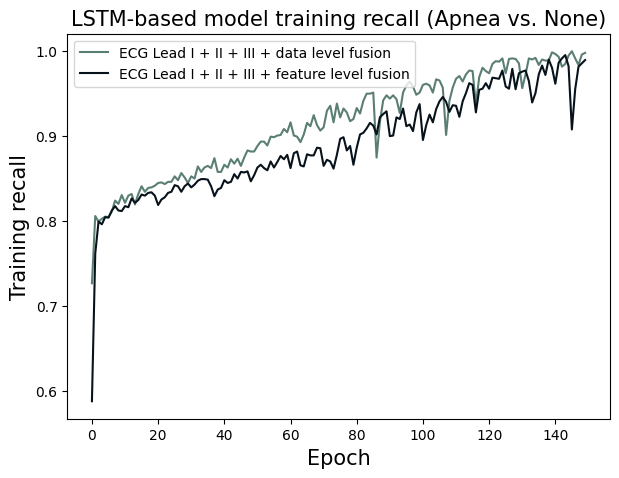

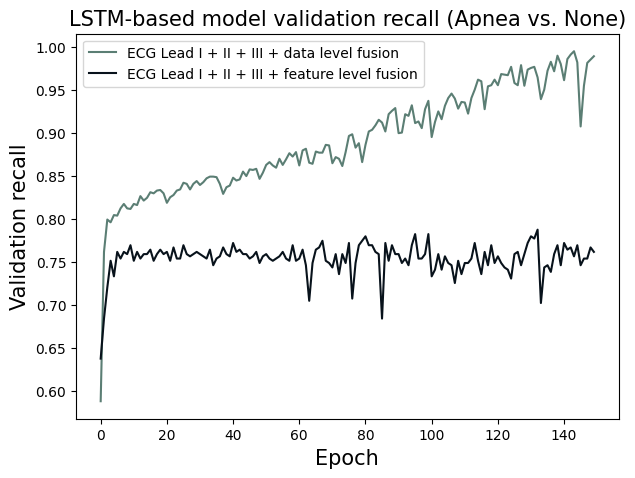

In [ ]:
recall_datalevelfusion = [0.7266233563423157, 0.8058441281318665, 0.7993506789207458, 0.8025974035263062, 0.8051947951316833, 0.8045454621315002, 0.8110389709472656, 0.8240259885787964, 0.8201298713684082, 0.8305194973945618, 0.8214285969734192, 0.8298701047897339, 0.831818163394928, 0.8194805383682251, 0.831818163394928, 0.8409090638160706, 0.8344155550003052, 0.8389610648155212, 0.8396103978157043, 0.8415584564208984, 0.8448051810264587, 0.8454545736312866, 0.8435065150260925, 0.8461039066314697, 0.8461039066314697, 0.8525974154472351, 0.8480519652366638, 0.8564935326576233, 0.8512986898422241, 0.8448051810264587, 0.8525974154472351, 0.8500000238418579, 0.8642857074737549, 0.8577921986579895, 0.8629870414733887, 0.864935040473938, 0.8623376488685608, 0.8740260004997253, 0.8577921986579895, 0.8577921986579895, 0.866233766078949, 0.8629870414733887, 0.8727272748947144, 0.86753249168396, 0.8733766078948975, 0.864935040473938, 0.8746753334999084, 0.8831169009208679, 0.8818181753158569, 0.8818181753158569, 0.8883116841316223, 0.8935064673423767, 0.8935064673423767, 0.8889610171318054, 0.899350643157959, 0.8987013101577759, 0.90064936876297, 0.9012987017631531, 0.9084415435791016, 0.9045454263687134, 0.9162337779998779, 0.90064936876297, 0.899350643157959, 0.8928571343421936, 0.9019480347633362, 0.9155844449996948, 0.9116883277893066, 0.9246753454208374, 0.9129869937896729, 0.9064934849739075, 0.9103896021842957, 0.9298701286315918, 0.9357143044471741, 0.9162337779998779, 0.9383116960525513, 0.9220778942108154, 0.932467520236969, 0.9279220700263977, 0.9175324440002441, 0.9201298952102661, 0.9331169128417969, 0.9266234040260315, 0.9415584206581116, 0.949999988079071, 0.949999988079071, 0.951298713684082, 0.8746753334999084, 0.916883111000061, 0.9422078132629395, 0.948051929473877, 0.9441558718681335, 0.948051929473877, 0.9435064792633057, 0.9272727370262146, 0.951298713684082, 0.9597402811050415, 0.9642857313156128, 0.9584415555000305, 0.9487013220787048, 0.951298713684082, 0.9603896141052246, 0.9616883397102356, 0.9597402811050415, 0.951298713684082, 0.96688312292099, 0.965584397315979, 0.9571428298950195, 0.9012987017631531, 0.9415584206581116, 0.9571428298950195, 0.9675324559211731, 0.9707792401313782, 0.9642857313156128, 0.9727272987365723, 0.9772727489471436, 0.9766233563423157, 0.9370129704475403, 0.9694805145263672, 0.9805194735527039, 0.9766233563423157, 0.9740259647369385, 0.9850649237632751, 0.9883117079734802, 0.9876623153686523, 0.9915584325790405, 0.9740259647369385, 0.9909090995788574, 0.9915584325790405, 0.9909090995788574, 0.9857142567634583, 0.9564934968948364, 0.9727272987365723, 0.9915584325790405, 0.9902597665786743, 0.9922077655792236, 0.9837662577629089, 0.9902597665786743, 0.9889610409736633, 0.9889610409736633, 0.998701274394989, 0.9967532753944397, 0.9935064911842346, 0.9818181991577148, 0.9850649237632751, 0.9948052167892456, 1.0, 0.9915584325790405, 0.9837662577629089, 0.9961038827896118, 0.9980519413948059]
recall_featurelevelfusion = [0.5876623392105103, 0.7616882920265198, 0.7993506789207458, 0.7961038947105408, 0.8045454621315002, 0.8038961291313171, 0.8123376369476318, 0.817532479763031, 0.8123376369476318, 0.8116883039474487, 0.817532479763031, 0.81623375415802, 0.8266233801841736, 0.8214285969734192, 0.8246753215789795, 0.8311688303947449, 0.8298701047897339, 0.833116888999939, 0.8337662220001221, 0.8298701047897339, 0.8188311457633972, 0.8253246545791626, 0.8279221057891846, 0.833116888999939, 0.8344155550003052, 0.8422077894210815, 0.8409090638160706, 0.8344155550003052, 0.8409090638160706, 0.8441558480262756, 0.8396103978157043, 0.8428571224212646, 0.8474025726318359, 0.84935063123703, 0.84935063123703, 0.8487012982368469, 0.8409090638160706, 0.8292207717895508, 0.8370130062103271, 0.8389610648155212, 0.8480519652366638, 0.8448051810264587, 0.8461039066314697, 0.8551948070526123, 0.8500000238418579, 0.8577921986579895, 0.8571428656578064, 0.8584415316581726, 0.8467532396316528, 0.8538960814476013, 0.8629870414733887, 0.866233766078949, 0.8623376488685608, 0.8597402572631836, 0.8701298832893372, 0.8629870414733887, 0.8694804906845093, 0.8766233921051025, 0.8727272748947144, 0.8779220581054688, 0.8623376488685608, 0.8798701167106628, 0.8818181753158569, 0.8655844330787659, 0.8642857074737549, 0.8785714507102966, 0.8772727251052856, 0.8772727251052856, 0.8863636255264282, 0.8857142925262451, 0.864935040473938, 0.8720779418945312, 0.8701298832893372, 0.8616883158683777, 0.8779220581054688, 0.8967532515525818, 0.8987013101577759, 0.8831169009208679, 0.8883116841316223, 0.866233766078949, 0.8863636255264282, 0.9019480347633362, 0.9038960933685303, 0.9090909361839294, 0.9155844449996948, 0.9123376607894897, 0.9019480347633362, 0.9220778942108154, 0.9259740114212036, 0.9292207956314087, 0.8999999761581421, 0.90064936876297, 0.9220778942108154, 0.9201298952102661, 0.932467520236969, 0.9116883277893066, 0.9136363863945007, 0.9058441519737244, 0.9279220700263977, 0.9376623630523682, 0.8954545259475708, 0.9129869937896729, 0.9253246784210205, 0.9162337779998779, 0.9318181872367859, 0.9409090876579285, 0.9461038708686829, 0.9402597546577454, 0.9285714030265808, 0.9363636374473572, 0.9357143044471741, 0.9227272868156433, 0.9409090876579285, 0.9506493210792542, 0.9623376727104187, 0.9603896141052246, 0.9279220700263977, 0.9545454382896423, 0.9558441638946533, 0.9623376727104187, 0.9558441638946533, 0.9688311815261841, 0.9681817889213562, 0.9675324559211731, 0.9772727489471436, 0.9584415555000305, 0.9558441638946533, 0.9792208075523376, 0.9551948308944702, 0.9740259647369385, 0.9759740233421326, 0.9772727489471436, 0.9649350643157959, 0.9396103620529175, 0.9506493210792542, 0.9727272987365723, 0.983116865158081, 0.9720779061317444, 0.9902597665786743, 0.9805194735527039, 0.9616883397102356, 0.9863636493682861, 0.9915584325790405, 0.9954545497894287, 0.982467532157898, 0.9077922105789185, 0.9551948308944702, 0.9818181991577148, 0.9857142567634583, 0.9896103739738464]

recall_val_datalevelfusion = [0.7694300413131714, 0.7694300413131714, 0.7642487287521362, 0.7642487287521362, 0.7512953281402588, 0.727979302406311, 0.7642487287521362, 0.772020697593689, 0.727979302406311, 0.7642487287521362, 0.7642487287521362, 0.772020697593689, 0.772020697593689, 0.7590673565864563, 0.7694300413131714, 0.7849740982055664, 0.7409326434135437, 0.7616580128669739, 0.7642487287521362, 0.7746114134788513, 0.7512953281402588, 0.7797927260398865, 0.7590673565864563, 0.7746114134788513, 0.7746114134788513, 0.7746114134788513, 0.7694300413131714, 0.7694300413131714, 0.7746114134788513, 0.7642487287521362, 0.7694300413131714, 0.7746114134788513, 0.7512953281402588, 0.7694300413131714, 0.7590673565864563, 0.7797927260398865, 0.7564767003059387, 0.7564767003059387, 0.7435232996940613, 0.7694300413131714, 0.7694300413131714, 0.772020697593689, 0.772020697593689, 0.7746114134788513, 0.772020697593689, 0.712435245513916, 0.7746114134788513, 0.7746114134788513, 0.7642487287521362, 0.7435232996940613, 0.7564767003059387, 0.7253885865211487, 0.7538859844207764, 0.727979302406311, 0.7331606149673462, 0.7409326434135437, 0.7357512712478638, 0.7357512712478638, 0.727979302406311, 0.7305699586868286, 0.7305699586868286, 0.727979302406311, 0.7564767003059387, 0.7590673565864563, 0.7357512712478638, 0.7409326434135437, 0.7616580128669739, 0.7305699586868286, 0.7512953281402588, 0.7668393850326538, 0.7538859844207764, 0.7357512712478638, 0.7435232996940613, 0.727979302406311, 0.7461140155792236, 0.7331606149673462, 0.7538859844207764, 0.7487046718597412, 0.727979302406311, 0.7383419871330261, 0.7176165580749512, 0.7202072739601135, 0.7616580128669739, 0.7227979302406311, 0.727979302406311, 0.727979302406311, 0.7383419871330261, 0.7331606149673462, 0.7357512712478638, 0.7305699586868286, 0.7383419871330261, 0.7409326434135437, 0.7590673565864563, 0.7305699586868286, 0.7305699586868286, 0.7331606149673462, 0.7487046718597412, 0.7227979302406311, 0.7435232996940613, 0.7305699586868286, 0.7409326434135437, 0.7409326434135437, 0.7383419871330261, 0.7305699586868286, 0.7512953281402588, 0.7305699586868286, 0.7409326434135437, 0.7409326434135437, 0.7305699586868286, 0.7253885865211487, 0.7046632170677185, 0.7487046718597412, 0.7461140155792236, 0.7357512712478638, 0.7357512712478638, 0.7098445892333984, 0.7383419871330261, 0.7512953281402588, 0.7409326434135437, 0.7383419871330261, 0.7564767003059387, 0.7383419871330261, 0.7435232996940613, 0.7512953281402588, 0.7512953281402588, 0.7357512712478638, 0.7512953281402588, 0.7694300413131714, 0.7590673565864563, 0.7305699586868286, 0.7409326434135437, 0.7538859844207764, 0.7564767003059387, 0.7668393850326538, 0.7642487287521362, 0.7538859844207764, 0.7668393850326538, 0.7616580128669739, 0.7435232996940613, 0.7616580128669739, 0.7564767003059387, 0.7331606149673462, 0.7331606149673462, 0.7357512712478638, 0.7590673565864563, 0.7538859844207764, 0.7461140155792236, 0.7616580128669739, 0.7642487287521362, 0.7642487287521362]
recall_val_featurelevelfusion = [0.6373056769371033, 0.6839378476142883, 0.7202072739601135, 0.7512953281402588, 0.7331606149673462, 0.7616580128669739, 0.7538859844207764, 0.7616580128669739, 0.7590673565864563, 0.7694300413131714, 0.7512953281402588, 0.7616580128669739, 0.7538859844207764, 0.7590673565864563, 0.7590673565864563, 0.7642487287521362, 0.7512953281402588, 0.7590673565864563, 0.7642487287521362, 0.7590673565864563, 0.7616580128669739, 0.7512953281402588, 0.7668393850326538, 0.7538859844207764, 0.7538859844207764, 0.7694300413131714, 0.7590673565864563, 0.7564767003059387, 0.7590673565864563, 0.7616580128669739, 0.7590673565864563, 0.7564767003059387, 0.7538859844207764, 0.7642487287521362, 0.7461140155792236, 0.7538859844207764, 0.7564767003059387, 0.7668393850326538, 0.7590673565864563, 0.7564767003059387, 0.772020697593689, 0.7616580128669739, 0.7642487287521362, 0.7590673565864563, 0.7590673565864563, 0.7538859844207764, 0.7564767003059387, 0.7616580128669739, 0.7487046718597412, 0.7564767003059387, 0.7590673565864563, 0.7538859844207764, 0.7512953281402588, 0.7538859844207764, 0.7564767003059387, 0.7616580128669739, 0.7538859844207764, 0.7512953281402588, 0.7694300413131714, 0.7512953281402588, 0.7538859844207764, 0.7642487287521362, 0.7461140155792236, 0.7046632170677185, 0.7487046718597412, 0.7642487287521362, 0.7668393850326538, 0.7746114134788513, 0.7512953281402588, 0.7487046718597412, 0.7435232996940613, 0.7590673565864563, 0.7357512712478638, 0.7590673565864563, 0.7487046718597412, 0.772020697593689, 0.7072538733482361, 0.7487046718597412, 0.7694300413131714, 0.7746114134788513, 0.7797927260398865, 0.7694300413131714, 0.7694300413131714, 0.7616580128669739, 0.7590673565864563, 0.6839378476142883, 0.772020697593689, 0.7512953281402588, 0.7694300413131714, 0.7590673565864563, 0.7590673565864563, 0.7487046718597412, 0.7538859844207764, 0.7461140155792236, 0.7694300413131714, 0.7823834419250488, 0.7538859844207764, 0.7538859844207764, 0.7590673565864563, 0.7823834419250488, 0.7331606149673462, 0.7409326434135437, 0.7590673565864563, 0.7409326434135437, 0.7564767003059387, 0.7487046718597412, 0.7461140155792236, 0.7253885865211487, 0.7512953281402588, 0.7357512712478638, 0.7487046718597412, 0.7487046718597412, 0.7538859844207764, 0.772020697593689, 0.7512953281402588, 0.7357512712478638, 0.7616580128669739, 0.7461140155792236, 0.7694300413131714, 0.7487046718597412, 0.7564767003059387, 0.7487046718597412, 0.7435232996940613, 0.7409326434135437, 0.7305699586868286, 0.7590673565864563, 0.7616580128669739, 0.7461140155792236, 0.7590673565864563, 0.772020697593689, 0.7797927260398865, 0.7772020697593689, 0.787564754486084, 0.7020725607872009, 0.7435232996940613, 0.7461140155792236, 0.7383419871330261, 0.7590673565864563, 0.7694300413131714, 0.7461140155792236, 0.772020697593689, 0.7642487287521362, 0.7668393850326538, 0.7564767003059387, 0.7694300413131714, 0.7461140155792236, 0.7538859844207764, 0.7538859844207764, 0.7668393850326538, 0.7616580128669739]

fs = 15
plt.figure(figsize=(7,5))
plt.plot(recall_datalevelfusion, color = (91/255, 126/255, 116/255))
plt.plot(recall_featurelevelfusion, color = (8/255, 18/255, 27/255))
plt.title('LSTM-based model training recall (Apnea vs. None)', fontsize=fs)
plt.ylabel('Training recall', fontsize=fs)
plt.xlabel('Epoch', fontsize=fs)
plt.legend(['ECG Lead I + II + III + data level fusion', 'ECG Lead I + II + III + feature level fusion'], loc = 'upper left')
plt.savefig('/content/drive/MyDrive/FYP/stageFusionTraining.pdf')
plt.show()

plt.figure(figsize=(7,5))
plt.plot(recall_featurelevelfusion, color = (91/255, 126/255, 116/255))
plt.plot(recall_val_featurelevelfusion, color = (8/255, 18/255, 27/255))
plt.title('LSTM-based model validation recall (Apnea vs. None)', fontsize=fs)
plt.ylabel('Validation recall', fontsize=fs)
plt.xlabel('Epoch', fontsize=fs)
plt.legend(['ECG Lead I + II + III + data level fusion', 'ECG Lead I + II + III + feature level fusion'], loc = 'upper left')
plt.savefig('/content/drive/MyDrive/FYP/stageFusionValidation.pdf')
plt.show()

In [ ]:
# apnea vs. none
recall1 = [0.5428500771522522, 0.5709653496742249, 0.5717862248420715, 0.5847151279449463, 0.6019126772880554, 0.6088081002235413, 0.6139796376228333, 0.6191922426223755, 0.6233376860618591, 0.624322772026062, 0.6248973608016968, 0.6273189783096313, 0.6292480826377869, 0.6300278902053833, 0.629494309425354, 0.6290428638458252, 0.6286324262619019, 0.632203221321106, 0.6338860392570496, 0.6342144012451172, 0.6335987448692322, 0.6357330679893494, 0.6324495077133179, 0.6343786120414734, 0.6326137185096741, 0.6370464563369751, 0.6373337507247925, 0.6377441883087158, 0.6396732926368713, 0.6363897323608398, 0.6363897323608398, 0.6379904747009277, 0.6384009122848511, 0.6386061310768127, 0.6373748183250427, 0.6398374438285828, 0.638031542301178, 0.640001654624939, 0.64320307970047, 0.6416023373603821, 0.6412740349769592, 0.6404531002044678, 0.6399195790290833, 0.6400837302207947, 0.6420538425445557, 0.6411918997764587, 0.6440650224685669, 0.6405762434005737, 0.6445986032485962, 0.6421359181404114, 0.6452552676200867, 0.6426284909248352, 0.6452963352203369, 0.6431620717048645, 0.6427105665206909, 0.6455426216125488, 0.646404504776001, 0.6437366604804993, 0.6423001289367676, 0.6460351347923279, 0.6462814211845398, 0.6445165276527405, 0.6476768851280212, 0.6460351347923279, 0.6440650224685669, 0.6473485231399536, 0.6432851552963257, 0.6481694579124451, 0.6469380855560303, 0.6487440466880798, 0.6489081978797913, 0.6489081978797913, 0.6508373022079468, 0.6491544842720032, 0.6491544842720032, 0.649523913860321, 0.6498522162437439, 0.647758960723877, 0.6535051465034485, 0.6520686149597168, 0.6500164270401001, 0.6530947089195251, 0.6537514328956604, 0.6526432633399963, 0.6544491648674011, 0.6544491648674011, 0.652725338935852, 0.6510835886001587, 0.6536282896995544, 0.6547775268554688, 0.6557215452194214, 0.656173050403595, 0.652848482131958, 0.6559678316116333, 0.6571170687675476, 0.65925133228302, 0.6570760011672974, 0.659866988658905, 0.6600311994552612, 0.6603595614433289]
recall2 = [0.5984238982200623, 0.6113117933273315, 0.6123378872871399, 0.6185765862464905, 0.6201362609863281, 0.6278525590896606, 0.627031683921814, 0.6316697001457214, 0.6325726509094238, 0.6340091824531555, 0.6368412375450134, 0.6375389695167542, 0.640494167804718, 0.6372106671333313, 0.6358151435852051, 0.6410688161849976, 0.6379494071006775, 0.643079936504364, 0.6409866809844971, 0.6437777280807495, 0.6395501494407654, 0.6429157853126526, 0.6440239548683167, 0.6428747177124023, 0.6422180533409119, 0.6447627544403076, 0.6418896913528442, 0.6447217464447021, 0.6426694989204407, 0.6458299160003662, 0.6476358771324158, 0.6428337097167969, 0.6463224291801453, 0.6486209034919739, 0.6483746767044067, 0.6487029790878296, 0.651494026184082, 0.6492365598678589, 0.6513708829879761, 0.6528074145317078, 0.6497701406478882, 0.6528074145317078, 0.6526432633399963, 0.6488261222839355, 0.6525201201438904, 0.6499343514442444, 0.6502216458320618, 0.654941737651825, 0.652848482131958, 0.6537103652954102, 0.6555163264274597, 0.654818594455719, 0.6565424203872681, 0.655434250831604, 0.6582252383232117, 0.654818594455719, 0.652232825756073, 0.6587177515029907, 0.6556805372238159, 0.6579790115356445, 0.6576916575431824, 0.6562140583992004, 0.6583073139190674, 0.6601953506469727, 0.6583894491195679, 0.6588819622993469, 0.6604416370391846, 0.6629042625427246, 0.6603595614433289, 0.6611393690109253, 0.6583483815193176, 0.6601953506469727, 0.6629042625427246, 0.6602774858474731, 0.6629863977432251, 0.6617140173912048, 0.6615498065948486, 0.6667624115943909, 0.6631916165351868, 0.6620833873748779, 0.6632326245307922, 0.6678295731544495, 0.6662288904190063, 0.6626990437507629, 0.6670907735824585, 0.6663519740104675, 0.6672959923744202, 0.6688556671142578, 0.6678706407546997, 0.6667624115943909, 0.6702922582626343, 0.6666393280029297, 0.6708257794380188, 0.671113133430481, 0.6681168675422668, 0.6700049042701721, 0.669758677482605, 0.671482503414154, 0.6675012111663818, 0.6723033785820007]
recall3 = [0.5923493504524231, 0.606304407119751, 0.608890175819397, 0.6100804209709167, 0.6160728931427002, 0.6159087419509888, 0.6186176538467407, 0.6226810216903687, 0.6253899335861206, 0.6263749599456787, 0.6272779703140259, 0.6299458146095276, 0.6307666897773743, 0.6285502910614014, 0.6312181949615479, 0.6309309005737305, 0.6336398124694824, 0.6350352764129639, 0.6364718675613403, 0.6352404952049255, 0.6372516751289368, 0.6361024379730225, 0.6377441883087158, 0.6349121928215027, 0.6390165686607361, 0.6381546258926392, 0.6345427632331848, 0.6358972191810608, 0.6369233131408691, 0.6377441883087158, 0.6414792537689209, 0.6405762434005737, 0.6409456729888916, 0.639878511428833, 0.6419306993484497, 0.6420949101448059, 0.6408225297927856, 0.6412740349769592, 0.643079936504364, 0.6420949101448059, 0.6415202617645264, 0.6428337097167969, 0.6457067728042603, 0.6453374028205872, 0.6439418792724609, 0.6450090408325195, 0.6475537419319153, 0.6471022963523865, 0.6461582779884338, 0.6475537419319153, 0.6484567523002625, 0.6493597030639648, 0.6471433043479919, 0.6496469974517822, 0.6498112082481384, 0.6488261222839355, 0.6492365598678589, 0.6513298153877258, 0.6509604454040527, 0.6514529585838318, 0.6513298153877258, 0.652848482131958, 0.6523969769477844, 0.6536282896995544, 0.6523149013519287, 0.6510425209999084, 0.6543670892715454, 0.6576506495475769, 0.653587281703949, 0.6552290320396423, 0.65555739402771, 0.6540387272834778, 0.6573632955551147, 0.6584304571151733, 0.658635675907135, 0.6590871810913086, 0.6582252383232117, 0.6611804366111755, 0.659990131855011, 0.6626990437507629, 0.6610162258148193, 0.6594976186752319, 0.6601953506469727, 0.6611804366111755, 0.6647102236747742, 0.6627401113510132, 0.6622886061668396, 0.6641766428947449, 0.6649154424667358, 0.6651617288589478, 0.6638482809066772, 0.6667624115943909, 0.6648744344711304, 0.6649975180625916, 0.6694713234901428, 0.6703332662582397, 0.67160564661026, 0.669019877910614, 0.6693071722984314, 0.6704153418540955]
recall4 = [0.5536857843399048, 0.5747414231300354, 0.575685441493988, 0.5858233571052551, 0.5937038064002991, 0.5974798798561096, 0.6032671332359314, 0.6017074584960938, 0.6029797792434692, 0.6000656485557556, 0.6042521595954895, 0.6022820472717285, 0.6027335524559021, 0.6044163703918457, 0.6033492088317871, 0.6017074584960938, 0.6047036647796631, 0.6031849980354309, 0.607535719871521, 0.6058118343353271, 0.604949951171875, 0.6070842146873474, 0.6079871654510498, 0.6040469408035278, 0.60679692029953, 0.6072894334793091, 0.6058118343353271, 0.606181263923645, 0.608274519443512, 0.6095879077911377, 0.6062222719192505, 0.6104498505592346, 0.6106961369514465, 0.608890175819397, 0.6082334518432617, 0.610244631767273, 0.610860288143158, 0.6098752021789551, 0.6108192205429077, 0.6110244393348694, 0.6127483248710632, 0.6129124760627747, 0.6113117933273315, 0.611968457698822, 0.6142669320106506, 0.6119274497032166, 0.6127483248710632, 0.6138564944267273, 0.6154983043670654, 0.6145132184028625, 0.6136923432350159, 0.6156624555587769, 0.6146363615989685, 0.6162370443344116, 0.6168116927146912, 0.6154161691665649, 0.6183713674545288, 0.6194385290145874, 0.6194385290145874, 0.6187407374382019, 0.6161960363388062, 0.6195206046104431, 0.6196026802062988, 0.6168116927146912, 0.6196026802062988, 0.6194795370101929, 0.620505690574646, 0.6224347352981567, 0.6237891912460327, 0.6212034225463867, 0.6239534020423889, 0.6216549277305603, 0.6237891912460327, 0.6240764856338501, 0.622352659702301, 0.6234608292579651, 0.623091459274292, 0.6248973608016968, 0.6195616722106934, 0.6234608292579651, 0.6269496083259583, 0.6258824467658997, 0.6291660070419312, 0.6248973608016968, 0.6274010539054871, 0.628139853477478, 0.6291660070419312, 0.6270727515220642, 0.6277704834938049, 0.6304793953895569, 0.6300689578056335, 0.6306025385856628, 0.6308077573776245, 0.6314644813537598, 0.6348300576210022, 0.6324905753135681, 0.6289607882499695, 0.6311361193656921, 0.6330241560935974, 0.6368001699447632]
recall5 = [0.6441881656646729, 0.6792398691177368, 0.6899523735046387, 0.6991052627563477, 0.702593982219696, 0.7059596180915833, 0.7103102803230286, 0.7132244110107422, 0.7161385416984558, 0.7190937399864197, 0.7217205762863159, 0.7250451445579529, 0.7269331812858582, 0.7266868948936462, 0.7322689294815063, 0.7321457862854004, 0.735798716545105, 0.7355524301528931, 0.7373994588851929, 0.7402315139770508, 0.747291088104248, 0.7470448017120361, 0.748645544052124, 0.7528730630874634, 0.753817081451416, 0.7543917298316956, 0.7595632672309875, 0.7634214162826538, 0.7652273774147034, 0.7665818333625793, 0.7716302871704102, 0.7737645506858826, 0.7739287614822388, 0.779880166053772, 0.779880166053772, 0.7859547138214111, 0.7866934537887573, 0.7889098525047302, 0.7926448583602905, 0.7957642674446106, 0.7976112365722656, 0.8028649091720581, 0.8032753467559814, 0.8090625405311584, 0.8078722953796387, 0.8134132623672485, 0.8179280757904053, 0.8190363049507141, 0.8178049325942993, 0.8241257667541504, 0.8241257667541504, 0.827655553817749, 0.8336480259895325, 0.8363569378852844, 0.8333196640014648, 0.838039755821228, 0.8415284752845764, 0.8416105508804321, 0.8450172543525696, 0.8473978042602539, 0.8480545282363892, 0.8517074584960938, 0.8469873666763306, 0.8528566956520081, 0.8547447323799133, 0.8564274907112122, 0.8618863821029663, 0.860121488571167, 0.8657035231590271, 0.8653340935707092, 0.8671400547027588, 0.8689459562301636, 0.8728862404823303, 0.8714086413383484, 0.8760876655578613, 0.8777704834938049, 0.8804793953895569, 0.8841323256492615, 0.8825726509094238, 0.8835166692733765, 0.8849532008171082, 0.8855688571929932, 0.8912740349769592, 0.890617311000824, 0.8933672904968262, 0.8920538425445557, 0.8953784108161926, 0.8990313410758972, 0.9010425209999084, 0.9010835886001587, 0.9031357765197754, 0.9037925004959106, 0.9054753184318542, 0.9076506495475769, 0.9114677309989929, 0.9114267230033875, 0.9117140173912048, 0.9122475981712341, 0.9134378433227539, 0.9162698984146118]
recall6 = [0.7279220819473267, 0.801948070526123, 0.817532479763031, 0.8246753215789795, 0.8077921867370605, 0.8253246545791626, 0.833116888999939, 0.8220779299736023, 0.8298701047897339, 0.8350649476051331, 0.8383116722106934, 0.833116888999939, 0.8357142806053162, 0.8428571224212646, 0.8415584564208984, 0.8422077894210815, 0.8480519652366638, 0.8636363744735718, 0.8564935326576233, 0.8564935326576233, 0.8558441400527954, 0.8629870414733887, 0.8694804906845093, 0.8707792162895203, 0.866233766078949, 0.883766233921051, 0.8772727251052856, 0.883766233921051, 0.8792207837104797, 0.8896104097366333, 0.864935040473938, 0.8915584683418274, 0.9019480347633362, 0.9032467603683472, 0.9051948189735413, 0.8980519771575928, 0.9097402691841125, 0.9097402691841125, 0.9240259528160095, 0.9376623630523682, 0.9331169128417969, 0.9266234040260315, 0.9292207956314087, 0.9461038708686829, 0.951298713684082, 0.9259740114212036, 0.9409090876579285, 0.9564934968948364, 0.9636363387107849, 0.9720779061317444, 0.9688311815261841, 0.9551948308944702, 0.9733766317367554, 0.982467532157898, 0.9675324559211731, 0.9798701405525208, 0.9753246903419495, 0.9383116960525513, 0.9461038708686829, 0.984415590763092, 0.9915584325790405, 0.9870129823684692, 0.9961038827896118, 0.9902597665786743, 0.9889610409736633, 0.9649350643157959, 0.9805194735527039, 0.9948052167892456, 0.9922077655792236, 0.9837662577629089, 0.9993506669998169, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]

recall1_val = [0.5594221949577332, 0.5605712532997131, 0.5650032758712769, 0.5942219495773315, 0.589789867401123, 0.6006237864494324, 0.6040709018707275, 0.612278401851654, 0.6088312268257141, 0.6127708554267883, 0.6157255172729492, 0.6158896684646606, 0.6112934947013855, 0.6157255172729492, 0.6180236339569092, 0.6191726922988892, 0.6130991578102112, 0.6167104244232178, 0.6167104244232178, 0.6199934482574463, 0.6147406697273254, 0.6237688660621643, 0.6247537732124329, 0.6204859018325806, 0.6152330636978149, 0.6213066577911377, 0.6135916113853455, 0.6217990517616272, 0.62327641248703, 0.62212735414505, 0.6262311339378357, 0.6208142042160034, 0.62327641248703, 0.6193368434906006, 0.6217990517616272, 0.6188443899154663, 0.6213066577911377, 0.6216349601745605, 0.6224556565284729, 0.6250820755958557, 0.6231122612953186, 0.6173670291900635, 0.6163821220397949, 0.6240971684455872, 0.6191726922988892, 0.6240971684455872, 0.62327641248703, 0.6216349601745605, 0.6234405636787415, 0.620650053024292, 0.6214708089828491, 0.619500994682312, 0.6162179708480835, 0.62442547082901, 0.6285291910171509, 0.6265594363212585, 0.6222915053367615, 0.6237688660621643, 0.6239330172538757, 0.6237688660621643, 0.6178594827651978, 0.6188443899154663, 0.6178594827651978, 0.6308273077011108, 0.62442547082901, 0.6236047148704529, 0.6236047148704529, 0.6257386803627014, 0.6191726922988892, 0.6226198077201843, 0.6265594363212585, 0.6272160410881042, 0.6239330172538757, 0.62787264585495, 0.6321405172348022, 0.6347669363021851, 0.6301707029342651, 0.6301707029342651, 0.6290216445922852, 0.6308273077011108, 0.6227839589118958, 0.6275443434715271, 0.6260669827461243, 0.6236047148704529, 0.6213066577911377, 0.6275443434715271, 0.6263952851295471, 0.6268877387046814, 0.6273801922798157, 0.6291857957839966, 0.6337820291519165, 0.619500994682312, 0.6298424005508423, 0.62672358751297, 0.6355876326560974, 0.6367366909980774, 0.6303348541259766, 0.6301707029342651, 0.6301707029342651, 0.631648063659668]
recall2_val = [0.6048916578292847, 0.603085994720459, 0.5983256697654724, 0.603085994720459, 0.6106368899345398, 0.6178594827651978, 0.629349946975708, 0.62442547082901, 0.6324688196182251, 0.635423481464386, 0.6337820291519165, 0.6236047148704529, 0.6301707029342651, 0.6391989588737488, 0.6373932957649231, 0.6416611671447754, 0.6380499005317688, 0.6400197148323059, 0.6347669363021851, 0.6341103315353394, 0.6413329243659973, 0.6380499005317688, 0.6410046219825745, 0.6370649933815002, 0.6393631100654602, 0.6416611671447754, 0.6385423541069031, 0.6433026790618896, 0.6378857493400574, 0.6418253183364868, 0.6451083421707153, 0.6472423076629639, 0.6464215517044067, 0.6416611671447754, 0.6423177719116211, 0.6454366445541382, 0.6416611671447754, 0.6460932493209839, 0.6424819231033325, 0.6406763195991516, 0.6433026790618896, 0.6549572944641113, 0.644615888595581, 0.6478989124298096, 0.6477347612380981, 0.6405121684074402, 0.6451083421707153, 0.6505252718925476, 0.6462574005126953, 0.6523309350013733, 0.6434668302536011, 0.6477347612380981, 0.6492120623588562, 0.6538082957267761, 0.646914005279541, 0.6451083421707153, 0.6470781564712524, 0.6513460278511047, 0.6515101790428162, 0.6444517374038696, 0.6498686671257019, 0.6526592373847961, 0.6500328183174133, 0.6487196087837219, 0.6477347612380981, 0.6465857028961182, 0.646914005279541, 0.6480630040168762, 0.650689423084259, 0.637721598148346, 0.6474064588546753, 0.6536441445350647, 0.6436309814453125, 0.6465857028961182, 0.6474064588546753, 0.6465857028961182, 0.6503611207008362, 0.6539724469184875, 0.6511818766593933, 0.6564346551895142, 0.6587327718734741, 0.654136598110199, 0.6520026326179504, 0.6482271552085876, 0.6488837599754333, 0.6508535742759705, 0.6462574005126953, 0.6528233885765076, 0.6488837599754333, 0.6546289920806885, 0.6516743302345276, 0.6485554575920105, 0.6493762135505676, 0.6577478647232056, 0.6474064588546753, 0.6521667838096619, 0.6515101790428162, 0.645764946937561, 0.6500328183174133, 0.6493762135505676]
recall3_val = [0.5978332161903381, 0.5986539721488953, 0.6024293899536133, 0.6016086935997009, 0.6119500994682312, 0.614576518535614, 0.6149048209190369, 0.6093236804008484, 0.6158896684646606, 0.6158896684646606, 0.6234405636787415, 0.6198292970657349, 0.6193368434906006, 0.6270518898963928, 0.6208142042160034, 0.6213066577911377, 0.6240971684455872, 0.6257386803627014, 0.6321405172348022, 0.6260669827461243, 0.6273801922798157, 0.62442547082901, 0.6254103779792786, 0.6321405172348022, 0.6301707029342651, 0.6229481101036072, 0.6237688660621643, 0.6239330172538757, 0.6252462267875671, 0.6275443434715271, 0.6347669363021851, 0.6359159350395203, 0.629349946975708, 0.6357517838478088, 0.6362442374229431, 0.6352593302726746, 0.629349946975708, 0.6347669363021851, 0.6311556100845337, 0.6370649933815002, 0.6370649933815002, 0.6318122148513794, 0.6318122148513794, 0.6364083886146545, 0.6373932957649231, 0.6390348076820374, 0.6396914124488831, 0.6291857957839966, 0.6350951790809631, 0.6373932957649231, 0.6393631100654602, 0.6378857493400574, 0.6380499005317688, 0.6373932957649231, 0.6400197148323059, 0.6383782029151917, 0.641497015953064, 0.6393631100654602, 0.6396914124488831, 0.6405121684074402, 0.6406763195991516, 0.6434668302536011, 0.6380499005317688, 0.640840470790863, 0.6428102254867554, 0.6406763195991516, 0.6442875862121582, 0.6390348076820374, 0.6419894695281982, 0.6405121684074402, 0.6424819231033325, 0.6419894695281982, 0.6410046219825745, 0.6483913064002991, 0.6444517374038696, 0.6444517374038696, 0.6449441909790039, 0.6436309814453125, 0.6475706100463867, 0.6378857493400574, 0.6462574005126953, 0.6406763195991516, 0.6464215517044067, 0.6418253183364868, 0.6400197148323059, 0.6439592838287354, 0.641497015953064, 0.6492120623588562, 0.6462574005126953, 0.6421536207199097, 0.6413329243659973, 0.6482271552085876, 0.6521667838096619, 0.6490479111671448, 0.650689423084259, 0.6524950861930847, 0.6505252718925476, 0.6539724469184875, 0.6395272612571716, 0.6501969695091248]
recall4_val = [0.5789560079574585, 0.5802692174911499, 0.5832238793373108, 0.5929087400436401, 0.5840446352958679, 0.594386100769043, 0.5965200066566467, 0.5934011936187744, 0.5961917042732239, 0.595863401889801, 0.5901181697845459, 0.5979973673820496, 0.5927445888519287, 0.5975049138069153, 0.5940577983856201, 0.5914313793182373, 0.5975049138069153, 0.592087984085083, 0.5952068567276001, 0.5956992506980896, 0.5935653448104858, 0.5955350995063782, 0.5961917042732239, 0.5961917042732239, 0.5963558554649353, 0.5978332161903381, 0.5984898209571838, 0.5973407626152039, 0.5961917042732239, 0.5961917042732239, 0.5955350995063782, 0.5971766114234924, 0.5953710079193115, 0.5979973673820496, 0.5975049138069153, 0.5965200066566467, 0.5978332161903381, 0.6006237864494324, 0.5929087400436401, 0.5930728912353516, 0.5976690649986267, 0.5968483090400696, 0.5984898209571838, 0.5978332161903381, 0.5978332161903381, 0.5979973673820496, 0.5966841578483582, 0.5956992506980896, 0.5999671816825867, 0.5988181233406067, 0.597012460231781, 0.6066973209381104, 0.5984898209571838, 0.5915955305099487, 0.6063690185546875, 0.5975049138069153, 0.6025935411453247, 0.6050558090209961, 0.5953710079193115, 0.5965200066566467, 0.5956992506980896, 0.593237042427063, 0.5988181233406067, 0.6021010875701904, 0.5966841578483582, 0.6039067506790161, 0.600459635257721, 0.5927445888519287, 0.5968483090400696, 0.5988181233406067, 0.5912672281265259, 0.5968483090400696, 0.595863401889801, 0.599310576915741, 0.5915955305099487, 0.6006237864494324, 0.6025935411453247, 0.5991464257240295, 0.6019369959831238, 0.598161518573761, 0.6021010875701904, 0.6002954840660095, 0.5965200066566467, 0.6001313328742981, 0.6006237864494324, 0.5950427055358887, 0.5996388792991638, 0.6055482625961304, 0.6116217970848083, 0.6006237864494324, 0.6114576458930969, 0.6068614721298218, 0.6027576923370361, 0.6168745756149292, 0.6083388328552246, 0.607353925704956, 0.6045633554458618, 0.612278401851654, 0.6098161339759827, 0.6109651923179626]
recall5_val = [0.6615232825279236, 0.6764609217643738, 0.692547619342804, 0.6955022811889648, 0.7017399668693542, 0.7091267108917236, 0.7023965716362, 0.7117531299591064, 0.7132304906845093, 0.7155285477638245, 0.7112606763839722, 0.7112606763839722, 0.7087984085083008, 0.7178266644477844, 0.7193040251731873, 0.7189757227897644, 0.7263624668121338, 0.7194681763648987, 0.718811571598053, 0.7303020358085632, 0.727511465549469, 0.7303020358085632, 0.7332567572593689, 0.7330926060676575, 0.7319435477256775, 0.7431057095527649, 0.7383453845977783, 0.7421208024024963, 0.7485226392745972, 0.7485226392745972, 0.7437623143196106, 0.7472094297409058, 0.753775417804718, 0.7541037201881409, 0.75114905834198, 0.7606697082519531, 0.75, 0.7557452321052551, 0.7690413594245911, 0.7647734880447388, 0.7665790915489197, 0.762147068977356, 0.7756073474884033, 0.7618187665939331, 0.7849639058113098, 0.771339476108551, 0.7757714986801147, 0.7803676724433899, 0.7815167307853699, 0.7847997546195984, 0.7838148474693298, 0.7813525795936584, 0.7874261140823364, 0.7920223474502563, 0.7905449867248535, 0.7910374402999878, 0.7916940450668335, 0.7939921021461487, 0.7989166378974915, 0.7887393236160278, 0.7948128581047058, 0.8023637533187866, 0.7997373342514038, 0.7984241843223572, 0.7928430438041687, 0.8005580902099609, 0.8056467771530151, 0.8044977188110352, 0.8071240782737732, 0.7992449402809143, 0.8043335676193237, 0.8021996021270752, 0.8049901723861694, 0.8051543235778809, 0.7966185212135315, 0.8079448342323303, 0.8182862997055054, 0.8090938925743103, 0.815824031829834, 0.8113920092582703, 0.8174655437469482, 0.8192711472511292, 0.8112278580665588, 0.8232107758522034, 0.8123769164085388, 0.8237032294273376, 0.8210768103599548, 0.8200919032096863, 0.8187787532806396, 0.8225541710853577, 0.8228824734687805, 0.8225541710853577, 0.8322389721870422, 0.8342087864875793, 0.8232107758522034, 0.8287918567657471, 0.8320748805999756, 0.8258371353149414, 0.8356861472129822, 0.8338804841041565]
recall6_val = [0.7461140155792236, 0.7616580128669739, 0.7538859844207764, 0.7098445892333984, 0.7642487287521362, 0.7668393850326538, 0.7772020697593689, 0.7694300413131714, 0.772020697593689, 0.7823834419250488, 0.7797927260398865, 0.7901554107666016, 0.7797927260398865, 0.7823834419250488, 0.772020697593689, 0.7849740982055664, 0.7538859844207764, 0.727979302406311, 0.7668393850326538, 0.7746114134788513, 0.7668393850326538, 0.772020697593689, 0.7953367829322815, 0.7694300413131714, 0.7772020697593689, 0.7564767003059387, 0.7538859844207764, 0.7357512712478638, 0.7512953281402588, 0.7305699586868286, 0.7461140155792236, 0.7331606149673462, 0.7461140155792236, 0.7331606149673462, 0.7461140155792236, 0.7461140155792236, 0.7227979302406311, 0.7538859844207764, 0.7487046718597412, 0.7357512712478638, 0.7409326434135437, 0.7305699586868286, 0.7253885865211487, 0.7357512712478638, 0.7227979302406311, 0.7331606149673462, 0.7331606149673462, 0.7253885865211487, 0.7512953281402588, 0.7176165580749512, 0.7642487287521362, 0.7564767003059387, 0.7409326434135437, 0.7072538733482361, 0.7538859844207764, 0.7487046718597412, 0.7487046718597412, 0.7616580128669739, 0.7461140155792236, 0.727979302406311, 0.772020697593689, 0.7512953281402588, 0.7590673565864563, 0.7487046718597412, 0.7512953281402588, 0.7331606149673462, 0.7383419871330261, 0.7305699586868286, 0.772020697593689, 0.7409326434135437, 0.7331606149673462, 0.7331606149673462, 0.7357512712478638, 0.7357512712478638, 0.7331606149673462, 0.7383419871330261, 0.7357512712478638, 0.7383419871330261, 0.7383419871330261, 0.7409326434135437, 0.7409326434135437, 0.7383419871330261, 0.7383419871330261, 0.7383419871330261, 0.7383419871330261, 0.7383419871330261, 0.7383419871330261, 0.7383419871330261, 0.7383419871330261, 0.7409326434135437, 0.7357512712478638, 0.7383419871330261, 0.7357512712478638, 0.7357512712478638, 0.7357512712478638, 0.7357512712478638, 0.7357512712478638, 0.7357512712478638, 0.7357512712478638, 0.7357512712478638, 0.7357512712478638, 0.7357512712478638, 0.7357512712478638, 0.7357512712478638, 0.7357512712478638, 0.7357512712478638, 0.7357512712478638, 0.7357512712478638, 0.7357512712478638, 0.7357512712478638, 0.7357512712478638, 0.7357512712478638, 0.7357512712478638, 0.7357512712478638, 0.7357512712478638, 0.7383419871330261, 0.7383419871330261, 0.7383419871330261, 0.7383419871330261, 0.7383419871330261, 0.7383419871330261, 0.7383419871330261, 0.7383419871330261, 0.7383419871330261, 0.7383419871330261, 0.7383419871330261, 0.7383419871330261, 0.7383419871330261, 0.7383419871330261, 0.7383419871330261, 0.7383419871330261, 0.7383419871330261, 0.7383419871330261, 0.7383419871330261, 0.7383419871330261, 0.7383419871330261, 0.7383419871330261, 0.7383419871330261, 0.7383419871330261, 0.7383419871330261, 0.7383419871330261, 0.7383419871330261, 0.7383419871330261, 0.7383419871330261, 0.7383419871330261, 0.7383419871330261, 0.7383419871330261, 0.7383419871330261, 0.7383419871330261, 0.7383419871330261]

# apnea vs. hypopnea vs. none
recall11 = [0.02835545688867569, 0.05228613689541817, 0.06179941073060036, 0.07492625713348389, 0.08606194704771042, 0.08967551589012146, 0.09487462788820267, 0.11467551440000534, 0.12503688037395477, 0.13897491991519928, 0.14531710743904114, 0.14457964897155762, 0.1469026505947113, 0.14878319203853607, 0.14867256581783295, 0.1508849561214447, 0.15176990628242493, 0.14819321036338806, 0.15158554911613464, 0.15003687143325806, 0.1570059061050415, 0.15062683820724487, 0.15494100749492645, 0.15121681988239288, 0.1515118032693863, 0.15066371858119965, 0.15553097426891327, 0.1536504477262497, 0.15387168526649475, 0.1553466022014618, 0.15648967027664185, 0.15143805742263794, 0.15405604243278503, 0.15612094104290009, 0.15438790619373322, 0.15678465366363525, 0.15619468688964844, 0.15785397589206696, 0.15512536466121674, 0.15859144926071167, 0.1587020605802536, 0.15612094104290009, 0.15936578810214996, 0.15966077148914337, 0.16120943427085876, 0.16257373988628387, 0.15892329812049866, 0.16043511033058167, 0.1594763994216919, 0.16349557042121887, 0.16165192425251007, 0.16246312856674194, 0.16412241756916046, 0.1671460121870041, 0.1668141633272171, 0.16854719817638397, 0.16736724972724915, 0.16692477464675903, 0.16902655363082886, 0.1678834855556488, 0.17031711339950562, 0.1717182844877243, 0.17345133423805237, 0.17643804848194122, 0.17820796370506287, 0.17883481085300446, 0.17865043878555298, 0.1820058971643448, 0.18056784570217133, 0.1832227110862732, 0.18558259308338165, 0.18753688037395477, 0.1867256611585617, 0.18569321930408478, 0.19004425406455994, 0.19247788190841675, 0.1908554583787918, 0.19306784868240356, 0.19358406960964203, 0.1928466111421585, 0.19804571568965912, 0.1913348138332367, 0.19863569736480713, 0.1959439516067505, 0.20084808766841888, 0.1979351043701172, 0.19494837522506714, 0.19874630868434906, 0.19918878376483917, 0.20117993652820587, 0.19690264761447906, 0.20442478358745575, 0.20567846298217773, 0.20800147950649261, 0.2091076672077179, 0.2072640061378479, 0.20855456590652466, 0.20689527690410614, 0.21150442957878113, 0.2116887867450714, 0.21098819375038147, 0.21342182159423828, 0.2155236005783081, 0.21596607565879822, 0.21758849918842316, 0.2195059061050415, 0.2192109078168869, 0.22205014526844025, 0.22153392434120178, 0.22393067181110382, 0.22190265357494354, 0.22352507710456848, 0.2282448410987854, 0.2274705022573471, 0.23182153701782227, 0.2303834855556488, 0.23455014824867249, 0.23112094402313232, 0.2342182844877243, 0.24070796370506287, 0.23831121623516083, 0.23893804848194122, 0.24428465962409973, 0.23875369131565094, 0.24542772769927979, 0.24037609994411469, 0.24240413308143616, 0.2415560483932495, 0.24896755814552307, 0.25224927067756653, 0.2509218156337738, 0.2537979483604431, 0.25741150975227356, 0.25542035698890686, 0.25696903467178345, 0.25468289852142334, 0.2663716673851013, 0.26526549458503723, 0.26216813921928406, 0.26231563091278076, 0.2699483633041382, 0.27120205760002136, 0.2696165144443512, 0.2735988199710846, 0.2721976339817047, 0.27581119537353516, 0.2746312618255615, 0.2784660756587982, 0.2823008894920349, 0.28329646587371826]
recall22 = [0.10663716495037079, 0.15092182159423828, 0.15943953394889832, 0.16674041748046875, 0.16921091079711914, 0.1729350984096527, 0.17227138578891754, 0.1726401150226593, 0.17455752193927765, 0.1766224205493927, 0.17673303186893463, 0.1790929138660431, 0.17603245377540588, 0.1803097277879715, 0.18362832069396973, 0.1848820000886917, 0.18576696515083313, 0.1887168139219284, 0.18934366106987, 0.1929941028356552, 0.19336283206939697, 0.19539085030555725, 0.1953171044588089, 0.19627581536769867, 0.20011061429977417, 0.19734513759613037, 0.19970501959323883, 0.20058996975421906, 0.1997418850660324, 0.1960914433002472, 0.19918878376483917, 0.2025073766708374, 0.20088495314121246, 0.2020649015903473, 0.20778024196624756, 0.20748524367809296, 0.20943953096866608, 0.21025073528289795, 0.20980826020240784, 0.20966076850891113, 0.21397492289543152, 0.21504424512386322, 0.21755161881446838, 0.21622419357299805, 0.21939527988433838, 0.21854719519615173, 0.21563421189785004, 0.2193584144115448, 0.2245575189590454, 0.22407817840576172, 0.22769173979759216, 0.2238200604915619, 0.22890855371952057, 0.22588495910167694, 0.2271755188703537, 0.2282448410987854, 0.23097345232963562, 0.23030973970890045, 0.23078908026218414, 0.23167404532432556, 0.2342182844877243, 0.2322271317243576, 0.2359144538640976, 0.23248524963855743, 0.23665191233158112, 0.23716814815998077, 0.24277286231517792, 0.23525074124336243, 0.2406710982322693, 0.2391224205493927, 0.24170354008674622, 0.24502211809158325, 0.23753687739372253, 0.24583333730697632, 0.24668142199516296, 0.250331848859787, 0.25143805146217346, 0.2467920333147049, 0.25070059299468994, 0.24760323762893677, 0.2562315762042999, 0.2553834915161133, 0.25896018743515015, 0.2557890713214874, 0.26323747634887695, 0.259181410074234, 0.2639749348163605, 0.2627581059932709, 0.2637536823749542, 0.26832595467567444, 0.26814159750938416, 0.27123895287513733, 0.2718657851219177, 0.273893803358078, 0.2755531072616577, 0.2759955823421478, 0.2795354127883911, 0.28145280480384827, 0.2848820090293884, 0.28407078981399536, 0.28576695919036865, 0.28989675641059875, 0.2884587049484253, 0.2911873161792755, 0.29328909516334534, 0.3007374703884125, 0.29955753684043884, 0.30412977933883667, 0.30494099855422974, 0.3063421845436096, 0.3052728474140167, 0.30737462639808655, 0.31028762459754944, 0.3148230016231537, 0.30980825424194336, 0.31367993354797363, 0.31434366106987, 0.31854718923568726, 0.32470500469207764, 0.3226032555103302, 0.3241519033908844, 0.3232300877571106, 0.32883480191230774, 0.3284291923046112, 0.3320796489715576, 0.33171090483665466, 0.3356563448905945, 0.33724188804626465, 0.3411135673522949, 0.33632007241249084, 0.34277287125587463, 0.343768447637558, 0.3490781784057617, 0.3471238911151886, 0.35346606373786926, 0.35578909516334534, 0.35457226634025574, 0.356637179851532, 0.35637906193733215, 0.3607300817966461, 0.3668878972530365, 0.3647123873233795, 0.3613569438457489, 0.37079647183418274, 0.37157079577445984, 0.3713495433330536, 0.377175509929657, 0.37876105308532715, 0.38056784868240356, 0.3827802240848541]
recall33 = [0.03797934949398041, 0.059845130890607834, 0.085471972823143, 0.09631268680095673, 0.1023230105638504, 0.10648967325687408, 0.10696902871131897, 0.11231563240289688, 0.11648230254650116, 0.11721976101398468, 0.11972714215517044, 0.12157079577445984, 0.12551622092723846, 0.12831857800483704, 0.13148967921733856, 0.13075220584869385, 0.13075220584869385, 0.1367994099855423, 0.13351769745349884, 0.13436578214168549, 0.13661503791809082, 0.13720501959323883, 0.13978613913059235, 0.13919617235660553, 0.1377212405204773, 0.1414085477590561, 0.14236725866794586, 0.140634223818779, 0.14387905597686768, 0.14564897119998932, 0.14579646289348602, 0.14775073528289795, 0.14756637811660767, 0.14682890474796295, 0.15110619366168976, 0.14841444790363312, 0.15298672020435333, 0.15575221180915833, 0.1551991105079651, 0.15475663542747498, 0.1564159244298935, 0.1551991105079651, 0.1596238911151886, 0.15866519510746002, 0.160840705037117, 0.15896017849445343, 0.16128318011760712, 0.163606196641922, 0.16567109525203705, 0.16541297733783722, 0.16832596063613892, 0.1682153344154358, 0.1700589954853058, 0.1706489622592926, 0.17363569140434265, 0.1740044206380844, 0.17374631762504578, 0.1766224205493927, 0.18071533739566803, 0.18525074422359467, 0.1830752193927765, 0.1862831860780716, 0.1859513223171234, 0.18985988199710846, 0.19321534037590027, 0.19819322228431702, 0.20383480191230774, 0.20003686845302582, 0.20567846298217773, 0.2061946839094162, 0.21165192127227783, 0.21504424512386322, 0.2178466022014618, 0.2176622450351715, 0.2187315672636032, 0.21884217858314514, 0.23292772471904755, 0.22758111357688904, 0.22883480787277222, 0.23370206356048584, 0.2375737428665161, 0.24214601516723633, 0.2443215399980545, 0.24730825424194336, 0.24697640538215637, 0.254019170999527, 0.25435101985931396, 0.26157817244529724, 0.2599926292896271, 0.26633480191230774, 0.2672935128211975, 0.26707226037979126, 0.27094393968582153, 0.2705014646053314, 0.2752949893474579, 0.2789823114871979, 0.2826696038246155, 0.2846238911151886, 0.28941741585731506, 0.29682889580726624, 0.29188790917396545, 0.29417404532432556, 0.3022123873233795, 0.299963116645813, 0.30457228422164917, 0.3056415915489197, 0.3094026446342468, 0.31596606969833374, 0.3158554434776306, 0.32193952798843384, 0.32311946153640747, 0.3287241756916046, 0.32927727699279785, 0.33045724034309387, 0.3267699182033539, 0.3347344994544983, 0.3384218215942383, 0.34306785464286804, 0.34413716197013855, 0.34841445088386536, 0.3485250771045685, 0.35165929794311523, 0.35424041748046875, 0.35700589418411255, 0.3610250651836395, 0.36220502853393555, 0.36312684416770935, 0.3690634071826935, 0.3669985234737396, 0.37433627247810364, 0.37828171253204346, 0.37507376074790955, 0.37798672914505005, 0.3809365928173065, 0.389380544424057, 0.3905973434448242, 0.3872787654399872, 0.39115044474601746, 0.38580384850502014, 0.39609143137931824, 0.3987831771373749, 0.4004424810409546, 0.3994837701320648, 0.40667402744293213, 0.40479350090026855, 0.40803834795951843, 0.4106563329696655, 0.4113200604915619, 0.41349557042121887, 0.41626104712486267]
recall44 = [0.009107669815421104, 0.03698377683758736, 0.05833333358168602, 0.07496313005685806, 0.07883480936288834, 0.08019911497831345, 0.08628318458795547, 0.08569321781396866, 0.08849557489156723, 0.09251474589109421, 0.09336283057928085, 0.09181416034698486, 0.09424778819084167, 0.09719763696193695, 0.09841445088386536, 0.09775073826313019, 0.09800884872674942, 0.0989675521850586, 0.10095870494842529, 0.1018805280327797, 0.10409291833639145, 0.10449852794408798, 0.10239675641059875, 0.10427728295326233, 0.10497787594795227, 0.10457227379083633, 0.10505162179470062, 0.10626843571662903, 0.10763274133205414, 0.10888642817735672, 0.11098819971084595, 0.11408554762601852, 0.11179941147565842, 0.11002949625253677, 0.11574483662843704, 0.1150442510843277, 0.11681415885686874, 0.113053098320961, 0.1168879047036171, 0.11692477762699127, 0.12068583816289902, 0.1200958713889122, 0.1181047186255455, 0.12053834646940231, 0.12319321185350418, 0.11806784570217133, 0.12617994844913483, 0.12245575338602066, 0.12588495016098022, 0.12640118598937988, 0.12311946600675583, 0.1294616460800171, 0.12872418761253357, 0.1321902722120285, 0.1306784600019455, 0.1349557489156723, 0.13808996975421906, 0.13606195151805878, 0.13768436014652252, 0.14008112251758575, 0.14004424214363098, 0.1424410045146942, 0.1398598849773407, 0.14144542813301086, 0.1453539878129959, 0.14867256581783295, 0.14395280182361603, 0.15188053250312805, 0.15468288958072662, 0.14852507412433624, 0.15114307403564453, 0.15752212703227997, 0.1579277217388153, 0.153502956032753, 0.15652655065059662, 0.160840705037117, 0.1640486717224121, 0.16286873817443848, 0.16415929794311523, 0.16662979125976562, 0.16976401209831238, 0.1669616550207138, 0.17072270810604095, 0.17230826616287231, 0.17168141901493073, 0.17651179432868958, 0.17429940402507782, 0.18082596361637115, 0.1836651861667633, 0.1804572343826294, 0.1858038306236267, 0.18912242352962494, 0.19037610292434692, 0.1948377639055252, 0.19572271406650543, 0.19727139174938202, 0.20103244483470917, 0.1983775794506073, 0.2015855461359024, 0.20077434182167053, 0.20991888642311096, 0.21500737965106964, 0.21213126182556152, 0.21574483811855316, 0.21434365212917328, 0.2205752283334732, 0.2231932133436203, 0.21839970350265503, 0.22614306211471558, 0.22584807872772217, 0.226106196641922, 0.23016224801540375, 0.23425516486167908, 0.2356194704771042, 0.23598819971084595, 0.24063421785831451, 0.23908554017543793, 0.2452433556318283, 0.2386799454689026, 0.2508849501609802, 0.25, 0.24811947345733643, 0.24811947345733643, 0.2553834915161133, 0.2557890713214874, 0.26183629035949707, 0.25988200306892395, 0.2654498517513275, 0.2645649015903473, 0.26983776688575745, 0.2716445326805115, 0.27688053250312805, 0.27518436312675476, 0.2752581238746643, 0.272050142288208, 0.28348082304000854, 0.28713127970695496, 0.2838495671749115, 0.28993362188339233, 0.28698378801345825, 0.29299411177635193, 0.2955014705657959, 0.2987463176250458, 0.30095869302749634, 0.30000001192092896, 0.30320796370506287, 0.30696901679039, 0.3082595765590668, 0.31014010310173035, 0.31301623582839966]
recall55 = [0.1499631255865097, 0.22131268680095673, 0.24162979423999786, 0.2477138638496399, 0.26950588822364807, 0.2846238911151886, 0.299299418926239, 0.3097345232963562, 0.323193222284317, 0.33617258071899414, 0.34657078981399536, 0.3431415855884552, 0.3603244721889496, 0.36692479252815247, 0.37507376074790955, 0.3840707838535309, 0.3929203450679779, 0.39557522535324097, 0.4028392434120178, 0.40353983640670776, 0.4155604839324951, 0.43012535572052, 0.4314159154891968, 0.44111356139183044, 0.45534661412239075, 0.45899704098701477, 0.4674041271209717, 0.4785766899585724, 0.4869469106197357, 0.4992625415325165, 0.508849561214447, 0.5163348317146301, 0.5209071040153503, 0.5289085507392883, 0.5415560603141785, 0.5464970469474792, 0.5533923506736755, 0.5615781545639038, 0.5685103535652161, 0.575700581073761, 0.5837389230728149, 0.5889749526977539, 0.5951327681541443, 0.6025442481040955, 0.6064896583557129, 0.6116150617599487, 0.620648980140686, 0.625036895275116, 0.6332964897155762, 0.6419616341590881, 0.6420354247093201, 0.6526548862457275, 0.6549778580665588, 0.667588472366333, 0.6664085388183594, 0.6769174337387085, 0.6832596063613892, 0.6855825781822205, 0.6930678486824036, 0.69856196641922, 0.7068215608596802, 0.7108407020568848, 0.7136799693107605, 0.7142699360847473, 0.7224189043045044, 0.7300147414207458, 0.7349188923835754, 0.736762523651123, 0.7372050285339355, 0.7485988140106201, 0.7502212524414062, 0.752138614654541, 0.7619837522506714, 0.7597714066505432, 0.766187310218811, 0.7716445326805115, 0.7790929079055786, 0.7771386504173279, 0.7823746204376221, 0.7856932282447815, 0.7849557399749756, 0.7865044474601746, 0.7878687381744385, 0.7986725568771362, 0.79775071144104, 0.8000368475914001, 0.8083702325820923, 0.8082596063613892, 0.8105825781822205, 0.8174778819084167, 0.8155973553657532, 0.8214601874351501, 0.819837749004364, 0.824225664138794, 0.828687310218811, 0.8286504149436951, 0.8350663781166077, 0.8374999761581421, 0.8377212285995483, 0.8387905359268188, 0.8422197699546814, 0.8437684178352356, 0.836025059223175, 0.8383480906486511, 0.850774347782135, 0.8519542813301086, 0.8534660935401917, 0.8568215370178223, 0.8594763875007629, 0.8605456948280334, 0.8622418642044067, 0.8612094521522522, 0.863974928855896, 0.8653392195701599, 0.8695058822631836, 0.8646017909049988, 0.8674778938293457, 0.8785766959190369, 0.8728982210159302, 0.8742994070053101, 0.8747787475585938, 0.8825221061706543, 0.8765486478805542, 0.8811947107315063, 0.8799041509628296, 0.8795722723007202, 0.8885324597358704, 0.8887168169021606, 0.885988175868988, 0.8902286291122437, 0.88237464427948, 0.8894911408424377, 0.8928834795951843, 0.8906710743904114, 0.8862831592559814, 0.900073766708374, 0.8983038067817688, 0.897050142288208, 0.8997049927711487, 0.9040560722351074, 0.897750735282898, 0.9031342267990112, 0.9053466320037842, 0.9088127017021179, 0.8988938331604004, 0.9116888046264648, 0.9056784510612488, 0.9097344875335693, 0.9076327681541443, 0.9112462997436523]
recall66 = [0.2048303782939911, 0.29985252022743225, 0.3173672556877136, 0.3331489562988281, 0.3458701968193054, 0.36710914969444275, 0.3955383598804474, 0.4048303961753845, 0.41615045070648193, 0.4287241995334625, 0.43786874413490295, 0.442994087934494, 0.46283185482025146, 0.46777287125587463, 0.48554572463035583, 0.485287606716156, 0.49443215131759644, 0.5071164965629578, 0.5251106023788452, 0.5316371917724609, 0.5406342148780823, 0.5488938093185425, 0.5596238970756531, 0.5668141841888428, 0.5715708136558533, 0.585213840007782, 0.5921828746795654, 0.6043510437011719, 0.616961658000946, 0.6201327443122864, 0.6329646110534668, 0.637536883354187, 0.6494837999343872, 0.6558628082275391, 0.6648598909378052, 0.6763274073600769, 0.6811209321022034, 0.6883849501609802, 0.6983407139778137, 0.7039822936058044, 0.7084071040153503, 0.716887891292572, 0.7211651802062988, 0.7295722961425781, 0.7347345352172852, 0.7422197461128235, 0.7394174337387085, 0.7531710863113403, 0.7515486478805542, 0.7623525261878967, 0.7691740393638611, 0.7733038067817688, 0.7769173979759216, 0.783775806427002, 0.784587025642395, 0.7911504507064819, 0.7950590252876282, 0.799299418926239, 0.8011799454689026, 0.8108775615692139, 0.8141961693763733, 0.8143805265426636, 0.8176253437995911, 0.8223451375961304, 0.8264380693435669, 0.8283923268318176, 0.8335914611816406, 0.8324852585792542, 0.8389380574226379, 0.8369837999343872, 0.8442846536636353, 0.845612108707428, 0.8453908562660217, 0.8474557399749756, 0.8533554673194885, 0.850737452507019, 0.8597345352172852, 0.8605825901031494, 0.8624262809753418, 0.8648967742919922, 0.8652285933494568, 0.8724926114082336, 0.8716076612472534, 0.8806415796279907, 0.8754793405532837, 0.8804941177368164, 0.8783186078071594, 0.88237464427948, 0.8840339183807373, 0.8886799216270447, 0.88904869556427, 0.891224205493927, 0.8935103416442871, 0.8932890892028809, 0.8904129862785339, 0.8994837999343872, 0.900073766708374, 0.9016593098640442, 0.902249276638031, 0.9074483513832092, 0.9061209559440613, 0.9097344875335693, 0.908075213432312, 0.9158554673194885, 0.9086651802062988, 0.9126474857330322, 0.9119837880134583, 0.915486752986908, 0.9186209440231323, 0.9190634489059448, 0.9185472130775452, 0.9275074005126953, 0.9178834557533264, 0.9220870137214661, 0.9230456948280334, 0.9195058941841125, 0.9280235767364502, 0.9281342029571533, 0.9295722842216492, 0.921312689781189, 0.9341076612472534, 0.932337760925293, 0.9329646229743958, 0.9313052892684937, 0.9376843571662903, 0.9322640299797058, 0.9369100332260132, 0.9402654767036438, 0.9393805265426636, 0.9356194734573364, 0.9351401329040527, 0.9428097605705261, 0.9469026327133179, 0.9380162358283997, 0.9469764232635498, 0.9456489682197571, 0.9426253437995911, 0.9459070563316345, 0.9449483752250671, 0.9441371560096741, 0.9468289017677307, 0.9518436789512634, 0.9486725926399231, 0.9441003203392029, 0.9489675760269165, 0.9548672437667847, 0.9498525261878967, 0.9542404413223267, 0.9512905478477478, 0.9528023600578308]

recall11_val = [0.04572271555662155, 0.01489675510674715, 0.1073746308684349, 0.10044247657060623, 0.05235988274216652, 0.08938053250312805, 0.12109144777059555, 0.10442478209733963, 0.12138643115758896, 0.14985251426696777, 0.11548672616481781, 0.13598820567131042, 0.12905605137348175, 0.13790559768676758, 0.16106194257736206, 0.1669616550207138, 0.1471976339817047, 0.16120943427085876, 0.16401180624961853, 0.16356931626796722, 0.13215339183807373, 0.16061946749687195, 0.13215339183807373, 0.1305309683084488, 0.14926253259181976, 0.14557522535324097, 0.13259586691856384, 0.1393805295228958, 0.12979350984096527, 0.13731563091278076, 0.14365781843662262, 0.14572271704673767, 0.13643068075180054, 0.1547197699546814, 0.17182891070842743, 0.13569322228431702, 0.15796460211277008, 0.14041298627853394, 0.1426253616809845, 0.14115044474601746, 0.150737464427948, 0.16002950072288513, 0.13702064752578735, 0.14764012396335602, 0.15309734642505646, 0.1432153433561325, 0.14395280182361603, 0.16386429965496063, 0.16592919826507568, 0.13348083198070526, 0.14734512567520142, 0.1550147533416748, 0.1665191799402237, 0.1668141633272171, 0.17330382764339447, 0.17330382764339447, 0.18834808468818665, 0.17994099855422974, 0.1622418910264969, 0.1712389439344406, 0.17566370964050293, 0.17182891070842743, 0.16415929794311523, 0.16120943427085876, 0.16356931626796722, 0.15796460211277008, 0.178318589925766, 0.1588495522737503, 0.16740413010120392, 0.1666666716337204, 0.18141593039035797, 0.18023598194122314, 0.18097345530986786, 0.1862831860780716, 0.17522123456001282, 0.17920354008674622, 0.18171091377735138, 0.1867256611585617, 0.1706489622592926, 0.16548672318458557, 0.19336283206939697, 0.19188790023326874, 0.16445428133010864, 0.19380530714988708, 0.17581121623516083, 0.18864306807518005, 0.1821533888578415, 0.1789085566997528, 0.1828908622264862, 0.18097345530986786, 0.202212393283844, 0.18539823591709137, 0.19557522237300873, 0.18775811791419983, 0.20073746144771576, 0.20398229360580444, 0.1910029500722885, 0.1825958639383316, 0.1945427656173706, 0.20943953096866608, 0.20752212405204773, 0.20117993652820587, 0.19277286529541016, 0.19247788190841675, 0.19778761267662048, 0.1949852555990219, 0.2101769894361496, 0.20353981852531433, 0.20752212405204773, 0.20825958251953125, 0.20501475036144257, 0.2066371738910675, 0.19660766422748566, 0.2063421756029129, 0.18849557638168335, 0.2187315672636032, 0.20973451435565948, 0.21887905895709991, 0.21681416034698486, 0.21165192127227783, 0.20471976697444916, 0.23185840249061584, 0.22020648419857025, 0.21887905895709991, 0.21710914373397827, 0.22713863849639893, 0.22418878972530365, 0.21902655065059662, 0.21637168526649475, 0.20132742822170258, 0.22020648419857025, 0.22802360355854034, 0.2225663661956787, 0.21710914373397827, 0.23274336755275726, 0.23731563985347748, 0.24011799693107605, 0.22374631464481354, 0.2302359938621521, 0.23879055678844452, 0.2379056066274643, 0.24410028755664825, 0.2426253706216812, 0.24454277753829956, 0.2264011800289154, 0.24852506816387177, 0.26061946153640747, 0.24911504983901978, 0.2665191888809204, 0.2582595944404602]
recall22_val = [0.11224188655614853, 0.14970500767230988, 0.1430678516626358, 0.1668141633272171, 0.1508849561214447, 0.1622418910264969, 0.1463126838207245, 0.1346607655286789, 0.1592920422554016, 0.15162241458892822, 0.16725663840770721, 0.11268436908721924, 0.19631268084049225, 0.20000000298023224, 0.16415929794311523, 0.17286135256290436, 0.15604719519615173, 0.1823008805513382, 0.19616518914699554, 0.1588495522737503, 0.1939527988433838, 0.19380530714988708, 0.1979351043701172, 0.21327432990074158, 0.19380530714988708, 0.19159291684627533, 0.21091444790363312, 0.21666666865348816, 0.18008849024772644, 0.19528023898601532, 0.20132742822170258, 0.18377581238746643, 0.18598820269107819, 0.1942477822303772, 0.21710914373397827, 0.18141593039035797, 0.19705015420913696, 0.18834808468818665, 0.19616518914699554, 0.18067847192287445, 0.1948377639055252, 0.2221238911151886, 0.19985251128673553, 0.20870205760002136, 0.22758111357688904, 0.19277286529541016, 0.20796459913253784, 0.2178466022014618, 0.2067846655845642, 0.22374631464481354, 0.20530973374843597, 0.23274336755275726, 0.21917404234409332, 0.19203539192676544, 0.2297935038805008, 0.22949852049350739, 0.22713863849639893, 0.17286135256290436, 0.22905604541301727, 0.21725663542747498, 0.20176991820335388, 0.21991150081157684, 0.2299409955739975, 0.22345133125782013, 0.2302359938621521, 0.23525074124336243, 0.20781710743904114, 0.2299409955739975, 0.19926252961158752, 0.25132742524147034, 0.24306784570217133, 0.22035397589206696, 0.23480826616287231, 0.23525074124336243, 0.23628318309783936, 0.19941003620624542, 0.24277286231517792, 0.2502949833869934, 0.22743362188339233, 0.2181415855884552, 0.2414454221725464, 0.22389380633831024, 0.22433628141880035, 0.24410028755664825, 0.2262536883354187, 0.25973451137542725, 0.22064897418022156, 0.23126843571662903, 0.24705015122890472, 0.23185840249061584, 0.26312685012817383, 0.2382005900144577, 0.2533923387527466, 0.2610619366168976, 0.2342182844877243, 0.2697640061378479, 0.2420354038476944, 0.2376106232404709, 0.23672565817832947, 0.2694690227508545, 0.26445427536964417, 0.2547197639942169, 0.26371681690216064, 0.25737464427948, 0.2787610590457916, 0.2851032316684723, 0.2671091556549072, 0.270206481218338, 0.2741887867450714, 0.25648966431617737, 0.2895280122756958, 0.2862831950187683, 0.30029499530792236, 0.2747787535190582, 0.27654868364334106, 0.27566370368003845, 0.29144543409347534, 0.29469025135040283, 0.288938045501709, 0.2930678427219391, 0.28023597598075867, 0.28746312856674194, 0.29528024792671204, 0.30058997869491577, 0.2985250651836395, 0.29616519808769226, 0.30324482917785645, 0.297787606716156, 0.3016224205493927, 0.2976401150226593, 0.30294984579086304, 0.32241886854171753, 0.31474927067756653, 0.31902655959129333, 0.31902655959129333, 0.31548672914505005, 0.31076696515083313, 0.3261061906814575, 0.3264011740684509, 0.3212389349937439, 0.32669615745544434, 0.3249262571334839, 0.3252212405204773, 0.3106194734573364, 0.33053097128868103, 0.32418879866600037, 0.3205014765262604, 0.32315635681152344, 0.3209439516067505, 0.33112093806266785]
recall33_val = [0.04439527913928032, 0.09336283057928085, 0.06710914522409439, 0.1151917427778244, 0.1033923327922821, 0.09764011949300766, 0.08112094551324844, 0.09955751895904541, 0.11002949625253677, 0.11312684416770935, 0.13657817244529724, 0.12035398185253143, 0.12949852645397186, 0.12861357629299164, 0.13008849322795868, 0.12507374584674835, 0.1274336278438568, 0.13407079875469208, 0.10914454609155655, 0.14749263226985931, 0.12315633893013, 0.09778761118650436, 0.13156342506408691, 0.13303834199905396, 0.1346607655286789, 0.147050142288208, 0.1233038380742073, 0.14115044474601746, 0.1508849561214447, 0.1305309683084488, 0.11976401507854462, 0.14351032674312592, 0.14380531013011932, 0.1551622450351715, 0.15294985473155975, 0.14542773365974426, 0.1463126838207245, 0.1584070771932602, 0.1542772799730301, 0.14837758243083954, 0.16386429965496063, 0.15943953394889832, 0.1542772799730301, 0.15132743120193481, 0.14395280182361603, 0.14808259904384613, 0.16445428133010864, 0.16106194257736206, 0.16592919826507568, 0.1628318578004837, 0.1511799395084381, 0.1510324478149414, 0.1587020605802536, 0.1750737428665161, 0.1547197699546814, 0.15781711041927338, 0.15663716197013855, 0.1743362843990326, 0.18569321930408478, 0.16430678963661194, 0.17994099855422974, 0.16504424810409546, 0.1712389439344406, 0.1706489622592926, 0.1504424810409546, 0.18451327085494995, 0.17168141901493073, 0.17300884425640106, 0.18820059299468994, 0.18053098022937775, 0.20044247806072235, 0.20147491991519928, 0.17566370964050293, 0.19616518914699554, 0.21666666865348816, 0.21209439635276794, 0.20899705588817596, 0.20309734344482422, 0.22050146758556366, 0.20545722544193268, 0.22123894095420837, 0.22035397589206696, 0.23466075956821442, 0.20870205760002136, 0.23731563985347748, 0.21548672020435333, 0.23613569140434265, 0.22094395756721497, 0.23141592741012573, 0.226106196641922, 0.22713863849639893, 0.2383480817079544, 0.2548672556877136, 0.2623893916606903, 0.2340707927942276, 0.2746312618255615, 0.2607669532299042, 0.25988200306892395, 0.2548672556877136, 0.26371681690216064, 0.25191739201545715, 0.2849557399749756, 0.25929203629493713, 0.2848082482814789, 0.2899704873561859, 0.26061946153640747, 0.2706489562988281, 0.2730088531970978, 0.2848082482814789, 0.2907079756259918, 0.28805309534072876, 0.29174041748046875, 0.2858407199382782, 0.2976401150226593, 0.3058997094631195, 0.3095870316028595, 0.3085545599460602, 0.31179940700531006, 0.3017699122428894, 0.29882004857063293, 0.30339232087135315, 0.31179940700531006, 0.32020649313926697, 0.32315635681152344, 0.30265486240386963, 0.3244837820529938, 0.3209439516067505, 0.31563422083854675, 0.3414454162120819, 0.31578171253204346, 0.33067846298217773, 0.3365781605243683, 0.3169616460800171, 0.35457226634025574, 0.34306785464286804, 0.32684364914894104, 0.3497050106525421, 0.35191741585731506, 0.34808260202407837, 0.3376106321811676, 0.34262537956237793, 0.34705016016960144, 0.3650442361831665, 0.3567846715450287, 0.3452802300453186, 0.34395280480384827, 0.3619469106197357, 0.3648967444896698, 0.3616519272327423, 0.3523598909378052]
recall44_val = [0.0159292034804821, 0.019174041226506233, 0.08200590312480927, 0.04292035475373268, 0.0674041286110878, 0.07640118151903152, 0.07020649313926697, 0.06843657791614532, 0.11873156577348709, 0.09557522088289261, 0.06637167930603027, 0.09321533888578415, 0.06460177153348923, 0.07625368982553482, 0.09262537211179733, 0.06651917099952698, 0.10781710594892502, 0.08879055827856064, 0.07433628290891647, 0.12241888046264648, 0.09336283057928085, 0.09719763696193695, 0.06238938122987747, 0.07404129952192307, 0.09070796519517899, 0.07050147652626038, 0.07831858098506927, 0.09483775496482849, 0.09498525410890579, 0.1070796474814415, 0.10398229956626892, 0.1030973419547081, 0.1073746308684349, 0.10398229956626892, 0.09778761118650436, 0.09218288958072662, 0.07315634191036224, 0.09793510288000107, 0.10000000149011612, 0.10781710594892502, 0.111209437251091, 0.10014749318361282, 0.12507374584674835, 0.0991150438785553, 0.09439527988433838, 0.10589970648288727, 0.10162241756916046, 0.10825958847999573, 0.1030973419547081, 0.1150442510843277, 0.12536872923374176, 0.1230088472366333, 0.09985250979661942, 0.10811209678649902, 0.10044247657060623, 0.11799409985542297, 0.11460176855325699, 0.12551622092723846, 0.11696165055036545, 0.11135692894458771, 0.12433627992868423, 0.13539822399616241, 0.1345132738351822, 0.12964601814746857, 0.12905605137348175, 0.13215339183807373, 0.1544247716665268, 0.13702064752578735, 0.11946902424097061, 0.13598820567131042, 0.13982300460338593, 0.14837758243083954, 0.12404129654169083, 0.12551622092723846, 0.13952802121639252, 0.138790562748909, 0.12817108631134033, 0.147050142288208, 0.13259586691856384, 0.14469026029109955, 0.14011798799037933, 0.12846606969833374, 0.15752212703227997, 0.135103240609169, 0.15132743120193481, 0.16342182457447052, 0.16415929794311523, 0.15398229658603668, 0.14837758243083954, 0.16076695919036865, 0.15722714364528656, 0.18554572761058807, 0.1749262511730194, 0.1551622450351715, 0.17772860825061798, 0.16578170657157898, 0.16592919826507568, 0.19926252961158752, 0.16445428133010864, 0.17979350686073303, 0.18820059299468994, 0.1823008805513382, 0.1910029500722885, 0.17566370964050293, 0.19528023898601532, 0.20000000298023224, 0.1979351043701172, 0.18967550992965698, 0.18952801823616028, 0.1904129832983017, 0.19941003620624542, 0.20029498636722565, 0.2103244811296463, 0.21312683820724487, 0.20000000298023224, 0.21740412712097168, 0.20781710743904114, 0.19764012098312378, 0.21548672020435333, 0.22905604541301727, 0.2266961634159088, 0.21342182159423828, 0.21681416034698486, 0.22551622986793518, 0.23938052356243134, 0.20324483513832092, 0.21887905895709991, 0.22020648419857025, 0.2262536883354187, 0.23274336755275726, 0.22935102880001068, 0.2466076761484146, 0.23923303186893463, 0.2457227110862732, 0.24070796370506287, 0.23539823293685913, 0.2582595944404602, 0.2620944082736969, 0.24705015122890472, 0.23480826616287231, 0.2418879121541977, 0.2548672556877136, 0.24041298031806946, 0.24351032078266144, 0.25117993354797363, 0.2572271525859833, 0.2541297972202301, 0.2865781784057617, 0.25604718923568726, 0.2734513282775879]
recall55_val = [0.22713863849639893, 0.23938052356243134, 0.24483776092529297, 0.25545722246170044, 0.25176990032196045, 0.29174041748046875, 0.3095870316028595, 0.31179940700531006, 0.3373156487941742, 0.332743376493454, 0.32684364914894104, 0.33200588822364807, 0.3373156487941742, 0.3250737488269806, 0.3495575189590454, 0.37905603647232056, 0.3766961693763733, 0.40206488966941833, 0.39557522535324097, 0.3892330527305603, 0.3842182755470276, 0.39528024196624756, 0.404424786567688, 0.42315635085105896, 0.4243362843990326, 0.43834808468818665, 0.44601771235466003, 0.4520649015903473, 0.45014747977256775, 0.4805309772491455, 0.46932151913642883, 0.4675516188144684, 0.4969026446342468, 0.47876104712486267, 0.5056047439575195, 0.51106196641922, 0.5174041390419006, 0.4914454221725464, 0.5094395279884338, 0.5376105904579163, 0.5174041390419006, 0.5469026565551758, 0.5401179790496826, 0.5486725568771362, 0.5395280122756958, 0.5439528226852417, 0.5508849620819092, 0.5660766959190369, 0.5666666626930237, 0.5501474738121033, 0.5644542574882507, 0.590412974357605, 0.5746312737464905, 0.5892330408096313, 0.5943952798843384, 0.5966076850891113, 0.5896755456924438, 0.5923303961753845, 0.581563413143158, 0.6185840964317322, 0.5997050404548645, 0.6135693192481995, 0.6163716912269592, 0.6137168407440186, 0.6317108869552612, 0.6342182755470276, 0.6362831592559814, 0.6374631524085999, 0.6348082423210144, 0.6421828866004944, 0.6563422083854675, 0.6533923149108887, 0.6516224145889282, 0.6502949595451355, 0.6561946868896484, 0.6665191650390625, 0.666961669921875, 0.6725663542747498, 0.6659291982650757, 0.6502949595451355, 0.6653392314910889, 0.6728613376617432, 0.668436586856842, 0.68082594871521, 0.6836283206939697, 0.6856932044029236, 0.6750737428665161, 0.6848082542419434, 0.6908554434776306, 0.6966076493263245, 0.694837749004364, 0.6901180148124695, 0.6917403936386108, 0.6958702206611633, 0.6924778819084167, 0.6949852705001831, 0.7014749050140381, 0.7107669711112976, 0.7057521939277649, 0.703687310218811, 0.7033923268318176, 0.7153392434120178, 0.6612094640731812, 0.7163716554641724, 0.702212393283844, 0.7188790440559387, 0.718436598777771, 0.7185840606689453, 0.723598837852478, 0.7280235886573792, 0.7097344994544983, 0.7284660935401917, 0.7321534156799316, 0.7216814160346985, 0.7225663661956787, 0.732448399066925, 0.7284660935401917, 0.7321534156799316, 0.7367256879806519, 0.7287610769271851, 0.7407079935073853, 0.737463116645813, 0.7445427775382996, 0.7345132827758789, 0.7340707778930664, 0.735988199710846, 0.7334808111190796, 0.7479351162910461, 0.7474926114082336, 0.7410029768943787, 0.732300877571106, 0.7486725449562073, 0.7367256879806519, 0.7262536883354187, 0.7455752491950989, 0.7519174218177795, 0.7517699003219604, 0.7489675283432007, 0.7454277276992798, 0.7501475214958191, 0.7306784391403198, 0.7497050166130066, 0.7451327443122864, 0.755162239074707, 0.7591445446014404, 0.7538347840309143, 0.7516224384307861, 0.7530973553657532, 0.7489675283432007, 0.7510324716567993]
recall66_val = [0.30737462639808655, 0.3095870316028595, 0.28805309534072876, 0.31504425406455994, 0.3495575189590454, 0.3612094521522522, 0.3460176885128021, 0.4125368595123291, 0.4128318727016449, 0.40368732810020447, 0.4156342148780823, 0.4290560483932495, 0.4327433705329895, 0.45796459913253784, 0.46224188804626465, 0.47389379143714905, 0.4523598849773407, 0.46607670187950134, 0.4923303723335266, 0.47758111357688904, 0.5137168169021606, 0.5188790559768677, 0.5269911289215088, 0.5146017670631409, 0.5550147294998169, 0.5445427894592285, 0.5556046962738037, 0.5761061906814575, 0.5570796728134155, 0.5896755456924438, 0.5837758183479309, 0.5809734463691711, 0.6041297912597656, 0.6001474857330322, 0.6128318309783936, 0.5952802300453186, 0.6216813921928406, 0.6197640299797058, 0.6163716912269592, 0.6250737309455872, 0.629351019859314, 0.6383481025695801, 0.652949869632721, 0.6504424810409546, 0.6505899429321289, 0.6607669591903687, 0.6612094640731812, 0.672123908996582, 0.6620944142341614, 0.6762536764144897, 0.6687315702438354, 0.6815634369850159, 0.6731563210487366, 0.6904129981994629, 0.6799409985542297, 0.6960176825523376, 0.7047197818756104, 0.7126843929290771, 0.7091445326805115, 0.7023598551750183, 0.7091445326805115, 0.7188790440559387, 0.6973451375961304, 0.7237462997436523, 0.709587037563324, 0.719911515712738, 0.7265486717224121, 0.7277286052703857, 0.7187315821647644, 0.7302359938621521, 0.7222713828086853, 0.7240412831306458, 0.7398229837417603, 0.724926233291626, 0.7398229837417603, 0.7423303723335266, 0.7346607446670532, 0.7424778938293457, 0.7353982329368591, 0.7281711101531982, 0.7520648837089539, 0.7494100332260132, 0.7445427775382996, 0.7542772889137268, 0.7585545778274536, 0.7408554553985596, 0.7526548504829407, 0.7445427775382996, 0.7570796608924866, 0.7632743120193481, 0.7585545778274536, 0.7550147771835327, 0.7687315344810486, 0.763864278793335, 0.7728613615036011, 0.7589970231056213, 0.7705014944076538, 0.7712389230728149, 0.7646017670631409, 0.7747787833213806, 0.7710914611816406, 0.7682890892028809, 0.7808259725570679, 0.7814159393310547, 0.7820059061050415, 0.7771386504173279, 0.7864306569099426, 0.7755162119865417, 0.7777286171913147, 0.7700589895248413, 0.7814159393310547, 0.7731563448905945, 0.777876079082489, 0.7780236005783081, 0.7828908562660217, 0.7870206236839294, 0.7892330288887024, 0.7849557399749756, 0.783923327922821, 0.790412962436676, 0.783775806427002, 0.794100284576416, 0.7868731617927551, 0.7895280122756958, 0.7890855669975281, 0.7884956002235413, 0.7945427894592285, 0.7951327562332153, 0.7923303842544556, 0.7933628559112549, 0.7901179790496826, 0.8019174337387085, 0.7908554673194885, 0.7932153344154358, 0.7994100451469421, 0.7907079458236694, 0.8035398125648499, 0.7890855669975281, 0.7873156070709229, 0.7995575070381165, 0.797787606716156, 0.7997050285339355, 0.786725640296936, 0.800000011920929, 0.8035398125648499, 0.802949845790863, 0.8002949953079224, 0.8091445565223694, 0.7945427894592285, 0.806637167930603]

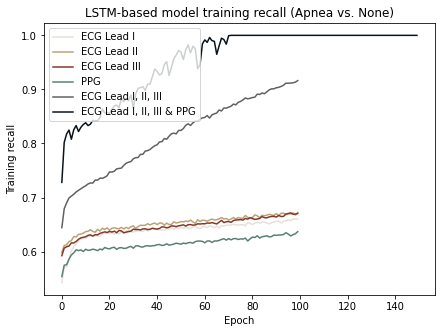

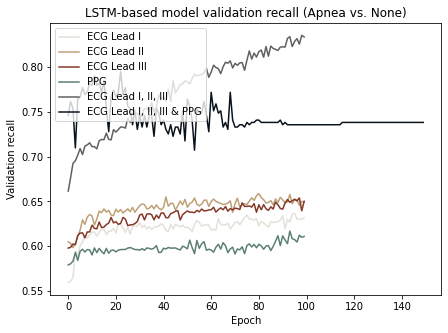

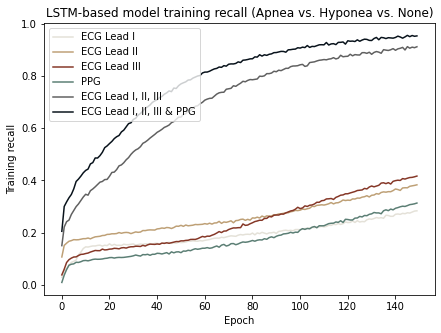

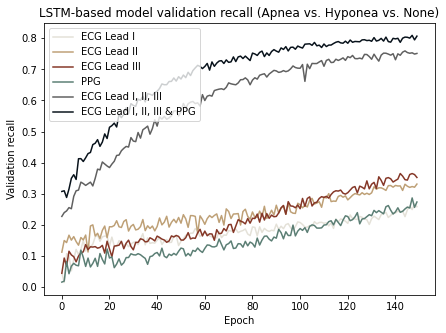

In [ ]:
# apnea vs. none
from matplotlib import pyplot as plt
plt.figure(figsize=(7,5))
plt.plot(recall1, color = (228/255, 225/255, 216/255))
plt.plot(recall2, color = (190/255, 160/255, 118/255))
plt.plot(recall3, color = (133/255, 55/255, 39/255))
plt.plot(recall4, color = (91/255, 126/255, 116/255))
plt.plot(recall5, color = (96/255, 96/255, 96/255))
plt.plot(recall6, color = (8/255, 18/255, 27/255))
plt.title('LSTM-based model training recall (Apnea vs. None)')
plt.ylabel('Training recall')
plt.xlabel('Epoch')
plt.legend(['ECG Lead I', 'ECG Lead II', 'ECG Lead III', 'PPG', 'ECG Lead I, II, III', 'ECG Lead I, II, III & PPG'], loc = 'upper left')
plt.show()

plt.figure(figsize=(7,5))
plt.plot(recall1_val, color = (228/255, 225/255, 216/255))
plt.plot(recall2_val, color = (190/255, 160/255, 118/255))
plt.plot(recall3_val, color = (133/255, 55/255, 39/255))
plt.plot(recall4_val, color = (91/255, 126/255, 116/255))
plt.plot(recall5_val, color = (96/255, 96/255, 96/255))
plt.plot(recall6_val, color = (8/255, 18/255, 27/255))
plt.title('LSTM-based model validation recall (Apnea vs. None)')
plt.ylabel('Validation recall')
plt.xlabel('Epoch')
plt.legend(['ECG Lead I', 'ECG Lead II', 'ECG Lead III', 'PPG', 'ECG Lead I, II, III', 'ECG Lead I, II, III & PPG'], loc = 'upper left')
plt.show()

# apnea vs. hyponea vs. none
plt.figure(figsize=(7,5))
plt.plot(recall11, color = (228/255, 225/255, 216/255))
plt.plot(recall22, color = (190/255, 160/255, 118/255))
plt.plot(recall33, color = (133/255, 55/255, 39/255))
plt.plot(recall44, color = (91/255, 126/255, 116/255))
plt.plot(recall55, color = (96/255, 96/255, 96/255))
plt.plot(recall66, color = (8/255, 18/255, 27/255))
plt.title('LSTM-based model training recall (Apnea vs. Hyponea vs. None)')
plt.ylabel('Training recall')
plt.xlabel('Epoch')
plt.legend(['ECG Lead I', 'ECG Lead II', 'ECG Lead III', 'PPG', 'ECG Lead I, II, III', 'ECG Lead I, II, III & PPG'], loc = 'upper left')
plt.show()

plt.figure(figsize=(7,5))
plt.plot(recall11_val, color = (228/255, 225/255, 216/255))
plt.plot(recall22_val, color = (190/255, 160/255, 118/255))
plt.plot(recall33_val, color = (133/255, 55/255, 39/255))
plt.plot(recall44_val, color = (91/255, 126/255, 116/255))
plt.plot(recall55_val, color = (96/255, 96/255, 96/255))
plt.plot(recall66_val, color = (8/255, 18/255, 27/255))
plt.title('LSTM-based model validation recall (Apnea vs. Hyponea vs. None)')
plt.ylabel('Validation recall')
plt.xlabel('Epoch')
plt.legend(['ECG Lead I', 'ECG Lead II', 'ECG Lead III', 'PPG', 'ECG Lead I, II, III', 'ECG Lead I, II, III & PPG'], loc = 'upper left')
plt.show()

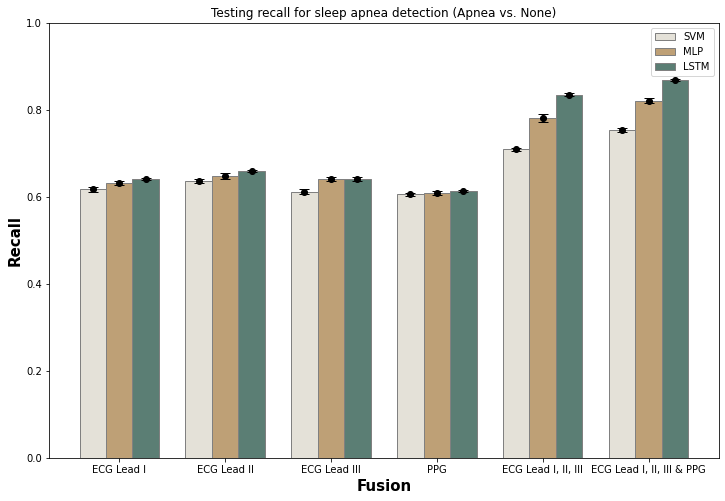

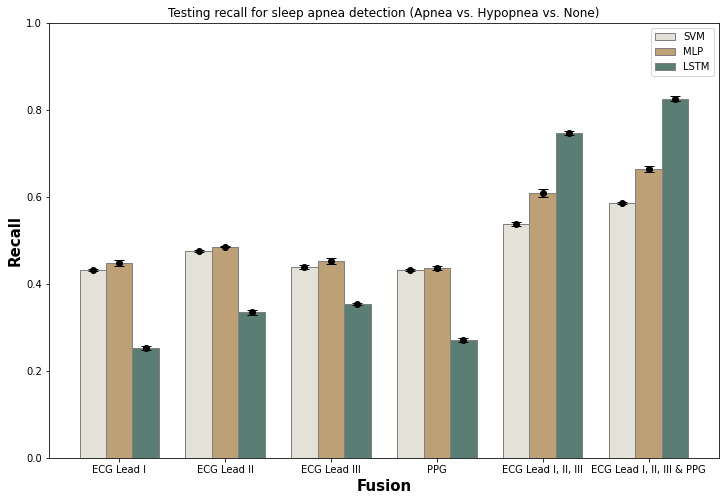

In [ ]:
# apnea vs. none
# set width of bar
barWidth = 0.25
fig = plt.subplots(figsize =(12, 8))

# set height of bar
SVM = [0.617, 0.636, 0.612, 0.606, 0.709, 0.754]
MLP = [0.632, 0.649, 0.641, 0.609, 0.782, 0.821]
LSTM = [0.641, 0.659, 0.641, 0.613, 0.835, 0.868]

SVM_std = [0.005, 0.004, 0.005, 0.004, 0.003, 0.004]
MLP_std = [0.005, 0.007, 0.005, 0.004, 0.009, 0.006]
LSTM_std = [0.003, 0.002, 0.005, 0.002, 0.004, 0.002]

# Set position of bar on X axis
br1 = np.arange(len(SVM))
br2 = [x + barWidth for x in br1]
br3 = [x + barWidth for x in br2]

# Make the plot
plt.bar(br1, SVM, color = (228/255, 225/255, 216/255), width = barWidth,
        edgecolor ='grey', label ='SVM')
plt.bar(br2, MLP, color = (190/255, 160/255, 118/255), width = barWidth,
        edgecolor ='grey', label ='MLP')
plt.bar(br3, LSTM, color = (91/255, 126/255, 116/255), width = barWidth,
        edgecolor ='grey', label ='LSTM')


plt.errorbar(br1, SVM, yerr=SVM_std, fmt="o", color="black", capsize=5)
plt.errorbar(br2, MLP, yerr=MLP_std, fmt="o", color="black", capsize=5)
plt.errorbar(br3, LSTM, yerr=LSTM_std, fmt="o", color="black", capsize=5)

# Adding Xticks
plt.xlabel('Fusion', fontweight ='bold', fontsize = 15)
plt.ylabel('Recall', fontweight ='bold', fontsize = 15)
plt.ylim(0, 1)
plt.title('Testing recall for sleep apnea detection (Apnea vs. None)')
plt.xticks([r + barWidth for r in range(len(SVM))],
        ['ECG Lead I', 'ECG Lead II', 'ECG Lead III', 'PPG', 'ECG Lead I, II, III', 'ECG Lead I, II, III & PPG'])

plt.legend()
plt.show()

# apnea vs. hyponea vs. none
# set width of bar
barWidth = 0.25
fig = plt.subplots(figsize =(12, 8))

# set height of bar
SVM = [0.431, 0.475, 0.439, 0.432, 0.538, 0.586]
MLP = [0.447, 0.485, 0.453, 0.437, 0.609, 0.665]
LSTM = [0.252, 0.335, 0.354, 0.271, 0.747, 0.826]

SVM_std = [0.002, 0.002, 0.004, 0.003, 0.004, 0.003]
MLP_std = [0.007, 0.001, 0.007, 0.005, 0.010, 0.007]
LSTM_std = [0.004, 0.006, 0.003, 0.005, 0.004, 0.005]

# Set position of bar on X axis
br1 = np.arange(len(SVM))
br2 = [x + barWidth for x in br1]
br3 = [x + barWidth for x in br2]

# Make the plot
plt.bar(br1, SVM, color = (228/255, 225/255, 216/255), width = barWidth,
        edgecolor ='grey', label ='SVM')
plt.bar(br2, MLP, color = (190/255, 160/255, 118/255), width = barWidth,
        edgecolor ='grey', label ='MLP')
plt.bar(br3, LSTM, color = (91/255, 126/255, 116/255), width = barWidth,
        edgecolor ='grey', label ='LSTM')

plt.errorbar(br1, SVM, yerr=SVM_std, fmt="o", color="black", capsize=5)
plt.errorbar(br2, MLP, yerr=MLP_std, fmt="o", color="black", capsize=5)
plt.errorbar(br3, LSTM, yerr=LSTM_std, fmt="o", color="black", capsize=5)

# Adding Xticks
plt.xlabel('Fusion', fontweight ='bold', fontsize = 15)
plt.ylabel('Recall', fontweight ='bold', fontsize = 15)
plt.ylim(0, 1)
plt.title('Testing recall for sleep apnea detection (Apnea vs. Hypopnea vs. None)')
plt.xticks([r + barWidth for r in range(len(SVM))],
        ['ECG Lead I', 'ECG Lead II', 'ECG Lead III', 'PPG', 'ECG Lead I, II, III', 'ECG Lead I, II, III & PPG'])

plt.legend()
plt.show()

In [ ]:
# Print some validation results

print("Number of rows:", dataset.shape[0])
print("Number of columns:", dataset.shape[1])
print("Number of distinct patients:", len(dataset['patient'].unique()))



# Function that, given an array of boolean values, outputs the "begin_index" and "end_index" of each contiguous block of TRUEs
def one_runs(a):
    iszero = np.concatenate(([0], np.equal(a, 1).astype(np.int8), [0]))
    absdiff = np.abs(np.diff(iszero))
    ranges = np.where(absdiff == 1)[0].reshape(-1, 2)
    return ranges




# Calculate validation data for each patient
validation_pandas = []
pbar = tqdm(desc="Processed patients", total=len(dataset['patient'].unique()))
for pat in np.unique(dataset['patient'])[np.argsort(np.unique(dataset['patient']).astype(np.int8))]:
    temp = dataset[dataset['patient'] == pat]

    tmp_null_pleth = np.asarray([np.isnan(x) for x in temp['signal_pleth']]).flatten()
    tmp_null_ecg_i = np.asarray([np.isnan(x) for x in temp['signal_ecg_i']]).flatten()
    tmp_null_ecg_ii = np.asarray([np.isnan(x) for x in temp['signal_ecg_ii']]).flatten()
    tmp_null_ecg_iii = np.asarray([np.isnan(x) for x in temp['signal_ecg_iii']]).flatten()

    pandas_row = [pat, # patient ID
                  round(len(temp) / 3600, 1), # recording duration (hours)
                  round(len(one_runs(temp['anomaly'].values)) / (len(temp) / 3600), 1), # AHI
                  len(one_runs(temp[temp['event'] != 'HYPOPNEA']['anomaly'])), # number of apnea events
                  len(one_runs(temp[(temp['event'] != 'APNEA-CENTRAL') & (temp['event'] != 'APNEA-MIXED') & (temp['event'] != 'APNEA-OBSTRUCTIVE')]['anomaly'])), # number of hypopnea events
                  round(np.mean([x[1] - x[0] + 1 for x in one_runs(temp['anomaly'].values)])), # average duration of (hypo)apnea events (seconds)
                  round(np.std([x[1] - x[0] + 1 for x in one_runs(temp['anomaly'].values)])), # standard deviation of the duration of (hypo)apnea events (seconds)
                  round(100 * np.sum(np.isnan(temp['HR(bpm)'])) / len(temp), 1), # percentage of null HR values
                  round(100 * np.sum(np.isnan(temp['SpO2(%)'])) / len(temp), 1), # percentage of null SpO2 values
                  round(100 * np.sum(np.isnan(temp['PI(%)'])) / len(temp), 1), # percentage of null PI values
                  round(100 * np.sum(np.isnan(temp['RR(rpm)'])) / len(temp), 1), # percentage of null RR values
                  round(100 * np.sum(np.isnan(temp['PVCs(/min)'])) / len(temp), 1), # percentage of null PVC values
                  round(100 * np.sum(tmp_null_pleth) / len(tmp_null_pleth), 1), # percentage of null pleth values,
                  round(100 * np.sum(tmp_null_ecg_i) / len(tmp_null_ecg_i), 1), # percentage of null ecg i values,
                  round(100 * np.sum(tmp_null_ecg_ii) / len(tmp_null_ecg_ii), 1), # percentage of null ecg ii values,
                  round(100 * np.sum(tmp_null_ecg_iii) / len(tmp_null_ecg_iii), 1), # percentage of null ecg iii values
                 ]

    validation_pandas.append(pandas_row)

    pbar.update(1)


validation_pandas = pd.DataFrame(validation_pandas, columns=['patient',
                                                             'recording duration (hrs)',
                                                             'AHI',
                                                             '# apnea events',
                                                             '# hypopnea events',
                                                             'avg duration (hypo)apnea events',
                                                             'stddev duration (hypo)apnea events',
                                                             '% null HR',
                                                             '% null SpO2',
                                                             '% null PI',
                                                             '% null RR',
                                                             '% null PVC',
                                                             '% null pleth',
                                                             '% null ecg i',
                                                             '% null ecg ii',
                                                             '% null ecg iii'
                                                            ])

display(validation_pandas)




# Boxplots of the ECG and PPG derived data
plt.figure(figsize=(20, 20))
pbar = tqdm(desc="Processed features", total=5)
for i, column in enumerate(['HR(bpm)', 'SpO2(%)', 'PI(%)', 'RR(rpm)', 'PVCs(/min)']):
    plt.subplot(5, 1, i+1)
    plot_data = []
    for pat in np.unique(dataset['patient'])[np.argsort(np.unique(dataset['patient']).astype(np.int8))]:
        temp = dataset[dataset['patient'] == pat][column]
        plot_data.append([x for x in list(temp.values) if not np.isnan(x)])
    plt.boxplot(plot_data)
    if i == 4:
        plt.xlabel("Patient ID")
    plt.ylabel(column)
    pbar.update(1)
pbar.close()
plt.show()



In [ ]:
# The following code re-assembles the time series related to each patient

patient_map_features = {} # given a patient, the map returns a map that, given feature, returns its whole time series
pbar = tqdm(desc="Processed patients", total=len(dataset['patient'].unique()))
for pat in dataset['patient'].unique():
    temp = dataset[dataset['patient'] == pat]
    feature_map_ts = {}
    for col in dataset.columns[1:]:
        if 'signal' not in col and 'PSG_' not in col:
            feature_map_ts[col] = temp[col].values
        else:
            feature_map_ts[col] = np.concatenate(temp[col].values)
    patient_map_features[pat] = feature_map_ts
    pbar.update(1)
pbar.close()


print(patient_map_features['1']['timestamp_datetime'][:5]) # for example, here are the first 5 timetamp values related to patient '1'


# PI time series of patient 1. Observe that there are some outlier values that might be usefult correcting, for example using a weighting average approach.
plt.figure(figsize=(20, 6))
plt.plot(patient_map_features['1']['PI(%)'])
plt.show()


# Missing data in patient 10's SpO2 time series
plt.figure(figsize=(20, 6))
plt.plot(patient_map_features['10']['SpO2(%)'])
plt.show()


# Outliers produced by movements in patient 10's PSG_Abdomen time series
plt.figure(figsize=(20, 6))
plt.plot(patient_map_features['2']['PSG_Abdomen'])
plt.show()


In [ ]:
# The following code generates a set of numpy arrays that can be used for machine learning purposes
# Each row of every numpy array contains information related to windows of length "window_seconds"
# Here, "PSG_" signal data is not considered

window_seconds = 60 # length, in seconds, of each data window. Here, windows are disjoint, but it might be useful to generate overlapping windows so to consider

derived_data = [] # will be a numpy array containing ECG and PPG derived data
waveform_data = [] # will be a numpy array containing ECG and PPG waveform data
label_data = [] # will be a numpy array containing the "event" and anomaly" data labels

list_patients = [] # list that keeps track of the patient ID for each row in the arrays
list_derived_columns = [] # list that keeps track of the column names in the derived_data numpy array (last dimension)
list_waveform_columns = [] # list that keeps track of the column names in the waveform_data numpy array (last dimension)
list_label_columns = [] # list that keeps track of the column names in the label_data numpy array (last dimension)


pbar = tqdm(desc="Processed patients", total=len(dataset['patient'].unique()))
for pat in patient_map_features.keys():
    num_values = len(patient_map_features[pat]['HR(bpm)'])
    max_values = (num_values // window_seconds) * window_seconds
    print("Patient", pat, " >  Discarding the last", num_values - max_values, 'seconds.')

    # Derived data
    temp_list_derived = []
    derived_colnames = []
    for col in patient_map_features[pat]:
        if np.any([x == col for x in ['HR(bpm)', 'SpO2(%)', 'PI(%)', 'RR(rpm)', 'PVCs(/min)']]):
            temp_list_derived.append(np.asarray(patient_map_features[pat][col][:max_values]).reshape(-1, window_seconds))
            derived_colnames.append(col)
    temp_list_derived = np.moveaxis(np.asarray(temp_list_derived), [0, 1, 2], [2, 0, 1])
    derived_data.append(temp_list_derived)
    if len(list_derived_columns) == 0:
        list_derived_columns = derived_colnames

    # Waveform data
    temp_list_waveform = []
    waveform_colnames = []
    for col in patient_map_features[pat]:
        if 'signal' in col:
            temp_list_waveform.append(np.asarray(patient_map_features[pat][col][:max_values*80]).reshape(-1, window_seconds, 80))
            waveform_colnames.append(col)
    temp_list_waveform = np.moveaxis(np.asarray(temp_list_waveform), [0, 1, 2, 3], [3, 0, 1, 2])
    waveform_data.append(temp_list_waveform)
    if len(list_waveform_columns) == 0:
        list_waveform_columns = waveform_colnames

    # Label data
    temp_list_label = []
    label_colnames = []
    for col in patient_map_features[pat]:
        if col == 'anomaly' or col == 'event':
            temp_list_label.append(np.asarray(patient_map_features[pat][col][:max_values]).reshape(-1, window_seconds))
            label_colnames.append(col)
    temp_list_label = np.moveaxis(np.asarray(temp_list_label), [0, 1, 2], [2, 0, 1])
    label_data.append(temp_list_label)
    if len(list_label_columns) == 0:
        list_label_columns = label_colnames

    # Auxiliary data that keeps track of the patient related to each row
    list_patients.extend([pat] * temp_list_derived.shape[0])

    pbar.update(1)
pbar.close()


derived_data = np.vstack(derived_data) # 16008 windows, of 60 seconds each, for 5 attributes
waveform_data = np.vstack(waveform_data) # 16008 windows, of 60 seconds each, 80 values per second, for 4 attributes
label_data = np.vstack(label_data) # 16008 windows, of 60 seconds each, for 2 labels

print(derived_data.shape, waveform_data.shape, label_data.shape)
print(len(list_patients), len(list_derived_columns), len(list_waveform_columns), len(list_label_columns))

# **DynNet**

In [ ]:
def isECGiClean(data):
  isClean = True
  threshold_lossy = 200
  threshold_noisy = 2.2
  peaks_ecg_i, _ = find_peaks(data, distance=50, threshold=5)
  for idx in range(len(peaks_ecg_i)-1):
    # check lossy
    if peaks_ecg_i[idx+1] - peaks_ecg_i[idx] > threshold_lossy:
      isClean = False
      return isClean
    # check noisy
    if data[peaks_ecg_i[idx+1]] / data[peaks_ecg_i[idx]] > threshold_noisy:
      isClean = False
      return isClean
  return isClean

print(isECGiClean(ecgi_corrected[57000:59000]))
print(isECGiClean(ecgi_lossy_corrected[57000:59000]))
print(isECGiClean(ecgi_noisy_corrected[57000:59000]))

def isECGiClean_final(data1, data2):
  if isECGiClean(data1) is True and isECGiClean(data2) is True:
    return True
  else:
    return False

print(isECGiClean_final(ecgi_corrected[57000:59000], ecgi_corrected[57000:59000]))
print(isECGiClean_final(ecgi_corrected[57000:59000], ecgi_lossy_corrected[57000:59000]))
print(isECGiClean_final(ecgi_corrected[57000:59000], ecgi_noisy_corrected[57000:59000]))
print(isECGiClean_final(ecgi_lossy_corrected[57000:59000], ecgi_noisy_corrected[57000:59000]))

True
False
False
True
False
False
False


In [ ]:
def isECGiiClean(data):
  isClean = True
  threshold_lossy = 200
  threshold_noisy = 2.2
  peaks_ecg_ii, _ = find_peaks(data, distance=50, threshold=5)
  for idx in range(len(peaks_ecg_ii)-1):
    # check lossy
    if peaks_ecg_ii[idx+1] - peaks_ecg_ii[idx] > threshold_lossy:
      isClean = False
      return isClean
    # check noisy
    if data[peaks_ecg_ii[idx+1]] / data[peaks_ecg_ii[idx]] > threshold_noisy:
      isClean = False
      return isClean
  return isClean

print(isECGiiClean(ecgii_corrected[57000:59000]))
print(isECGiiClean(ecgii_lossy_corrected[57000:59000]))
print(isECGiiClean(ecgii_noisy_corrected[57000:59000]))

def isECGiiClean_final(data1, data2):
  if isECGiiClean(data1) is True and isECGiiClean(data2) is True:
    return True
  else:
    return False

print(isECGiiClean_final(ecgii_corrected[57000:59000], ecgii_corrected[57000:59000]))
print(isECGiiClean_final(ecgii_corrected[57000:59000], ecgii_lossy_corrected[57000:59000]))
print(isECGiiClean_final(ecgii_corrected[57000:59000], ecgii_noisy_corrected[57000:59000]))
print(isECGiiClean_final(ecgii_lossy_corrected[57000:59000], ecgii_noisy_corrected[57000:59000]))

True
False
False
True
False
False
False


In [ ]:
def isPPGClean(data):
  isClean = True
  threshold_lossy = 200
  threshold_noisy = 2.2
  # check noisy
  peaks_ppg, _ = find_peaks(data, distance=50, threshold=5)
  for idx in range(len(peaks_ppg)-1):
    if data[peaks_ppg[idx+1]] / data[peaks_ppg[idx]] > threshold_noisy:
      isClean = False
      return isClean
  # check lossy
  peaks_ppg, _ = find_peaks(data, distance=90, threshold=0.3)
  for idx in range(len(peaks_ppg)-1):
    if peaks_ppg[idx+1] - peaks_ppg[idx] > threshold_lossy:
      isClean = False
      return isClean
  return isClean

print(isPPGClean(pleth_corrected[57000:59000]))
print(isPPGClean(pleth_lossy_corrected[57000:59000]))
print(isPPGClean(pleth_noisy_corrected[57000:59000]))

def isPPGClean_final(data1, data2):
  if isPPGClean(data1) is True and isPPGClean(data2) is True:
    return True
  else:
    return False

print(isPPGClean_final(pleth_corrected[57000:59000], pleth_corrected[57000:59000]))
print(isPPGClean_final(pleth_corrected[57000:59000], pleth_lossy_corrected[57000:59000]))
print(isPPGClean_final(pleth_corrected[57000:59000], pleth_noisy_corrected[57000:59000]))
print(isPPGClean_final(pleth_lossy_corrected[57000:59000], pleth_noisy_corrected[57000:59000]))

True
False
False
True
False
False
False


In [ ]:
isECGiClean = isECGiClean_final(ecgi_corrected[57000:59000], ecgi_corrected[57000:59000])
isECGiiClean = isECGiiClean_final(ecgii_corrected[57000:59000], ecgii_corrected[57000:59000])
isPPGClean = isPPGClean_final(pleth_corrected[57000:59000], pleth_corrected[57000:59000])

if isECGiClean is True and isECGiiClean is True and isPPGClean is True:
  # classifier 1: ecgi, ecgii, ppg
  model = pickle.load(open('/content/drive/MyDrive/FYP/model1.pkl', 'rb'))
  _, accuracy = model.evaluate([X_test[:,:,0:3], X_test[:,:,3:6], X_test[:,:,9:12]], y_test, batch_size=32, verbose=150)
elif isECGiClean is False and isECGiiClean is True and isPPGClean is True:
  # classifer 2: ecgii, ppg
  model = pickle.load(open('/content/drive/MyDrive/FYP/model2.pkl', 'rb'))
  _, accuracy = model.evaluate([X_test[:,:,3:6], X_test[:,:,9:12]], y_test, batch_size=32, verbose=150)
elif isECGiClean is True and isECGiiClean is False and isPPGClean is True:
  # classifier 3: ecgi, ppg
  model = pickle.load(open('/content/drive/MyDrive/FYP/model3.pkl', 'rb'))
  _, accuracy = model.evaluate([X_test[:,:,0:3], X_test[:,:,9:12]], y_test, batch_size=32, verbose=150)
elif isECGiClean is True and isECGiiClean is True and isPPGClean is False:
  # classifer 4: ecgi, ecgii
  model = pickle.load(open('/content/drive/MyDrive/FYP/model4.pkl', 'rb'))
  _, accuracy = model.evaluate([X_test[:,:,0:3], X_test[:,:,3:6]], y_test, batch_size=32, verbose=150)
elif isECGiClean is False and isECGiiClean is False and isPPGClean is True:
  # classifier 5: ppg
  model = pickle.load(open('/content/drive/MyDrive/FYP/model5.pkl', 'rb'))
  _, accuracy = model.evaluate([X_test[:,:,9:12]], y_test, batch_size=32, verbose=150)
elif isECGiClean is False and isECGiiClean is True and isPPGClean is False:
  # classifer 6: ecgii
  model = pickle.load(open('/content/drive/MyDrive/FYP/model6.pkl', 'rb'))
  _, accuracy = model.evaluate([X_test[:,:,3:6]], y_test, batch_size=32, verbose=150)
elif isECGiClean is False and isECGiiClean is False and isPPGClean is False:
  # classifer 7: ecgi
  model = pickle.load(open('/content/drive/MyDrive/FYP/model7.pkl', 'rb'))
  _, accuracy = model.evaluate([X_test[:,:,0:3]], y_test, batch_size=32, verbose=150)